#▪ 프로젝트 개요

###프로젝트명: 모두의주차장 Google playstore, Appstore 리뷰 분석

###프로젝트 목표
- 모두의주차장에 대한 Google playstore와 Appstore리뷰를 크롤링하여 수집하고 자연어처리를 통해 분석한다.  
- 유사한서비스를 제공하는 기업들의 서비스 내용을 비교하고, 리뷰를 분석하여 각 기업의 장단점을 확인한다.  
- 위의 내용을 종합하여 리뷰데이터에서 발견한 인사이트를 모두의주차장 서비스품질 향상을 위한 전략수립에 활용한다.


###프로젝트 가설  
리뷰데이터의 평점을 활용하여 고객의 만족/ 불만족사항을 주제별로 나누어 파악하여 분석할 수 있다.


###분석과제 설정  
1.  비교적 최근인 2020년과 2021년 리뷰데이터를 분석하여 고객의 만족/불만족사항을 주제별로 분석한다.
2. 연도별 리뷰수 그래프를 확인해보았을 때, 2016년의 리뷰수가 전, 후년도에 비해서 2배이상 많았다. 해당 년도의 리뷰를 살펴보고, 원인을 추측해본다.
3. 유사 서비스를 제공하는 앱들의 서비스내용을 비교하고, 리뷰를 통해 고객이 체감하는 장단점을 확인한다.


###사용한 분석방법
 - TopicModeling  
토픽 모델(Topic model)이란 문서 집합의 추상적인 "주제(토픽)”를 발견하기 위한 통계적 모델 중 하나로, 텍스트 본문의 숨겨진 의미구조를 발견하기 위해 사용되는 텍스트 마이닝 기법 중 하나이다. 그중에서도 잠재 디리클레 할당(LDA)을 이용한 토픽모델링은 주어진 문서에 대하여 각 문서에 어떤 주제들이 존재하는지를 서술하는 확률적 토픽모델 기법중의 하나로, 미리 알고 있는 주제별 단어 수 분포를 바탕으로, 주어진 문서에서 발견된 단어 수 분포를 분석함으로써 해당 문서가 어떤 주제들을 다루고 있는지 확인할 수 있다. 이를 이용하여 수집된 만족/불만족 리뷰들이 각각 어떤 주제로 나뉘어지는지 확인해 볼 수 있다.

 - TF-IDF Vectorizing 활용한 단어출현빈도 확인  
문서를 벡터화 하는 방법중의 하나인 TF-IDF(Term Frequency – Inverse Document Frequency)인코딩은 단어를 갯수 그대로 카운트하지 않고 모든 문서에 공통적으로 들어있는 단어의 경우 문서 구별 능력이 떨어진다고 보아 가중치를 축소하는 방법이다. 리뷰에 등장하는 단어의 빈도에 대해 비율적으로 중요도를 추출하여 어떤 단어들이 높은 빈도로 리뷰에 쓰였는지 확인해볼 수 있다. 특정 단어가 높은 빈도로 출현하면 핵심단어임을 추측해볼 수 있다.

 - WordCloud  
단어의 출현빈도를 시각화하는 방법이다. Wordcloud에서 보이는 단어중 큰 단어가 출현빈도가 큰 단어이고, 작은 단어는 상대적으로 출현빈도가 낮은 단어이다. 

 - K-NearestNeighbors  
판별하고 싶은 데이터를 입력 받았을때 가장 인접한 데이터를 찾아주는 알고리즘이다. 벡터화한 리뷰 데이터에서 찾고자하는 특정 단어와 유사한 리뷰를 찾아 확인할 수 있다.


###내용순서
 1. 리뷰데이터 수집 및 분석
 2. 모두의주차장 	
   - 토픽모델링 및 빈도수 활용한 리뷰분석
 3. 기타 주차앱(아이파킹, 티맵, 파키프렌즈, 파킹박)
	 - 토픽모델링 통한 리뷰 분석
 4. 앱별 토픽모델링 결과 비교분석
 5. 결론 및 제안

#▪ 설치 및 모듈

In [ ]:
# konlpy
!apt-get update
!apt-get install g++ openjdk-8-jdk 
!pip3 install konlpy wordcloud
!pip3 install konlpy
#맞춤법검사
!pip install git+https://github.com/ssut/py-hanspell.git
#genisim
!pip install gensim
#pyLDAvis
!pip install pyLDAvis
#apori
!pip install apyori
#폰트
# !apt-get install fonts-nanum*
# !apt-get install fontconfig
# !fc-cache -fv
# !cp /usr/share/fonts/truetype/nanum/Nanum* /usr/local/lib/python3.6/dist-packages/matplotlib/mpl-data/fonts/ttf/
# !rm -rf /content/.cache/matplotlib/*
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [ ]:
# 패키지 호출
# from selenium import webdriver
from bs4 import BeautifulSoup
import time
from urllib.request import urlopen
from urllib.parse import quote_plus
# from selenium.webdriver.common.keys import Keys
import time
import sys
import os
from datetime import datetime
import datetime as dt
import re
import pandas as pd
import numpy as np

#graph
import matplotlib.pyplot as plt
from matplotlib import font_manager as fm
from matplotlib import rc
import seaborn as sns
import matplotlib as mpl
%matplotlib inline
import plotly.express as px
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina'

#konlpy
import konlpy
from konlpy.tag import Kkma, Komoran, Okt, Twitter, Hannanum
kkma= Kkma()
komoran= Komoran()
okt= Okt()
twitter=Twitter()
hannanum= Hannanum()

#벡터화
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
from sklearn.neighbors import NearestNeighbors
import networkx as nx

#한글 맞춤법 검사
from hanspell import spell_checker
# from soyspacing.countbase import CountSpace


from collections import Counter
import gensim
from gensim import corpora, models
from gensim.models import CoherenceModel, Word2Vec
# from pandas.core.computation.check import NUMEXPR_INSTALLED
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from sklearn.manifold import TSNE

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working



#▪ 리뷰 크롤링 및 분석

## #- App Store
- 322건 수집
- 이름/평점/날짜/리뷰내용
- 2013.12 - 2021.06

In [ ]:
#앱스토어 크롤링 불러오기
from google.colab import files
uploaded = files.upload()

Saving modu_apple_review.csv to modu_apple_review (2).csv


In [ ]:
df_app=pd.read_csv('modu_apple_review.csv')
#날짜로 변경
df_app['date']=pd.to_datetime(df_app["date"])
# 최근 순 정렬
df_app=df_app.sort_values(by='date', ascending=False)
df_app

,name,ratings,date,comment
293,제발 읽어보시고 쓰지마세요,1,2021-06-11,절대쓰지마세요 구매했는데 사용이 안되서 현장에서 개인 결제하고 환불해달라고 요구했는...
83,明日買いに植え,2,2021-06-01,결제가 안되네요 아이폰 12프로ㅜ멕스 쓰고있는데 결제 버튼 누르면 어플이 죽어버려요
294,휘스라,1,2021-05-30,막무가내 토요일 선정릉역 모타워 휴일 종일권 끊고 들어갔는데
88,관리좀잘하세요,1,2021-05-25,별하나도 아깝습니다 별하나도 아까워요
97,fnwiowhnfxm,1,2021-05-17,정당하게 결제했는데 딱지날라옴 정직하게 결제하고 시간 이용다 안하고 나갔는데 주차위...
...,...,...,...,...
200,Onesituation,5,2013-12-23,응원합니다 좋은 앱인것 같습니다 다듬으면 킬링앱일거 같네요
180,gq.wonseok,1,2013-12-23,앱에 오류있는듯 가입하는 과정에서 차 번호 넣어야 하는데 제대로된 번호를 넣어도 변...
140,바람잔차,5,2013-12-23,참으로 유용합니다 주차장 배회를 예방할 수 있어서 매우 유용합니다 가격도 나오고 게...
160,베리베리굿~~,5,2013-12-23,드디어 나왔네요 모르는곳에 주자치장 찾기 쉽지 않았는데 정밀 요긴할것 같네요 앞으로...


In [ ]:
# 데이터 정보
df_app.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 322 entries, 293 to 220
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   name     322 non-null    object        
 1   ratings  322 non-null    int64         
 2   date     322 non-null    datetime64[ns]
 3   comment  322 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 12.6+ KB


In [ ]:
#중복데이터 확인
df_app.duplicated().sum()
#결측값 확인
df_app.isna().sum()

name       0
ratings    0
date       0
comment    0
dtype: int64

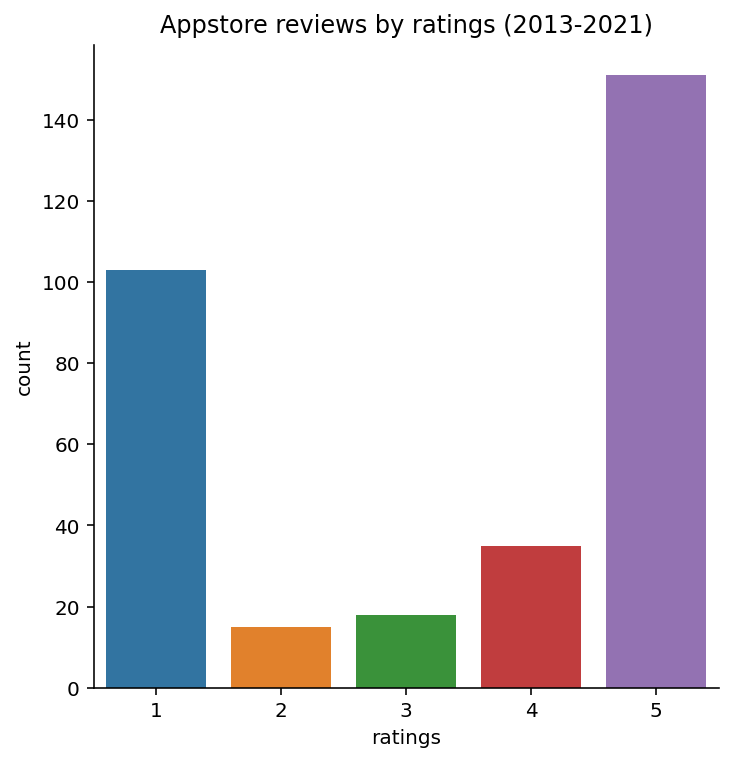

In [ ]:
# 별점 분포 확인
# print(df_app['ratings'].value_counts())
sns.factorplot('ratings',kind='count',data=df_app);
plt.title("Appstore reviews by ratings (2013-2021)");

#ignore warning
import warnings
warnings.filterwarnings("ignore")

앱스토어 2013년 12월 ~ 2021년 06월 별점 분포
- ⭐ : 103 개 (31.9 %)
- ⭐⭐ : 15 개 (4.6 %)
- ⭐⭐⭐ : 18 개 (5.5 %)
- ⭐⭐⭐⭐ : 35 개 (10.8 %)
- ⭐⭐⭐⭐⭐ : 151 개 (46.8 %)

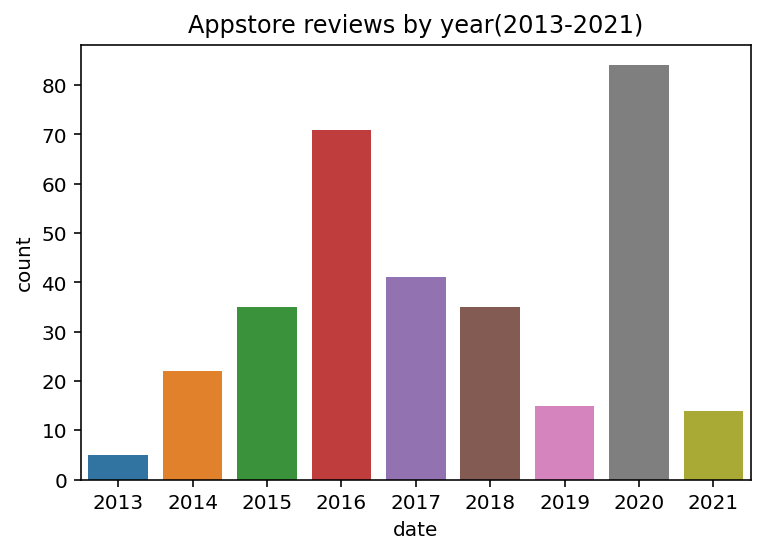


       review_count  percentage
2021            14    4.347826
2020            84   26.086957
2019            15    4.658385
2018            35   10.869565
2017            41   12.732919
2016            71   22.049689
2015            35   10.869565
2014            22    6.832298
2013             5    1.552795


In [ ]:
#연도별 리뷰 수
element_count = {}

for item in df_app["date"].dt.year:
    element_count.setdefault(item,0)
    element_count[item] += 1
    
review_count = pd.DataFrame.from_dict(element_count, orient = 'index',columns=["review_count"])
review_count['percentage'] = (review_count['review_count'] / review_count['review_count'].sum()) * 100

#날짜별 분포확인
sns.countplot(df_app["date"].dt.year);
plt.title("Appstore reviews by year(2013-2021)");
plt.show()
print('\n',review_count)

Text(0.5, 1.0, 'Appsotre ratings distribution by year')

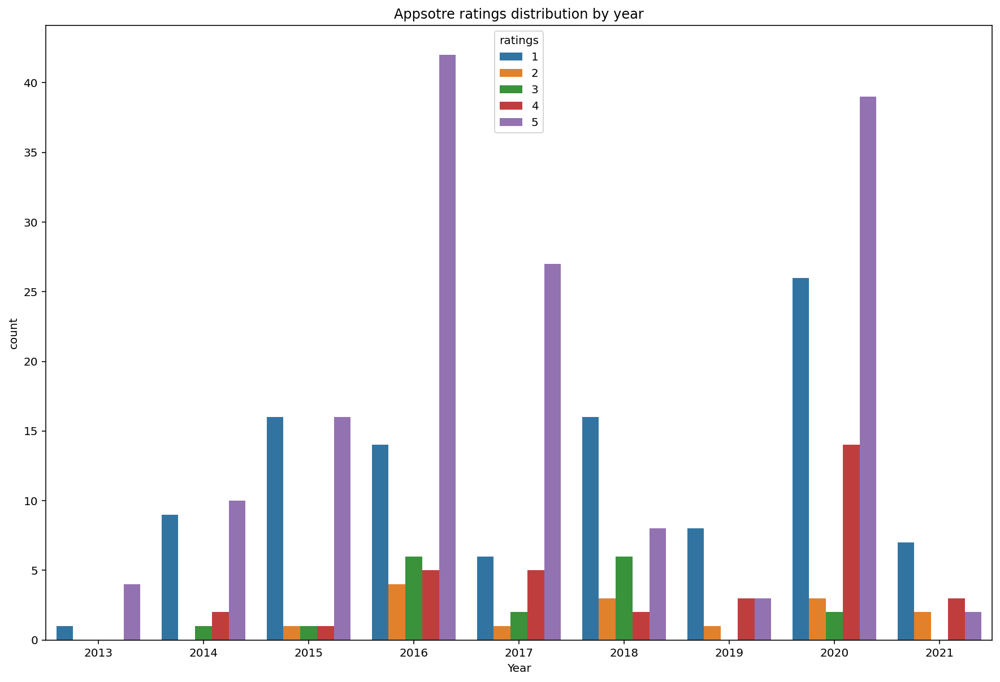

In [ ]:
# 연도별 별점 분포
plt.figure(figsize=(15,10));
sns.countplot(df_app["date"].dt.year, hue=df_app["ratings"])
plt.xlabel("Year")
plt.title("Appsotre ratings distribution by year")

- 총 리뷰 수는 2020년이 가장 많지만, 5점을 가장 많이 받은 년도는 2016년이다.
- 2016년과 2017년에 5점과 1점의 격차가 큰 것으로 보아, 4-5년 전 앱스토어 유저들의 어플 호감도가 높았던 것으로 추측된다.
- 2018년부터 앱스토어의 불만족 유저가 점차 증가했음을 알 수 있으며, 2020년에 만족 유저가 크게 증가하였지만 주차어플을 사용하는 어떤 부분에 불편함이 많은 것으로 보인다.

## #- Play Store
- 1027건 수집
- 이름/평점/날짜/리뷰내용
- 2013.08 - 2021.06

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving modu_playstore_review.csv to modu_playstore_review.csv


In [ ]:
df_play=pd.read_csv('modu_playstore_review.csv')
#날짜로 변경
df_play['date']=pd.to_datetime(df_play["date"])
# 최근 순 정렬
df_play=df_play.sort_values(by='date', ascending=False)
df_play

,name,ratings,date,comment
21,윤정현,1,2021-06-29,상담원지멋대로고 말이안통해여
410,뿡뿡이,5,2021-06-27,최고조앙
1,성이름,1,2021-06-24,이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연...
403,놉!,5,2021-06-23,굿
4,정헌수,4,2021-06-22,저렴하고 아주 좋습니다. 강추 다만 강남의 일부 주차장 정보가 정확하지 않아 별 4...
...,...,...,...,...
961,sangwoo youn,2,2013-08-08,다운 받고 실행하자마자 오류 났다고 꺼져버리네요ㅜㅜ
960,신나리,5,2013-08-02,좋아요!!!!꼭다운로드해야할앱인것같아요~!!!너무너무유용해요ㅎㅎㅎ
963,울꼬꼬마,5,2013-08-02,좋아요. ㅎ
964,송호치,5,2013-08-02,ㅇ


In [ ]:
df_play.sort_values(by='date')

,name,ratings,date,comment
962,김정호,5,2013-08-02,이거참 괜찮네요 오호
960,신나리,5,2013-08-02,좋아요!!!!꼭다운로드해야할앱인것같아요~!!!너무너무유용해요ㅎㅎㅎ
964,송호치,5,2013-08-02,ㅇ
963,울꼬꼬마,5,2013-08-02,좋아요. ㅎ
961,sangwoo youn,2,2013-08-08,다운 받고 실행하자마자 오류 났다고 꺼져버리네요ㅜㅜ
...,...,...,...,...
4,정헌수,4,2021-06-22,저렴하고 아주 좋습니다. 강추 다만 강남의 일부 주차장 정보가 정확하지 않아 별 4...
403,놉!,5,2021-06-23,굿
1,성이름,1,2021-06-24,이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연...
410,뿡뿡이,5,2021-06-27,최고조앙


In [ ]:
# 데이터 정보
df_play.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1032 entries, 21 to 962
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   name     1032 non-null   object        
 1   ratings  1032 non-null   int64         
 2   date     1032 non-null   datetime64[ns]
 3   comment  1028 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 40.3+ KB


In [ ]:
#중복데이터 확인
df_play.duplicated().sum()
#결측값 확인
df_play.isna().sum()

name       0
ratings    0
date       0
comment    4
dtype: int64

In [ ]:
#결측값 삭제
df_play = df_play.dropna()
df_play.isna().sum()

name       0
ratings    0
date       0
comment    0
dtype: int64

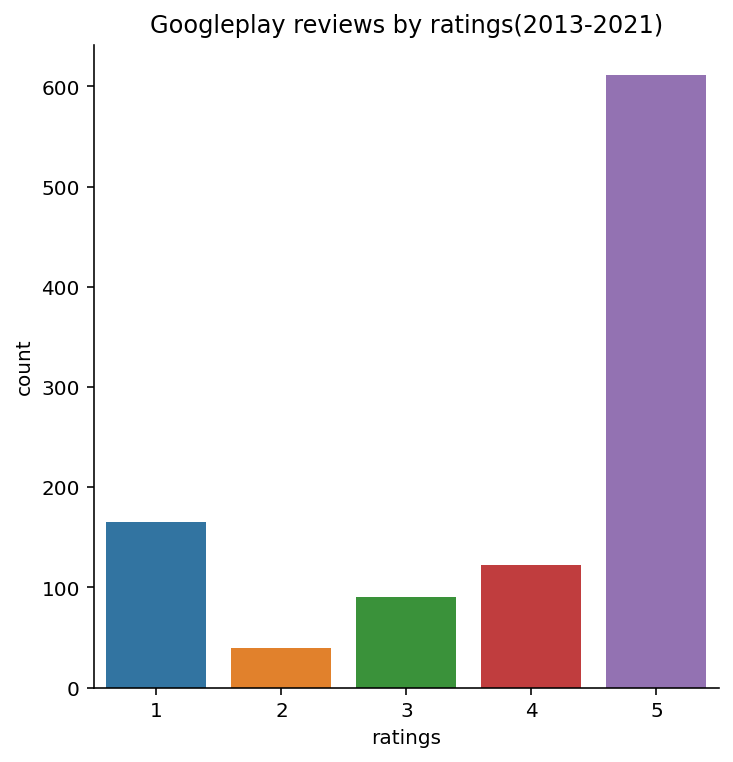

In [ ]:
# 별점 분포 확인
# print(df_play['ratings'].value_counts(normalize=True))
import matplotlib.pyplot as plt
import seaborn as sns 
sns.factorplot('ratings',kind='count',data=df_play);
plt.title("Googleplay reviews by ratings(2013-2021)");

#ignore warning
import warnings
warnings.filterwarnings("ignore")

구글플레이 2013년 08월 ~ 2021년 06월 별점 분포

- ⭐ : 165 개 (16.0 %)
- ⭐⭐ : 40 개 (3.8 %)
- ⭐⭐⭐ : 90 개 (8.7 %)
- ⭐⭐⭐⭐ : 122 개 (11.8 %)
- ⭐⭐⭐⭐⭐ : 611 개 (59.4 %)

- 구글플레이 앱 리뷰가 앱스토어 리뷰보다 1점 비율이 약 16% 낮고, 5점 비율이 약 13% 높다.
- 앱스토어 유저보다 구글플레이 앱 유저의 수가 많고(고객데이터), 리뷰 또한 약 3배 많다.

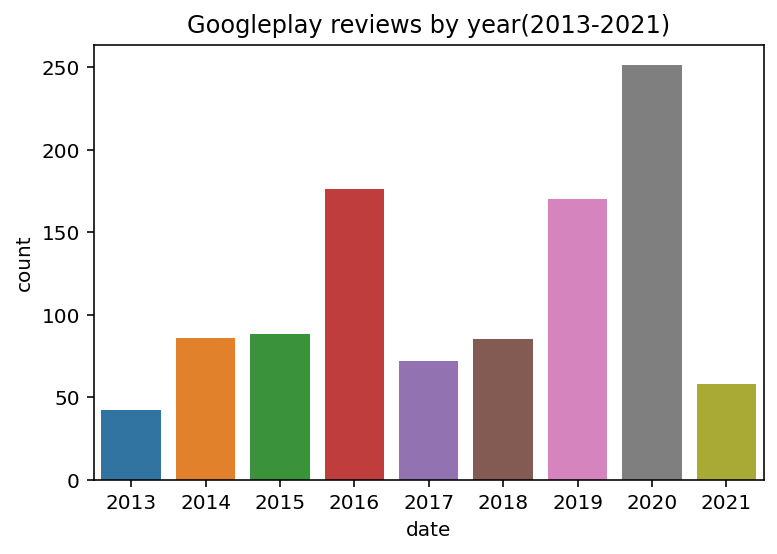


       review_count  percentage
2021            58    5.642023
2020           251   24.416342
2019           170   16.536965
2018            85    8.268482
2017            72    7.003891
2016           176   17.120623
2015            88    8.560311
2014            86    8.365759
2013            42    4.085603


In [ ]:
#연도별 리뷰 수
element_count = {}

for item in df_play["date"].dt.year:
    element_count.setdefault(item,0)
    element_count[item] += 1
    
review_count = pd.DataFrame.from_dict(element_count, orient = 'index',columns=["review_count"])
review_count['percentage'] = (review_count['review_count'] / review_count['review_count'].sum()) * 100

#날짜별 분포 수
sns.countplot(df_play["date"].dt.year);
plt.title("Googleplay reviews by year(2013-2021)");
plt.show()
print('\n',review_count)

- 전반적으로 앱스토어와 비슷한 분포이다.
- 하지만, 앱스토어의 2019년 리뷰의 수가 4.6%으로 현저히 적은 반면 구글스토어의 2019년 리뷰 수는 16.5%으로 꽤 많다.
- 앱스토어 리뷰 분포와 비슷하게 16년도에 리뷰가 2배 증가하고 17년도에 다시 줄어듦을 알 수 있다.
- 이후 16년도 리뷰수가 증가한 이유를 리뷰 토픽모델링이나 빈도를 통해 확인해보고자 한다.

Text(0.5, 1.0, 'Googleplay ratings distribution by year')

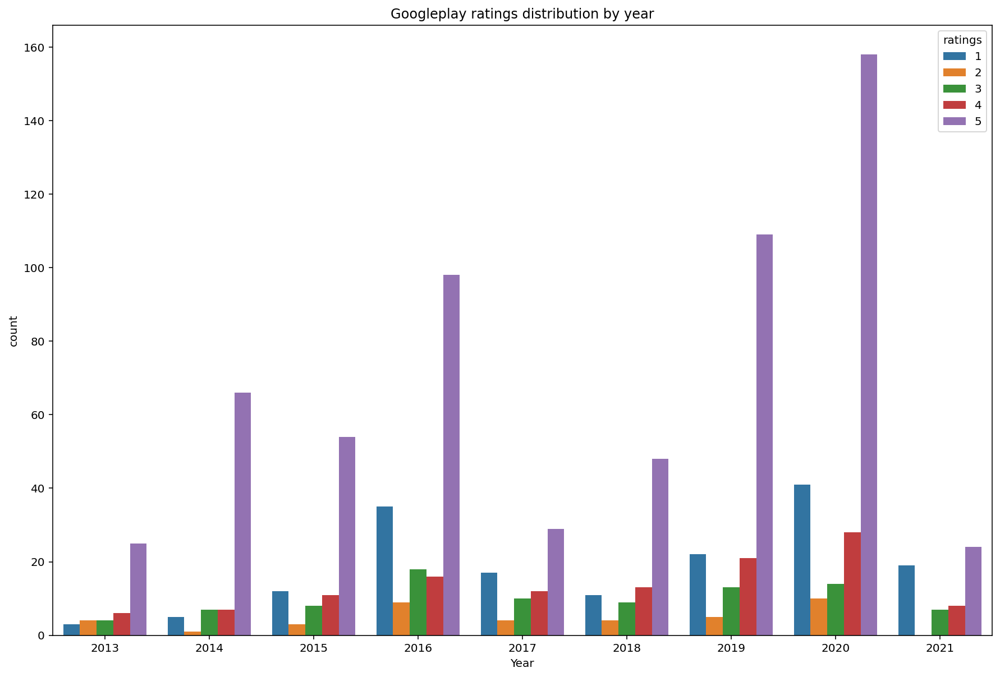

In [ ]:
#구글스토어 연도별 별점 분포도
plt.figure(figsize=(15,10));
sns.countplot(df_play["date"].dt.year, hue=df_play["ratings"])
plt.xlabel("Year")
plt.title("Googleplay ratings distribution by year")

- 구글 스토어 리뷰의 5점평 비율이 높기 때문에 5점 그래프(보라색)는 연도별 리뷰 수 그래프와 거의 비례함을 알 수 있다.
- 전반적으로 5점평의 비율이 매우 높지만, 21년 현재의 경우 1점의 비율이 꽤 높은 것을 알 수 있다. 

## #- 데이터 Concatenating
 - 1349건
 - 이름/평점/날짜/리뷰내용
 - 2013.08 - 2021.06

In [ ]:
print(df_app.shape, df_play.shape)

(322, 4) (1028, 4)


In [ ]:
#앱스토어,구글플레이 데이터 병합 및 정렬
concat_df = pd.concat([df_app, df_play]) # row bind : axis = 0, default
concat_df = concat_df.sort_values(by='date',ascending=False)
concat_df

,name,ratings,date,comment
21,윤정현,1,2021-06-29,상담원지멋대로고 말이안통해여
410,뿡뿡이,5,2021-06-27,최고조앙
1,성이름,1,2021-06-24,이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연...
403,놉!,5,2021-06-23,굿
4,정헌수,4,2021-06-22,저렴하고 아주 좋습니다. 강추 다만 강남의 일부 주차장 정보가 정확하지 않아 별 4...
...,...,...,...,...
961,sangwoo youn,2,2013-08-08,다운 받고 실행하자마자 오류 났다고 꺼져버리네요ㅜㅜ
960,신나리,5,2013-08-02,좋아요!!!!꼭다운로드해야할앱인것같아요~!!!너무너무유용해요ㅎㅎㅎ
963,울꼬꼬마,5,2013-08-02,좋아요. ㅎ
964,송호치,5,2013-08-02,ㅇ


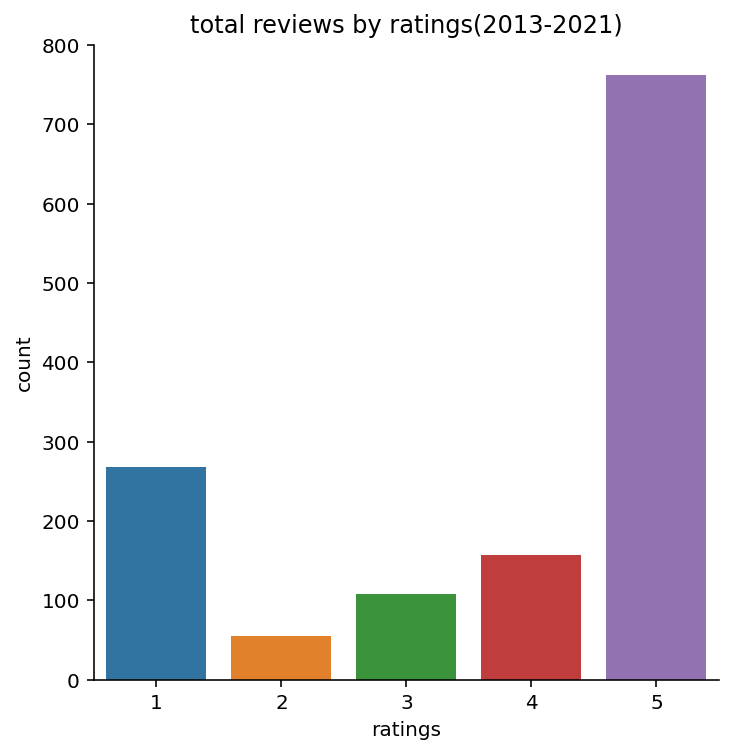

In [ ]:
# 별점 분포 확인
# print(df['ratings'].value_counts(normalize=True))
import matplotlib.pyplot as plt
import seaborn as sns 
sns.factorplot('ratings',kind='count',data=concat_df);
plt.title("total reviews by ratings(2013-2021)");

#ignore warning
import warnings
warnings.filterwarnings("ignore")

전체 리뷰 2013년 12월 ~ 2021년 06월 별점 분포
- ⭐ : 268 개 (19.8 %)
- ⭐⭐ : 55 개 (4.0 %)
- ⭐⭐⭐ : 108 개 (8.0 %)
- ⭐⭐⭐⭐ : 157 개 (11.6 %)
- ⭐⭐⭐⭐⭐ : 762 개 (56.4 %)

Text(0.5, 1.0, 'ratings distribution by Year')

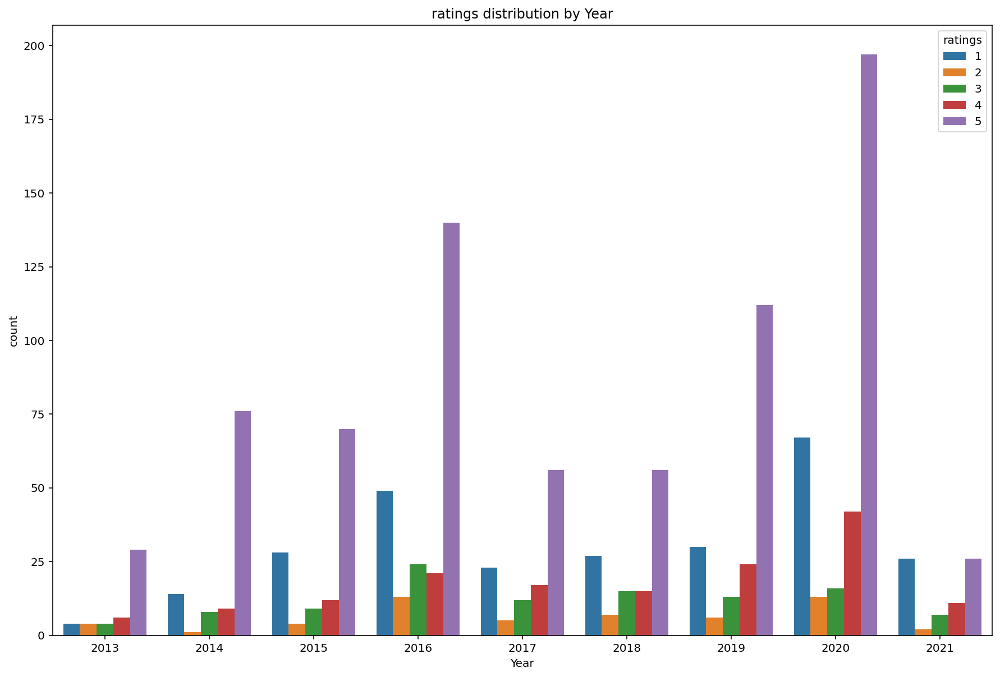

In [ ]:
#전체 리뷰 연도별 별점 분포
plt.figure(figsize=(15,10));
sns.countplot(concat_df["date"].dt.year, hue=concat_df["ratings"])
plt.xlabel("Year")
plt.title("ratings distribution by Year")

- 2021년 총 리뷰 수는 많지 않지만 불만족 비율이 다소 높다.
- 지난 과거부터 최근까지의 고객 불만족 리뷰를 분석해 주요 문제를 발견하고 해결방안을 모색해야한다. 
- 경쟁기업과의 비교분석을 통해 각 기업의 장단점을 찾고 미래 주차산업의 변화에 대처할 인사이트를 얻는다.

In [ ]:
#2020년 이후 데이터 사용 (407개 리뷰)
df = concat_df[concat_df['date'] >= '2020-01-01']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 407 entries, 21 to 241
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   name     407 non-null    object        
 1   ratings  407 non-null    int64         
 2   date     407 non-null    datetime64[ns]
 3   comment  407 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 15.9+ KB


In [ ]:
import os
os.makedirs('result', exist_ok=True)
filename = datetime.now().strftime('result/%Y-%m-%d_%H-%M-%S.csv')
df.to_csv(filename,encoding='utf-8-sig', index=False)

#1.모두의 주차장

### A. 평점 기준 데이터 분리 (2020-2021) : 만족/불만족

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving modu_review.csv to modu_review.csv


In [ ]:
#2020년 이후 리뷰
df = pd.read_csv('modu_review.csv')
df

,name,ratings,date,comment
0,뿡뿡이,5,2021-06-27,최고조앙
1,성이름,1,2021-06-24,이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연...
2,놉!,5,2021-06-23,굿
3,정헌수,4,2021-06-22,저렴하고 아주 좋습니다. 강추 다만 강남의 일부 주차장 정보가 정확하지 않아 별 4...
4,홍삼,3,2021-06-19,다시 사용 하려니까 휴면 상태가 됐어요 고쳐주세요
...,...,...,...,...
401,뵤뷰,1,2020-01-11,이중결제 앱결제해도 주차장이랑 연동이 안돼서
402,지현석,5,2020-01-10,도움 많이 받고 있습니다만 주차장 정보에 주차장 높이도 같이 나왔으면 좋겠습니다. ...
403,레서판다,1,2020-01-09,업뎃 후 작동 안함 앱실행시 튕김
404,정현수,5,2020-01-08,1시간 2시간주차말고 월주차를 볼수있는 방법은 없나요??


#### 1) 만족 리뷰 (평점 5점)

In [ ]:
#2020년 이후& 5점 리뷰
all_review = df[df['ratings'] == 5]['comment']
all_review[:3]

0                                                 최고조앙
2                                                    굿
9    잘 사용하고 있습니다 그런데 공유주창에 주차를 할 때 저공해 할인은 적용이 안 되는...
Name: comment, dtype: object

##### ▶ 토픽모델링

In [ ]:
#전처리
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review[:3]

0                                                 최고조앙
2                                                    굿
9    잘 사용하고 있습니다 그런데 공유주창에 주차를 할 때 저공해 할인은 적용이 안 되는...
Name: comment, dtype: object

In [ ]:
#to_list
all_review = all_review.to_list()
all_review[:10]

['최고조앙',
 '굿',
 '잘 사용하고 있습니다 그런데 공유주창에 주차를 할 때 저공해 할인은 적용이 안 되는 건가요 적용 방법이 있는지 궁금합니다',
 '좋아요 편리하고',
 '어플 자체는 편리하고 좋아요 그런데 빈자리에 가보면 항상 불법주차 차들이 가득합니다 막상 신고하려고 전화하면 단속하러 오지도 않고 차주한테 전화해서 빼달라고 하라는데 그러지말고 신고 기능을 넣어주면 좋겠습니다',
 '너무조아여',
 '공유주차 시간수정이 안됩니다 얼마 전부터 갑자기 공유주차 시간 수정이 안됩니다',
 '좋아요',
 '좋아요',
 '너무 좋은 앱입니다']

In [ ]:
#불용어
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어는 빼보았습니다.
review_stop_words = review_stop_words.split(' ')
review_stop_words

# 명사, 형용사만
tagger = Okt()
texts = []
for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['최고', '조앙'],
 ['굿'],
 ['사용',
  '있다',
  '공유',
  '주창',
  '공해',
  '할인',
  '적용',
  '안',
  '건가',
  '적용',
  '방법',
  '있다',
  '궁금하다'],
 ['좋다', '편리하다'],
 ['자체',
  '편리하다',
  '좋다',
  '빈자리',
  '항상',
  '불법',
  '차',
  '가득하다',
  '막상',
  '신고',
  '전화하다',
  '단속',
  '오지',
  '차주',
  '전화하다',
  '빼',
  '달라',
  '하라',
  '데',
  '그렇다',
  '신고',
  '기능',
  '좋다'],
 ['무조', '여'],
 ['공유', '시간', '정이', '안되다', '얼마', '전', '갑자기', '공유', '시간', '수정', '안되다'],
 ['좋다'],
 ['좋다'],
 ['좋다', '이다']]

In [ ]:
from gensim import corpora, models

dictionary = corpora.Dictionary(texts)    # corpora는 corpus의 복수형. 말뭉치가 여러개 있는 것으로 생각하면 됨
# 문서 데이터를 Dictionary 클래스 생성시 전달하면 사전을 만들 수 있음
print(dictionary.token2id)
# 사전에서 생성된 각각의 토큰들의 id 들이 생성되는데, 이를 확인한 것

{'조앙': 0, '최고': 1, '굿': 2, '건가': 3, '공유': 4, '공해': 5, '궁금하다': 6, '방법': 7, '사용': 8, '안': 9, '있다': 10, '적용': 11, '주창': 12, '할인': 13, '좋다': 14, '편리하다': 15, '가득하다': 16, '그렇다': 17, '기능': 18, '단속': 19, '달라': 20, '데': 21, '막상': 22, '불법': 23, '빈자리': 24, '빼': 25, '신고': 26, '오지': 27, '자체': 28, '전화하다': 29, '차': 30, '차주': 31, '하라': 32, '항상': 33, '무조': 34, '여': 35, '갑자기': 36, '수정': 37, '시간': 38, '안되다': 39, '얼마': 40, '전': 41, '정이': 42, '이다': 43, '가능하다': 44, '금액': 45, '비교': 46, '이용': 47, '저렴하다': 48, '애용': 49, '서비스': 50, '가지': 51, '건': 52, '게시': 53, '경차': 54, '계정은': 55, '관': 56, '그것': 57, '글': 58, '말씀': 59, '설정': 60, '시오': 61, '없다': 62, '연관': 63, '일단': 64, '제': 65, '종류': 66, '차량': 67, '개발자': 68, '만족': 69, '매우': 70, '불만': 71, '불편': 72, '빠르다': 73, '운영자': 74, '피드백': 75, '편하다': 76, '유용하다': 77, '상세': 78, '설명': 79, '계정': 80, '로그인': 81, '업데이트': 82, '이메일': 83, '쿠폰': 84, '후': 85, '가용': 86, '건물': 87, '외근': 88, '힘들다': 89, '가격': 90, '걱정': 91, '곳': 92, '댓글': 93, '덕분': 94, '많다': 95, '문제': 96, '번창': 97, '볼일': 98, '사

In [ ]:
# dictionary클래스에 doc2bow메소드를 이용해서 문서데이터를 수치화할수도 있음
# bow는 bags of words의 약자로, 여기서는 문서를 단어의 id와 빈도수로 수치화 하는 것을 뜻한다고 생각하면 됨
# 출력된 결과 값은 튜플들의 리스트임 (단어의 id, 해당 단어의 빈도수)

corpus = [dictionary.doc2bow(text) for text in texts] # texts에 있는 단어들을 하나씩 가져와서 id와 빈도수로 수치화 하고 리스트로 만들어서 corpus 라는 변수에 저장
corpus[:5]

[[(0, 1), (1, 1)],
 [(2, 1)],
 [(3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 2),
  (11, 2),
  (12, 1),
  (13, 1)],
 [(14, 1), (15, 1)],
 [(14, 2),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 2),
  (27, 1),
  (28, 1),
  (29, 2),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1)]]

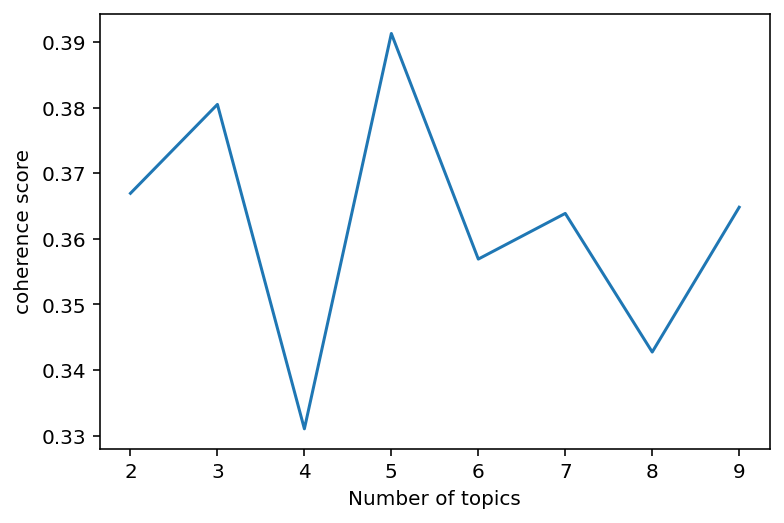

In [ ]:
#토픽수& 정합점수 그래프

coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=4, id2word = dictionary)

In [ ]:
#시각화(Intertopic distance map, 다차원 척도법)
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<토픽모델링의 해석>
 - coherence model 이용하여 최적의 토픽갯수 확인함
 - 그래프 왼쪽에서 토픽 확인 가능  
 - 각 토픽을 선택하면 해당 토픽과 가장 연관이 있는 30개의 단어 확인할 수 있으며, 해당 단어들이 전체 단어의 몇 퍼센트에 해당하는지도 확인 가능  
 - 토픽간의 거리가 멀수록 주제가 뚜렷하게 구별되며 가깝거나 겹쳐있다면 비슷한 주제를 나타냄  
 - 토픽 원의 크기가 클수록 높은 빈도수의 단어들로 구성되어 있음, 가장 큰 원이 메인토픽이라고 할 수 있음  
 - 오른쪽에서 람다값을 조정하여 단어의 출현조건을 설정할 수 있는데, λ를 1로 설정하면 토픽 별로 가장 자주 등장하는 단어들을 우선적으로 키워드로 선택함을 의미하며,
λ를 0에 가깝게 설정할수록 토픽 간에 차이가 많이 나는 단어를 선택함을 의미함
 - 오른쪽 그래프에서 파란막대그래프는 전체 단어에서의 빈도를, 빨간 막대그래프는 해당토픽에서의 빈도를 보여줌

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 4개  
 - 그래프 왼쪽에서 1부터 4까지의 토픽 확인 가능  
 - 4개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 세 부분으로 나뉨 [1], [2,4], [3]
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 구성단어로 유추하여 토픽 설정  
 - 상위 5 단어 확인
  - [1] : 있다, 좋다, 정보, 이용, 많다 
  - [2] : 좋다, 있다, 편하다, 이다, 공유
  - [4] : 편리하다, 편하다, 서울, 부분
  - [3] : 좋다, 사용, 있다, 최고, 편리하다
  
 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1] : 정보의 유용성 관련 만족 리뷰 (36.3%)
  - [2,4] : 서울지역에서의 편리성, 공유주차장 관련 만족 리뷰 (43.1%)
  - [3] : 서비스 사용 편의성 관련 만족 리뷰 (20.6%)

결론
- 만족 리뷰를 토픽모델링 한 결과 만족 원인을 크게 3가지로 나눌 수 있으며, 이는 **1)정보의 유용성**, **2)서울지역에서의 편리성**, **3)서비스 사용 편의성**에 관련한 것임을 확인할 수 있다.

##### ▶ TF-IDF 단어 빈도

In [ ]:
#전체 데이터 단어 순위
pos_data = pd.DataFrame(okt.pos(df['comment'].values.tolist()[0])).rename(columns = {0:'형태소',1:'품사'})
pos_data

,형태소,품사
0,최고,Noun
1,조앙,Noun


In [ ]:
#전체 데이터 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(df['comment'])):
    dfn = pd.DataFrame(okt.pos(df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})
print(df_Pos.shape)

#품사별 개수
pd.DataFrame(df_Pos['품사'].value_counts())

(7887, 2)


,품사
Noun,3539
Josa,1203
Verb,1148
Adjective,875
Punctuation,397
Suffix,147
Adverb,132
Modifier,129
Number,90
VerbPrefix,61


In [ ]:
# 5점(만족)의 리뷰와 2점이하의 리뷰 나눔(시리즈)
high_rate_review = df[df['ratings'] == 5]['comment']
low_rate_review = df[df['ratings'] <= 2]['comment']

# # 5점(만족)의 리뷰와 2점이하의 리뷰 나눔(데이터프레임)
high_rate_df = df[df['ratings'] == 5]
low_rate_df = df[df['ratings'] <= 2]

#리뷰 개수
print('5점 : ',len(high_rate_review),'개')
print('2점 이하 : ',len(low_rate_review),'개')

5점 :  223 개
2점 이하 :  107 개


In [ ]:
# 정규식으로 한글, 빈공간, 숫자가 아닌것은 ""로 대체 => 한글, 빈공간, 숫자만 남김
high_rate_review = high_rate_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
low_rate_review = low_rate_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))

low_tagger = Okt()
high_tagger = Okt()

def get_word_low_rating(sentence):
    nouns = low_tagger.nouns(sentence)
    return [noun for noun in nouns if len(noun) > 1]

def get_word_high_rating(sentence):
    nouns = high_tagger.nouns(sentence)
    return [noun for noun in nouns if len(noun) > 1]

# 점수 낮은 리뷰 최근 10개
high_rate_review[:10]

0                                                  최고조앙
2                                                     굿
9     잘 사용하고 있습니다 그런데 공유주창에 주차를 할 때 저공해 할인은 적용이 안 되는...
10                                             좋아요 편리하고
11    어플 자체는 편리하고 좋아요 그런데 빈자리에 가보면 항상 불법주차 차들이 가득합니다...
12                                                너무조아여
19          공유주차 시간수정이 안됩니다 얼마 전부터 갑자기 공유주차 시간 수정이 안됩니다
20                                                  좋아요
22                                                  좋아요
29                                           너무 좋은 앱입니다
Name: comment, dtype: object

In [ ]:
# TF-IDF
high_tfvector = TfidfVectorizer(tokenizer=get_word_high_rating,max_features=300)
high_tdf_tf = high_tfvector.fit_transform(high_rate_review)
high_tf_words = high_tfvector.get_feature_names()

count_mat = high_tdf_tf.sum(axis=0)
count = np.squeeze(np.asarray(count_mat))
high_rating_word_count_tf = list(zip(high_tf_words, count))
high_rating_word_count_tf = sorted(high_rating_word_count_tf, key=lambda t:t[1], reverse=True)

print("<TF-IDF>\n")
high_rating_word_count_tf[:15]

<TF-IDF>



[('주차장', 18.83886259436276),
 ('주차', 15.232315327380864),
 ('사용', 11.71324757641221),
 ('최고', 7.709957886798596),
 ('이용', 7.3233879082365965),
 ('어플', 7.102646188330695),
 ('정보', 6.5376098292479865),
 ('아주', 6.484476811950847),
 ('공유', 5.9513495222486235),
 ('서울', 4.998285628643054),
 ('모두', 4.525853874857883),
 ('정말', 4.4338921282248105),
 ('덕분', 4.114688698039619),
 ('매우', 4.055654304557698),
 ('검색', 3.6777115419642907)]

In [ ]:
high_df = pd.DataFrame(high_rating_word_count_tf, columns=['단어','TF-IDF 중요도'])
high_df.head(10)

,단어,TF-IDF 중요도
0,주차장,18.838863
1,주차,15.232315
2,사용,11.713248
3,최고,7.709958
4,이용,7.323388
5,어플,7.102646
6,정보,6.537610
7,아주,6.484477
8,공유,5.951350
9,서울,4.998286


In [ ]:
# 한글 깨짐 현상 개선
from matplotlib import rc
plt.rcParams['font.family'] = 'NanumGothic'
print(plt.rcParams['font.family'])

['NanumGothic']


Text(0.5, 1.0, '만족 리뷰 TF-IDF 중요도')

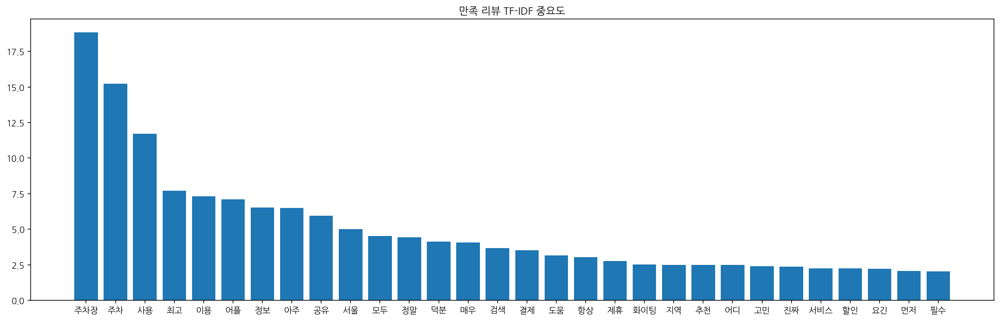

In [ ]:
# TF-IDF 중요도
plt.figure(figsize=(20,6))
plt.bar(high_df['단어'][:30],high_df['TF-IDF 중요도'][:30])
plt.title('만족 리뷰 TF-IDF 중요도')

##### ▶ 시각화

높은 빈도 수 단어

In [ ]:
high_rating_document = high_rate_review.values

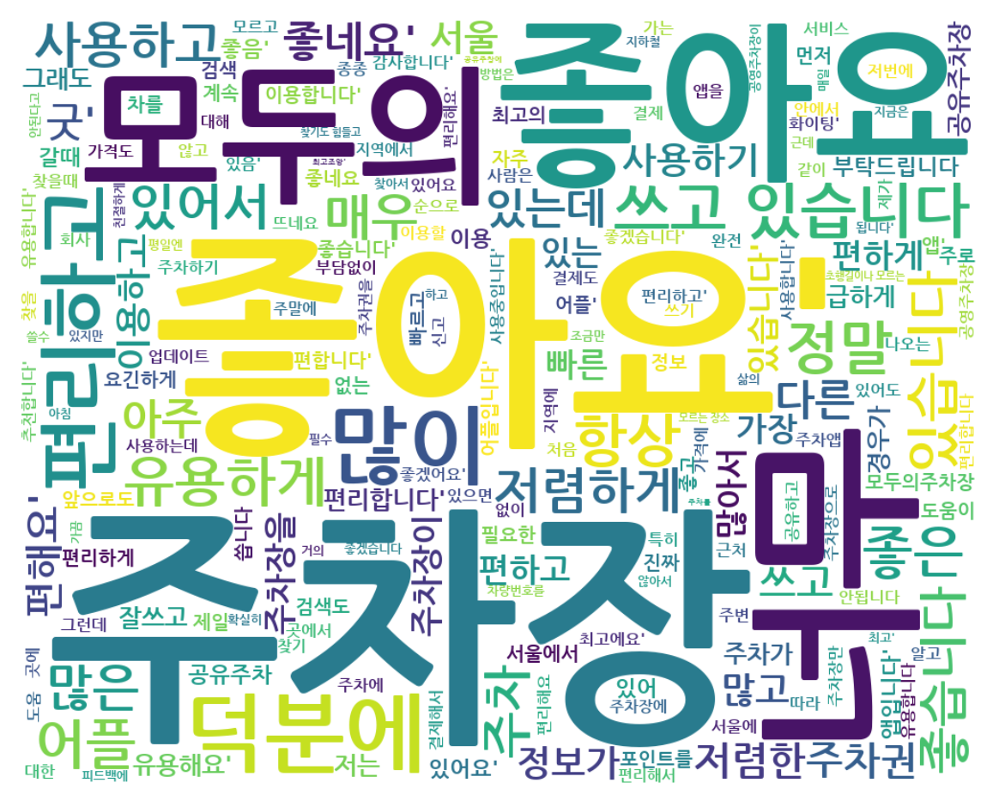

In [ ]:
font_path = '/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf'
wc = WordCloud(width = 1000, height = 800, background_color="white", font_path=font_path).generate(np.array2string(high_rating_document))
plt.figure(figsize=(6, 5), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

형용사 빈도

형용사 빈도수 (434, 2)
     형태소  빈도수
0    좋아요   47
1   있습니다   20
2    입니다   16
3   좋습니다   12
4     좋은   11
5   편리하고   11
6    좋네요   10
7   유용하게    8
8  편리합니다    7
9   저렴하게    7


<5점 리뷰 형용사 빈도 시각화>


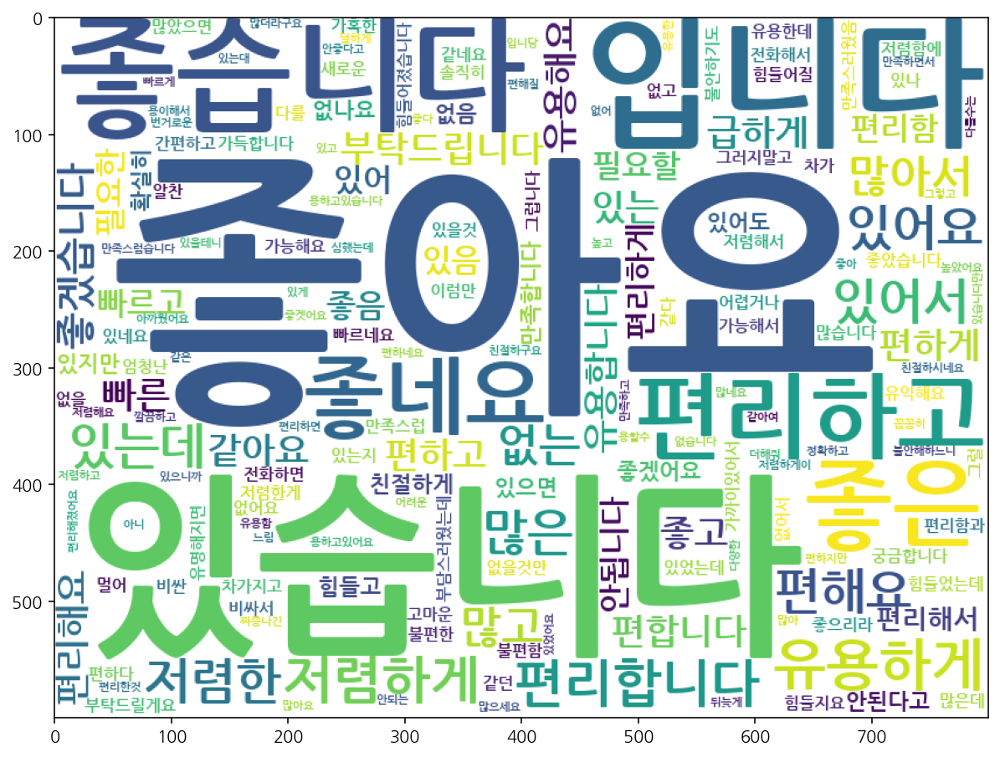

In [ ]:
# 5점 별점 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(high_rate_df['comment'])):
    dfn = pd.DataFrame(okt.pos(high_rate_df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})

# 형용사 빈도수
cond1 = (df_Pos['품사'] == 'Adjective')
df_N = df_Pos.loc[cond1]
print("형용사 빈도수", df_N.shape)
a=pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()
print(a)

# wordcloud 시각화 2 (형용사 단어)
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('\n\n<5점 리뷰 형용사 빈도 시각화>')
plt.show()

명사 빈도

명사 빈도수 (1161, 2)
   형태소  빈도수
0  주차장   79
1   주차   71
2   사용   30
3    앱   29
4    때   27
5   이용   24
6   공유   21
7   어플   20
8   모두   17
9   정보   16


<5점 리뷰 명사 빈도 시각화>


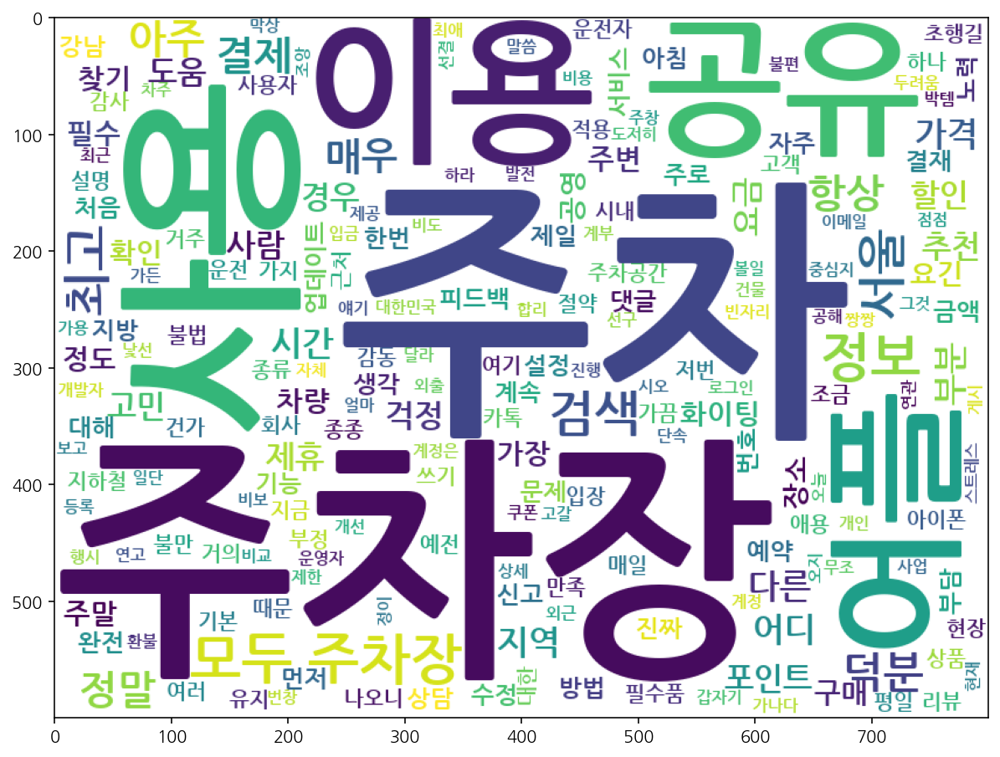

In [ ]:
# 5점 별점 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(high_rate_df['comment'])):
    dfn = pd.DataFrame(okt.pos(high_rate_df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})

# 형용사 빈도수
cond2 = (df_Pos['품사'] == 'Noun')
df_N = df_Pos.loc[cond2]
print("명사 빈도수", df_N.shape)
a=pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()
print(a)

# wordcloud 시각화 2 (명사) 단어)
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('\n\n<5점 리뷰 명사 빈도 시각화>')
plt.show()

##### ▶ 유사도로 만족 리뷰 확인

In [ ]:
df_high_list = high_rate_df['comment'].tolist()

In [ ]:
nn = NearestNeighbors(n_neighbors=10, algorithm='kd_tree')
nn.fit(high_tdf_tf)

text = '공유주차장'
test1 = high_tfvector.transform([text])

pd.options.display.max_colwidth = 150

# result
print("Test 문장 : " ,text)
print("------------------------------------")
for idx, row in enumerate(nn.kneighbors(test1.todense())[1][0]):
    print("{0}번째로 가장 유사한 문장 : \n {1}".format(idx+1, df_high_list[row]))
    print('\n')


Test 문장 :  공유주차장
------------------------------------
1번째로 가장 유사한 문장 : 
 잘 쓰고 있습니다. 저렴한 공유주차장 찾을 수 있으니까 편하네요.


2번째로 가장 유사한 문장 : 
 가끔 공유주차장 불벚주차가 짜증나긴 하는데 제휴주차장은 만족하고 쓰고 있음


3번째로 가장 유사한 문장 : 
 주차장 공유 좋습니다. 주차하기 어려울때 잘 애용하고있습니다.


4번째로 가장 유사한 문장 : 
 급하게 주차장 필요할때 유용해요~!!


5번째로 가장 유사한 문장 : 
 삶의 질을 높이는 어플 공유주차장도 제휴주차장도 잘 쓰고 있습니다 ㅎㅎ 상담원분들도 매우 친절하시네요 


6번째로 가장 유사한 문장 : 
 주차 공유라는 신박템의 선구앱. 주차장 고민일 때 도움 많이 받았습니다.


7번째로 가장 유사한 문장 : 
 사용하지 않는 주차장이 공유되어 좋습니다. 기본으로 깔아놓는 어플


8번째로 가장 유사한 문장 : 
 좋아요 편해요


9번째로 가장 유사한 문장 : 
 굿


10번째로 가장 유사한 문장 : 
 굿입니다




#### 2) 불만족 리뷰 (평점 2점 이하)

In [ ]:
#2점이하리뷰
all_review = df[df['ratings'] <= 2]['comment']
all_review[:3]

1                                                                    이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연동안되어서 매번 이중결제하게 만들고 환불도 번거로운데 진짜 개빡치게하네
5               내가 결제한 자리에 다른 차가 주차돼있으면 직접 연락해서 빼달라고 하라고요? 장난합니까? 차에 전화번호 안적혀있으면? 전화안받으면 어쩔건데요? 부산 해리단길 빈자리 번호 확인하고 가보니깐 다른 차 이미 파킹돼있더라. 차라리 이 시스템 없는게 낫다.
6    절대쓰지마세요 구매했는데 사용이 안되서 현장에서 개인 결제하고 환불해달라고 요구했는데 앱에서 12000원 결제  현장에서 9000원 결제 이것도 어이없지만 앱에서 결제했는데 사용이 안된거면 앱에서 결제한 사항을 취소해 줘야되는데 내가 결제한 9000원만 취소 해...
Name: comment, dtype: object

##### ▶ 토픽모델링

In [ ]:
#전처리
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

1                                                                      이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연동안되어서 매번 이중결제하게 만들고 환불도 번거로운데 진짜 개빡치게하네
5                       내가 결제한 자리에 다른 차가 주차돼있으면 직접 연락해서 빼달라고 하라고요 장난합니까 차에 전화번호 안적혀있으면 전화안받으면 어쩔건데요 부산 해리단길 빈자리 번호 확인하고 가보니깐 다른 차 이미 파킹돼있더라 차라리 이 시스템 없는게 낫다
6      절대쓰지마세요 구매했는데 사용이 안되서 현장에서 개인 결제하고 환불해달라고 요구했는데 앱에서 12000원 결제  현장에서 9000원 결제 이것도 어이없지만 앱에서 결제했는데 사용이 안된거면 앱에서 결제한 사항을 취소해 줘야되는데 내가 결제한 9000원만 취소 해...
7                                                                                                                                       울산은 거주자우선주차구역 등록안되나요
13                                                                                                             결제가 안되네요 아이폰 12프로멕스 쓰고있는데 결제 버튼 누르면 어플이 죽어버려요
                                                                               ...                                                                          
379    최악중에 최악 사전결제까지 하고 주차 예약하고 이용후에 나가려니까 차단기가 안열림 고객센터에

In [ ]:
#to_list
all_review = all_review.to_list()
all_review[:10]

['이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연동안되어서 매번 이중결제하게 만들고 환불도 번거로운데 진짜 개빡치게하네',
 '내가 결제한 자리에 다른 차가 주차돼있으면 직접 연락해서 빼달라고 하라고요 장난합니까 차에 전화번호 안적혀있으면 전화안받으면 어쩔건데요 부산 해리단길 빈자리 번호 확인하고 가보니깐 다른 차 이미 파킹돼있더라 차라리 이 시스템 없는게 낫다',
 '절대쓰지마세요 구매했는데 사용이 안되서 현장에서 개인 결제하고 환불해달라고 요구했는데 앱에서 12000원 결제  현장에서 9000원 결제 이것도 어이없지만 앱에서 결제했는데 사용이 안된거면 앱에서 결제한 사항을 취소해 줘야되는데 내가 결제한 9000원만 취소 해준다고함',
 '울산은 거주자우선주차구역 등록안되나요',
 '결제가 안되네요 아이폰 12프로멕스 쓰고있는데 결제 버튼 누르면 어플이 죽어버려요',
 '막무가내 토요일 선정릉역 모타워 휴일 종일권 끊고 들어갔는데',
 '주차 관리하는 분 너무너무 불친절함 지역은 말하지 안해겠습니다만 ',
 '별하나도 아깝습니다 별하나도 아까워요',
 '아니 결재하고 들어갔더니 연동 안된다고 아니 이럴려고 이용했나 돈을 두번 결재하는 아주 불쾌한 일이 발생하네요네 아놔 그돈 낼거면 아여 더 가까운데 주차했지',
 '정당하게 결제했는데 딱지날라옴 정직하게 결제하고 시간 이용다 안하고 나갔는데 주차위반 딱지날라오네요다시는 사용안할듯 싶네요']

In [ ]:
#불용어처리
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱"  # 주차장, 주차, 어플, 앱 처럼 공통적으로 자주 나오는 단어는 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['왜',
  '매번',
  '연동',
  '안되다',
  '결제',
  '다음',
  '차',
  '연동',
  '안되다',
  '매번',
  '이중',
  '결제',
  '환불',
  '번거롭다',
  '진짜',
  '개',
  '빡치다'],
 ['내',
  '결제',
  '자리',
  '다른',
  '차갑다',
  '직접',
  '연락',
  '빼',
  '달라',
  '하라',
  '고요',
  '장난',
  '합',
  '차',
  '전화번호',
  '전화',
  '건데',
  '부산',
  '해리',
  '빈자리',
  '번호',
  '확인',
  '가보',
  '다른',
  '차',
  '파킹',
  '차라리',
  '시스템',
  '없다',
  '낫다'],
 ['절대',
  '구매',
  '사용',
  '안되다',
  '현장',
  '개인',
  '결제',
  '환불',
  '요구',
  '결제',
  '현장',
  '결제',
  '어이없다',
  '결제',
  '사용',
  '안되다',
  '결제',
  '사항',
  '취소',
  '내',
  '결제',
  '취소',
  '고함'],
 ['울산', '거주', '우선', '구역', '등록', '안되다'],
 ['결제', '안되다', '아이폰', '프로', '멕스', '결제', '버튼'],
 ['막무가내', '토요일', '선정릉역', '타워', '휴일', '종일'],
 ['관리', '분', '불친절하다', '지역', '말'],
 ['별하나', '아깝다', '별하나', '아깝다'],
 ['아니다',
  '결재',
  '연동',
  '안되다',
  '아니다',
  '이렇다',
  '이용',
  '돈',
  '번',
  '결재',
  '아주',
  '불쾌하다',
  '발생',
  '돈',
  '아',
  '가깝다'],
 ['정당하다', '결제', '옴', '정직하다', '결제', '시간', '이용', '안', '위반', '다시', '사용']]

In [ ]:
dictionary = corpora.Dictionary(texts)    # corpora는 corpus의 복수형. 말뭉치가 여러개 있는 것으로 생각하면 됨
# 문서 데이터를 Dictionary 클래스 생성시 전달하면 사전을 만들 수 있음
print(dictionary.token2id)
# 사전에서 생성된 각각의 토큰들의 id 들이 생성되는데, 이를 확인한 것

{'개': 0, '결제': 1, '다음': 2, '매번': 3, '번거롭다': 4, '빡치다': 5, '안되다': 6, '연동': 7, '왜': 8, '이중': 9, '진짜': 10, '차': 11, '환불': 12, '가보': 13, '건데': 14, '고요': 15, '낫다': 16, '내': 17, '다른': 18, '달라': 19, '번호': 20, '부산': 21, '빈자리': 22, '빼': 23, '시스템': 24, '없다': 25, '연락': 26, '자리': 27, '장난': 28, '전화': 29, '전화번호': 30, '직접': 31, '차갑다': 32, '차라리': 33, '파킹': 34, '하라': 35, '합': 36, '해리': 37, '확인': 38, '개인': 39, '고함': 40, '구매': 41, '사용': 42, '사항': 43, '어이없다': 44, '요구': 45, '절대': 46, '취소': 47, '현장': 48, '거주': 49, '구역': 50, '등록': 51, '우선': 52, '울산': 53, '멕스': 54, '버튼': 55, '아이폰': 56, '프로': 57, '막무가내': 58, '선정릉역': 59, '종일': 60, '타워': 61, '토요일': 62, '휴일': 63, '관리': 64, '말': 65, '분': 66, '불친절하다': 67, '지역': 68, '별하나': 69, '아깝다': 70, '가깝다': 71, '결재': 72, '돈': 73, '발생': 74, '번': 75, '불쾌하다': 76, '아': 77, '아니다': 78, '아주': 79, '이렇다': 80, '이용': 81, '다시': 82, '시간': 83, '안': 84, '옴': 85, '위반': 86, '정당하다': 87, '정직하다': 88, '업데이트': 89, '하루': 90, '공영': 91, '공유': 92, '그냥': 93, '나기': 94, '난리': 95, '낭비': 96, '당장': 97, '덕분': 98

In [ ]:
# dictionary클래스에 doc2bow메소드를 이용해서 문서데이터를 수치화할수도 있음
# bow는 bags of words의 약자로, 여기서는 문서를 단어의 id와 빈도수로 수치화 하는 것을 뜻한다고 생각하면 됨
# 출력된 결과 값은 튜플들의 리스트임 (단어의 id, 해당 단어의 빈도수)

corpus = [dictionary.doc2bow(text) for text in texts] # texts에 있는 단어들을 하나씩 가져와서 id와 빈도수로 수치화 하고 리스트로 만들어서 corpus 라는 변수에 저장
corpus[:5]

[[(0, 1),
  (1, 2),
  (2, 1),
  (3, 2),
  (4, 1),
  (5, 1),
  (6, 2),
  (7, 2),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1)],
 [(1, 1),
  (11, 2),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 2),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1)],
 [(1, 6),
  (6, 2),
  (12, 1),
  (17, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 2),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 2),
  (48, 2)],
 [(6, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1)],
 [(1, 2), (6, 1), (54, 1), (55, 1), (56, 1), (57, 1)]]

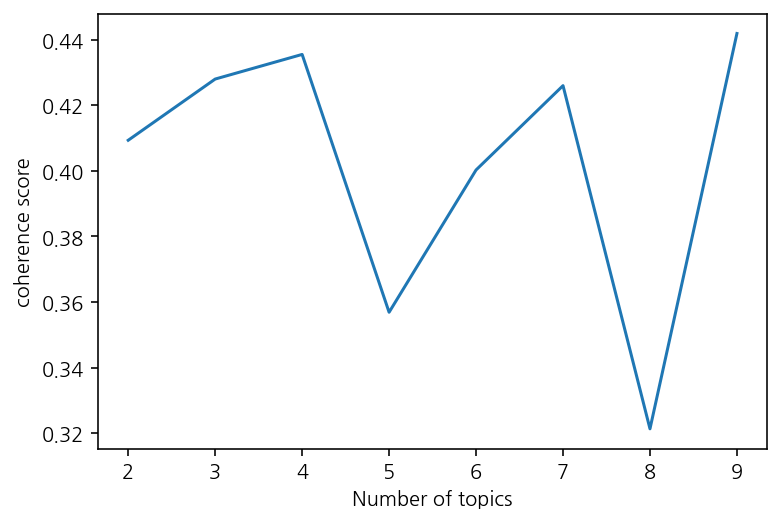

In [ ]:
#토픽수& 정합점수 그래프

coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=8, id2word = dictionary)

In [ ]:
#시각화(Intertopic distance map, 다차원 척도법)
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<토픽모델링의 해석>
 - coherence model 이용하여 최적의 토픽갯수 확인함
 - 그래프 왼쪽에서 토픽 확인 가능  
 - 각 토픽을 선택하면 해당 토픽과 가장 연관이 있는 30개의 단어 확인할 수 있으며, 해당 단어들이 전체 단어의 몇 퍼센트에 해당하는지도 확인 가능  
 - 토픽간의 거리가 멀수록 주제가 뚜렷하게 구별되며 가깝거나 겹쳐있다면 비슷한 주제를 나타냄  
 - 토픽 원의 크기가 클수록 높은 빈도수의 단어들로 구성되어 있음, 가장 큰 원이 메인토픽이라고 할 수 있음  
 - 오른쪽에서 람다값을 조정하여 단어의 출현조건을 설정할 수 있는데, λ를 1로 설정하면 토픽 별로 가장 자주 등장하는 단어들을 우선적으로 키워드로 선택함을 의미하며,
λ를 0에 가깝게 설정할수록 토픽 간에 차이가 많이 나는 단어를 선택함을 의미함
 - 오른쪽 그래프에서 파란막대그래프는 전체 단어에서의 빈도를, 빨간 막대그래프는 해당토픽에서의 빈도를 보여줌

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 8개  
 - 그래프 왼쪽에서 1부터 8까지의 토픽 확인 가능  
 - 8개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 네 부분으로 나뉨 [1,2,4,5,8] ,[3], [6], [7]
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 구성단어로 유추하여 토픽 설정  
 - 상위 5개 단어 확인
  - [1] : 결제, 환불, 차, 있다, 시간 
  - [2] : 결제, 이용, 안되다, 모두, 자리
  - [4] : 결제, 결재, 안되다, 이용, 안
  - [5] : 안되다, 환불, 비, 왜, 업데이터
  - [8] : 결제, 정보, 센터, 고객, 다시
  - [3] : 없다, 불법, 단속, 공유, 등록
  - [6] : 없다, 업데이트, 사용, 왜
  - [7] : 안되다, 고객, 센터, 화면, 실행

 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,2,4,5,8] : 결제 또는 환불 관련 불만족 리뷰(67.4%)
  - [3] : 공유주차장의 불법 주차로 인한 불만족 리뷰(15.4%)
  - [6] : 어플 업데이트 및 사용 관련 불만족 리뷰(9.1%)
  - [7] : 고객 센터 관련 불만족 리뷰(8.1%)

결론
- 불만족 리뷰를 토픽모델링 한 결과 불만족 원인을 크게 4가지로 나눌 수 있으며, 이는 **결제 및 환불**, **공유주차장의 불법주차**, **어플 사용**, **고객센터 이용**에 관련한 것임을 확인할 수 있다.

##### ▶ TF-IDF 단어 빈도

In [ ]:
# 점수 낮은 리뷰 최근 10개
low_rate_review[:10]

1                                                                     이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연동안되어서 매번 이중결제하게 만들고 환불도 번거로운데 진짜 개빡치게하네
5                      내가 결제한 자리에 다른 차가 주차돼있으면 직접 연락해서 빼달라고 하라고요 장난합니까 차에 전화번호 안적혀있으면 전화안받으면 어쩔건데요 부산 해리단길 빈자리 번호 확인하고 가보니깐 다른 차 이미 파킹돼있더라 차라리 이 시스템 없는게 낫다
6     절대쓰지마세요 구매했는데 사용이 안되서 현장에서 개인 결제하고 환불해달라고 요구했는데 앱에서 12000원 결제  현장에서 9000원 결제 이것도 어이없지만 앱에서 결제했는데 사용이 안된거면 앱에서 결제한 사항을 취소해 줘야되는데 내가 결제한 9000원만 취소 해...
7                                                                                                                                      울산은 거주자우선주차구역 등록안되나요
13                                                                                                            결제가 안되네요 아이폰 12프로멕스 쓰고있는데 결제 버튼 누르면 어플이 죽어버려요
14                                                                                                                        막무가내 토요일 선정릉역 모타워 휴일 종일권 끊고 들어갔는데
15                                                              

In [ ]:
# TF-IDF 단어 빈도
low_tfvector = TfidfVectorizer(tokenizer=get_word_low_rating,max_features=300)
low_tdf_tf = low_tfvector.fit_transform(low_rate_review)
low_tf_words = low_tfvector.get_feature_names()

count_mat = low_tdf_tf.sum(axis=0)
count = np.squeeze(np.asarray(count_mat))
low_rating_word_count_tf = list(zip(low_tf_words, count))
low_rating_word_count_tf = sorted(low_rating_word_count_tf, key=lambda t:t[1], reverse=True)

print("<TF-IDF>\n")
low_rating_word_count_tf[:15]

<TF-IDF>



[('결제', 8.466713881132968),
 ('주차', 7.742075989955267),
 ('주차장', 7.452921448036836),
 ('어플', 6.255843281343755),
 ('정보', 4.8440814062763415),
 ('업데이트', 4.573081477784664),
 ('이용', 3.8013796657815737),
 ('사용', 3.7825788241072384),
 ('고객', 3.6093820298685375),
 ('센터', 3.445930133770281),
 ('환불', 3.25195412510941),
 ('실행', 3.1373934329072934),
 ('시간', 2.6378074048192377),
 ('전화', 2.610876636102648),
 ('확인', 2.3253021639994556)]

In [ ]:
low_df = pd.DataFrame(low_rating_word_count_tf, columns=['단어','TF-IDF 중요도'])
low_df.head(10)

,단어,TF-IDF 중요도
0,결제,8.466714
1,주차,7.742076
2,주차장,7.452921
3,어플,6.255843
4,정보,4.844081
5,업데이트,4.573081
6,이용,3.801380
7,사용,3.782579
8,고객,3.609382
9,센터,3.445930


Text(0.5, 1.0, '불만족 리뷰 TF-IDF 중요도')

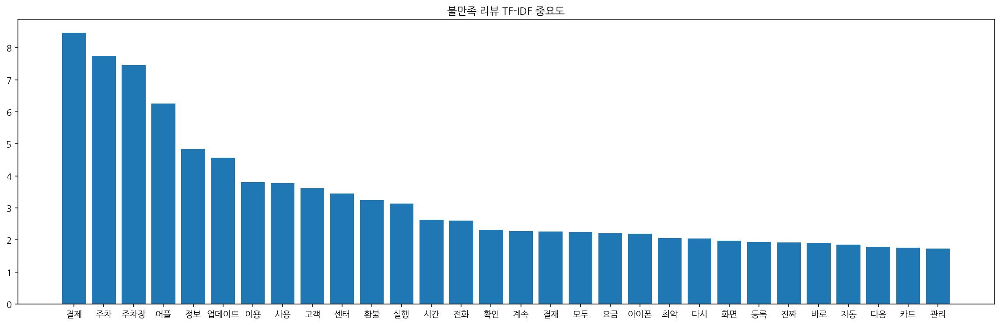

In [ ]:
# TF-IDF 중요도
plt.figure(figsize=(20,6))
plt.bar(low_df['단어'][:30],low_df['TF-IDF 중요도'][:30])
plt.title('불만족 리뷰 TF-IDF 중요도')

##### ▶ 시각화

높은 빈도수 단어

In [ ]:
low_rating_document = low_rate_review.values

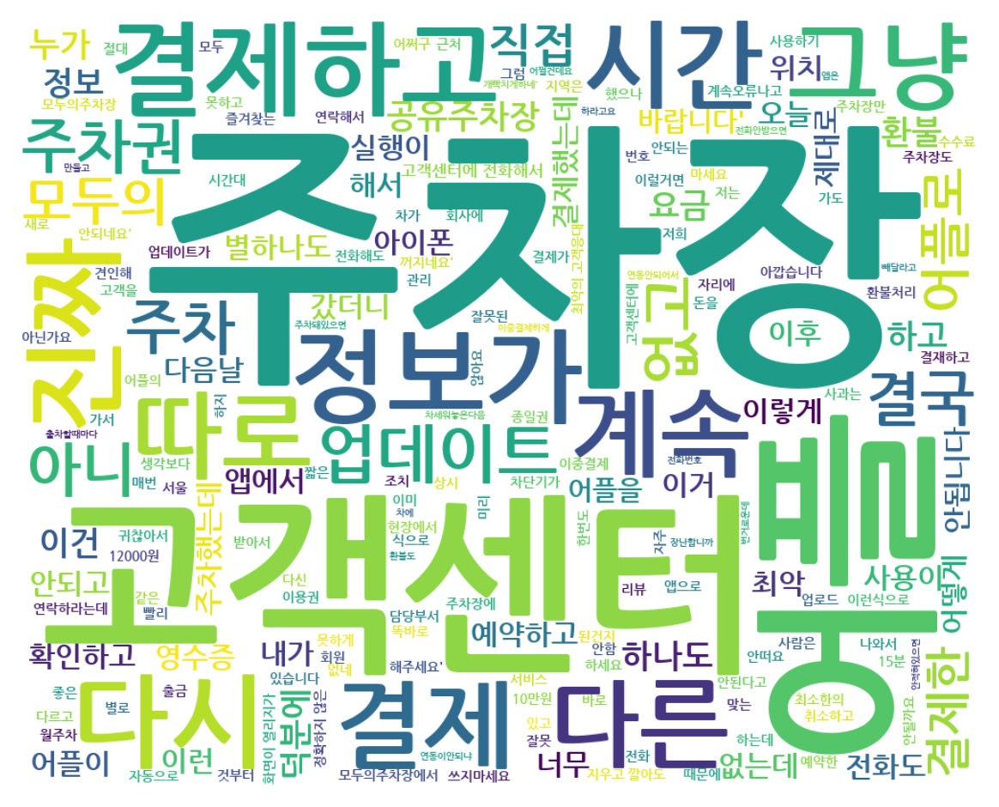

In [ ]:
font_path = '/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf'
wc = WordCloud(width = 1000, height = 800, background_color="white", font_path=font_path).generate(np.array2string(low_rating_document))
plt.figure(figsize=(6, 5), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

형용사 빈도

형용사 빈도수 (245, 2)
    형태소  빈도수
0    없고    7
1    안됨    6
2    아니    6
3    없음    5
4  안됩니다    4
5    같은    4
6  있습니다    3
7  전화해서    3
8   안되고    3
9   없는데    3


<2점 이하 리뷰 형용사 빈도 시각화>


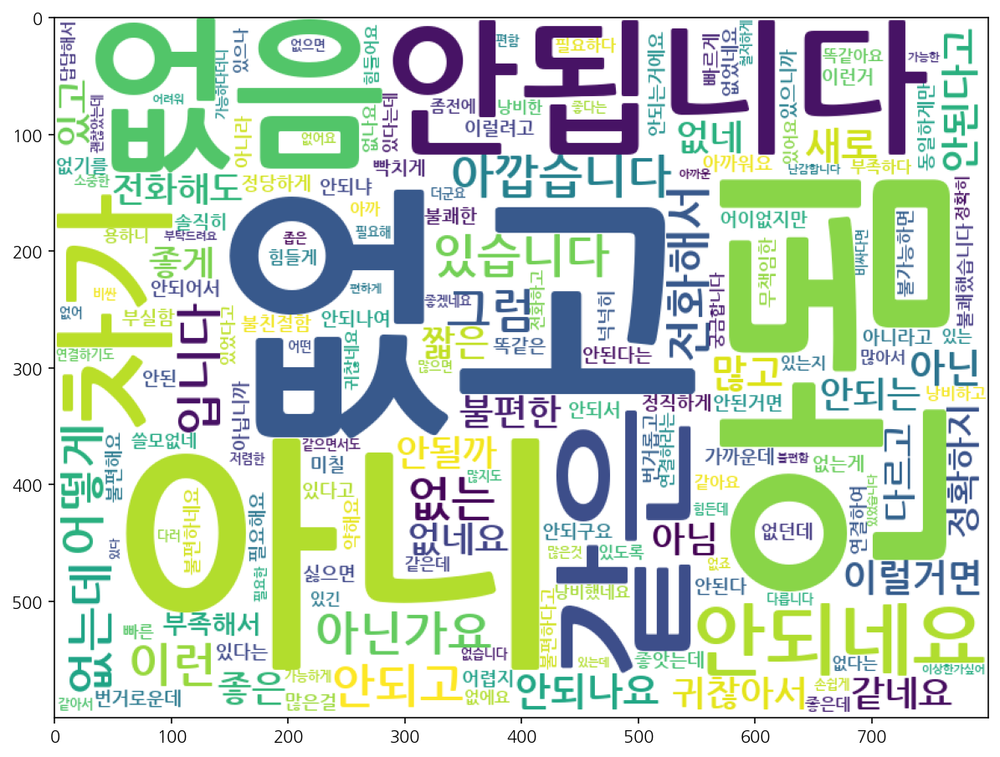

In [ ]:
# 2점 이하 별점 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(low_rate_df['comment'])):
    dfn = pd.DataFrame(okt.pos(low_rate_df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})

# 형용사 빈도수
cond1 = (df_Pos['품사'] == 'Adjective')
df_N = df_Pos.loc[cond1]
print("형용사 빈도수", df_N.shape)
a=pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()
print(a)

# wordcloud 시각화 2 (형용사 단어)
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('\n\n<2점 이하 리뷰 형용사 빈도 시각화>')
plt.show()

명사 빈도

명사 빈도수 (1757, 2)
   형태소  빈도수
0  주차장   57
1   주차   53
2   결제   53
3   어플   37
4    앱   24
5   환불   22
6   고객   20
7   사용   19
8   정보   18
9   이용   18


<2점 이하 리뷰 명사 빈도 시각화>


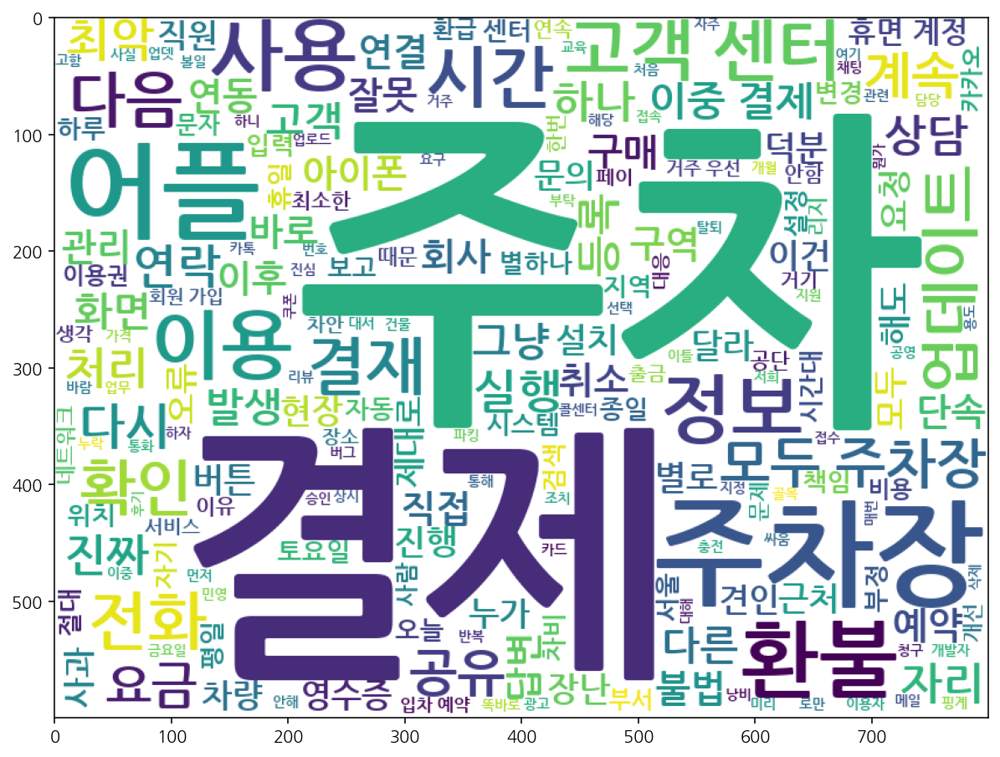

In [ ]:
# 2점 이하 별점 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(low_rate_df['comment'])):
    dfn = pd.DataFrame(okt.pos(low_rate_df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})

# 형용사 빈도수
cond2 = (df_Pos['품사'] == 'Noun')
df_N = df_Pos.loc[cond2]
print("명사 빈도수", df_N.shape)
a=pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()
print(a)

# wordcloud 시각화 2 (명사) 단어)
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('\n\n<2점 이하 리뷰 명사 빈도 시각화>')
plt.show()

##### ▶ 유사도로 불만족 리뷰 확인

In [ ]:
df_low_list = low_rate_df['comment'].tolist()

In [ ]:
nn = NearestNeighbors(n_neighbors=10, algorithm='kd_tree')
nn.fit(low_tdf_tf)

text = '고객센터'
test1 = low_tfvector.transform([text])

pd.options.display.max_colwidth = 150

# result
print("Test 문장 : " ,text)
print("------------------------------------")
for idx, row in enumerate(nn.kneighbors(test1.todense())[1][0]):
    print("{0}번째로 가장 유사한 문장 : \n {1}".format(idx+1, df_low_list[row]))
    print('\n')


Test 문장 :  고객센터
------------------------------------
1번째로 가장 유사한 문장 : 
 휴면계정 은 고객센터 연락하라는데 고객센터 링크는 어디..


2번째로 가장 유사한 문장 : 
 고객센터 불친절 실망 강남 신논현 갈때 자주 이용합니다


3번째로 가장 유사한 문장 : 
 고객센터 있긴합니까? 전화 한번도 걸린적없네요 그냥 팔면 땡이죠?


4번째로 가장 유사한 문장 : 
 휴면 계정이라서 고객센터에 연락하라고 하네..ㅋㅋ ㅇㅇ 안써~


5번째로 가장 유사한 문장 : 
 다운로드안됌


6번째로 가장 유사한 문장 : 
 휴면계정이라고 고객센터에 연락하라는데 어케하는거죠 새로 회원가입해도 안되네요


7번째로 가장 유사한 문장 : 
 그동안 주차장 앱이라곤 모두의 주차장만 썼는데 3분의 1정도의 수준으로 결제를 하고 가도 차단기가 열리지 않는 상황이 발생함 그 때 전화도 안 받아서 이중결제하고 환불처리 요구하는데 2틀 걸림 영수증 사진찍어보내라 어플에선 환불 못해준다고 함 답답해서 고객센터에 전화해서 물어보니 사과는 커녕 자기네는 잘못이 없다는 식으로 누가 잘못을 했는지 알려달라고 하는 것 같은데 자기네가 알아보고 알려준다 함 그래서 "사과는 안하시나요?" 이랬더니 사과 안함 저희 측은 뭐 어쩌구 저꺼구 이중환불 되는 것부터 또 그 자리에서 고객센터에 전화해서 안 받은 것부터 모두의 주차장에 잘못 아닌가요? 누가 이런식으로 상담하나요? 상담직원 분이 상담말고도 여러가지 분야의 업무를 하시나본데 상담을 제대로 하시던지 아님 상담직원을 제대로 뽑으시던지 하세요 고객센터랑 연결하기도 힘든데 오히려 더 화나서 다신 이 어플 안 쓰겠습니다 이 밑에 보시면 다 이중결제로 화나신 분들인데 일 좀 철저하게 하세요


8번째로 가장 유사한 문장 : 
 최악의 고객응대 서비스 지금까지 겪은 그 어떤 서비스 중에서 단연코 선두로 꼽을 만큼 최악의 고객응대 마인드를 가진 회사입니다


9번째로 가장 유사한 문장 : 
 폰교체로 새로 어플

In [ ]:
nn = NearestNeighbors(n_neighbors=10, algorithm='kd_tree')
nn.fit(low_tdf_tf)

text = '불법주차'
test1 = low_tfvector.transform([text])

pd.options.display.max_colwidth = 150

# result
print("Test 문장 : " ,text)
print("------------------------------------")
for idx, row in enumerate(nn.kneighbors(test1.todense())[1][0]):
    print("{0}번째로 가장 유사한 문장 : \n {1}".format(idx+1, df_low_list[row]))
    print('\n')


Test 문장 :  불법주차
------------------------------------
1번째로 가장 유사한 문장 : 
 다운로드안됌


2번째로 가장 유사한 문장 : 
 불법주차 단속을 하지 않아서 결제해도 주차할 곳이 없고 단속하는데 시간 걸리니 취소하라고 하고... 최소한의 관리는 해주었으면 좋겠네요


3번째로 가장 유사한 문장 : 
 어플깔고 처음 이용함. 힘들게 위치 찾아갔는데 다른 인간이 불법주차함. 이런 경우 신고 기능 없나요? 정작 돈내고 이용하려는 사람은 이용도 못하고 시간만 낭비했네요.


4번째로 가장 유사한 문장 : 
 주차권 관리 미흡 정기주차권  연장도  자동 으로 된적 이  없고


5번째로 가장 유사한 문장 : 
 주차정보가 약해요 다른앱으로 넘더가야하나?


6번째로 가장 유사한 문장 : 
 모두의 주차장좋다는 소문을하도들어서 오늘 인사동갈일이있어서 모두의주차장 어플켜고갔는데 거주자우선 공유주차장 앱상에는 계속 결재가능하게떠있어서 갔더니 주차할공간은하나도없고 도착 5분전부터 결재앱은 계속떠있어서 결재먼저하고 지정구역나면 불법주정차차량빼달라고하려고하니 페이코앱은 계속오류나고 제폰이 이상한가싶어 신랑폰으로 해도 페이코 오류계속뜨고 모두의앱도 멈춤.일시정지현상 나타나고 기분좋게밥먹으로가서 주차하려다가 3살아이는차안에서울고불고 페이코결재연동은 계속오류나고 오가는차들은 클락션울리고 신랑은 신경질내고 거기서만 30분을 버렸네요ㅜㅜㅜㅜㅜ 결국 근처로 두바퀴더돌다가 어플다시 정상작동되서 어플될때 재빨리 근처아무곳이나 가능한곳으로 간신히 결재하고들어갔네요. 주차하고보니 주차하는데만 1시간버리고오고ㅜㅜ싸움하고ㅜㅜ흡 ..ㅜㅜ 서버.결재연동앱불안정.불법주정차차량단속 개선부탁드려요ㅜㅜ


7번째로 가장 유사한 문장 : 
 배봉산숲 도서관 공유주차장 배봉산 숲도서관 공유주차장에 덤프트럭 포크레인 화물차있습니다 이거 불법 아닌가요 단속좀 해주셔요


8번째로 가장 유사한 문장 : 
 월 주차는 지도에 안 나타나네요


9번째로 가장 유사한 문장 :

#### 3) 21년 불만족 리뷰 증가에 대한 해석

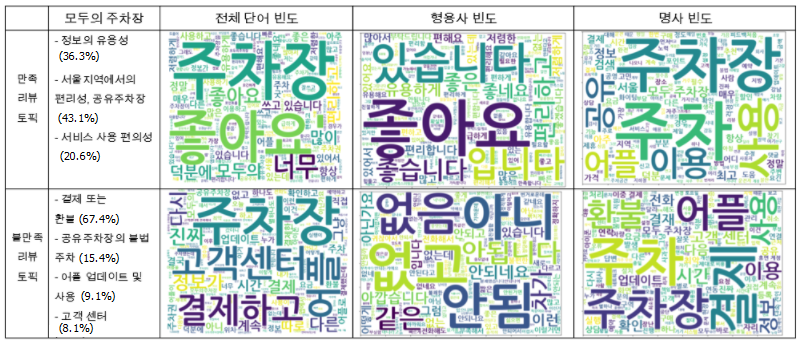

- 20-21년 불만족 리뷰 토픽의 결과 결제 및 환불에 관한 내용이 가장 많았다.

In [ ]:
# 2020년 1월 ~ 2021년 6월 리뷰
print('20-21년 만족 리뷰 개수 : ',len(high_rate_review),'개')
print('20-21년 불만족 리뷰 개수 : ',len(low_rate_review),'개')

20-21년 만족 리뷰 개수 :  223 개
20-21년 불만족 리뷰 개수 :  107 개


- '결제'와 '환불'을 포함하는 리뷰를 검색해보자

In [ ]:
[x for x in low_rate_df['comment'] if '결제' in x]

['이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연동안되어서 매번 이중결제하게 만들고 환불도 번거로운데 진짜 개빡치게하네',
 '내가 결제한 자리에 다른 차가 주차돼있으면 직접 연락해서 빼달라고 하라고요? 장난합니까? 차에 전화번호 안적혀있으면? 전화안받으면 어쩔건데요? 부산 해리단길 빈자리 번호 확인하고 가보니깐 다른 차 이미 파킹돼있더라. 차라리 이 시스템 없는게 낫다.',
 '절대쓰지마세요 구매했는데 사용이 안되서 현장에서 개인 결제하고 환불해달라고 요구했는데 앱에서 12000원 결제  현장에서 9000원 결제 이것도 어이없지만 앱에서 결제했는데 사용이 안된거면 앱에서 결제한 사항을 취소해 줘야되는데 내가 결제한 9000원만 취소 해준다고함',
 '결제가 안되네요 아이폰 12프로ㅜ멕스 쓰고있는데 결제 버튼 누르면 어플이 죽어버려요',
 '정당하게 결제했는데 딱지날라옴 정직하게 결제하고 시간 이용다 안하고 나갔는데 주차위반 딱지날라오네요ㅋㅋㅋㅋ다시는 사용안할듯 싶네요ㅋㅋ',
 '싸움나기 싫으면 공유주차장 쓰지마세요 두시간 결제하고 주차하고 나와서 볼일보고 있으니까 전화와서 거주자가 자기 월 상시 주차권 있다고 당장 차빼라고 난리났네요 덕분에 오늘 볼일 못보고 돌아갑니다 이런 시간낭비가 어딨나요 그냥 공영 민영 위치 찾고 결제하는 용도로만 쓰시길',
 '아니진림 장난하나 주차결제하고30분안에 드가면 된대서 바로들어갓더니 바로들어가면 안된다고 주차장 아저씨가 할인권 접수안된대서 다시나갓음 그럼 미리 입력을 해놔야댈거아니야 진심 화가 ㅈ8ㄴ 나서 미칠지경진심 아 장난치냐?',
 '카드결제 왜 안눌러지나요 별 한개도 아깝습니다',
 '최악. 거주자구역 결제하고 자리에 갔더니 엄한 차량이 이미 주차중. 해서 결제 취소하고 다른자리 결제후 갔더니 마찬가지로 자리없음. 아니 결제 취소하고 그럼 뭐해요 주차하려고 이 어플 이용하는거 아닙니까? 가는곳마다 주차가 불가능하면 이 어플이 뭣하러 필요해요?',
 '쿠폰을 받았는데 쿠폰결제란도 

In [ ]:
[x for x in low_rate_df['comment'] if '환불' in x]

['이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연동안되어서 매번 이중결제하게 만들고 환불도 번거로운데 진짜 개빡치게하네',
 '절대쓰지마세요 구매했는데 사용이 안되서 현장에서 개인 결제하고 환불해달라고 요구했는데 앱에서 12000원 결제  현장에서 9000원 결제 이것도 어이없지만 앱에서 결제했는데 사용이 안된거면 앱에서 결제한 사항을 취소해 줘야되는데 내가 결제한 9000원만 취소 해준다고함',
 '금요일 주차 후 토요일까지 주차하려면 입차전에 금요일꺼(평일입차권) 예약하고 24시되면 출차한다음에 다시 토요일꺼(휴일입차권) 예약한 후 입차해야되네요. 두개는 한꺼번에 예약이 안되구요 따로 구매하고 입출차를 반복해서 한개씩 예약해야되는데 이 사실을 모르면 그냥 주차비 왕창나옵니다. 전 별개로 두개를 구매했으나.. 적용은 두개가 되었는데 따로 또 주차장입구에서 계산하고 .. 예약한 것들과 따로 주차비낸건 환불조차 안된다 하고 이건 뭐 정보 를 꼬아서 적어놨으니 소비자를 기만하고 돈 먹기 식으로 밖에 안보이네요 이럴거면 공영주차장에 하는게 낫지 왜 여기서 구매햇을까 싶습니다.',
 '진짜 너무 최악입니다. 귀찮아서 절대 이런거 안남기는데 여기는 남겨야겠네요. 주차권 구매 후 주차장 들어갔다가 다른 주차장 이용하려고 15분 후 환불처리 요청했는데 미승인 났습니다. 15분에 12000원 와 양아치가 따로 없네요. 15분 값을 내겠다니 그건 또 안된다는 모두의주차장^^모두의주차장이 아니라 양**주차장인거같네요. 다신 안씁니다.',
 '이용권 구매해서 사용했음. 지역은 촌동네 주차장도 아닌 서울 홍대인근 무인주차장. 시간 맞춰서 들어갔는데도, 이용권이 인식이 안됨. 결국 환불을  주차장 회사에 연락해서, 이용자가 영수증 따로 발급 받아서, 또 회사에 청구해야함. 영수증은 문자 메시지로 받는데 어렵지 않았음. 다만 그 이후 환불 과정이 번거롭고 지난함. 어플의 좋은 점은 하나임. 주차장 비용을 알기 쉽다는 것. 그 외에는 사실상 이용자의

주요 토픽의 주요 리뷰 :
- 주차장에 대한 잘못된 정보와 오류 등으로 불편을 겪음
- 공유주차장의 불법주차로 인해 시간허비 및 금전적 피해
- 번거롭고 정확하지 않은 환불 절차

그 외 :

In [ ]:
[x for x in low_rate_df['comment'] if '공유' in x]

['싸움나기 싫으면 공유주차장 쓰지마세요 두시간 결제하고 주차하고 나와서 볼일보고 있으니까 전화와서 거주자가 자기 월 상시 주차권 있다고 당장 차빼라고 난리났네요 덕분에 오늘 볼일 못보고 돌아갑니다 이런 시간낭비가 어딨나요 그냥 공영 민영 위치 찾고 결제하는 용도로만 쓰시길',
 '공유중에 다른 시간대 설정(공유)을 못하게 막아놔서 사용이 너무 불편해요 시간대 별로 원래 소유주도 사용하기 위해서 시간을 분활해서 설정해놨는데 무쓸모 왜이렇게 정책을 바꿨는지 모르겠어요 공유 시간대만 설정변경 못하게 하면 되지 다른 시간 다른요일은 왜막았는지',
 '결제했는데 차 견인됨 공유주차장으로 나온 거주자 우선 주차 구역에 똑바로 결제하고 주차했는데 구청에서 차 견인해 감 결제하고 1분 후인 시각에 견인해 간 걸로 확인했음 덕분에 출근 못하고 시간 낭비하고 견인료에 부정주차요금에 차 찾으러 가는 택시비까지 냈음 공단 측에서는 단속 당시 결제 정보가 업로드 안 되어 있었다고 하는데 ㅋ ㅋ 사람이 직접 하시는지 돈을 받았으면 관리를 제대로 하셔야죠 일요일이라고 문의센터는 전화 안받는 바람에 제가 직접 공단에 이의 신청서 접수하고 공단이랑 앱 측에서 합의 봐서 누가 물어낼 건지 가릴 때까지 기다려야 결제한 금액 돌려 받을 수 있다는데 낭비한 제 시간이랑 분노는 누가 보상해줍니까 관리 똑바로 하세요 “다시는 쓰고 싶지 않음” 그리고 별 하나도 아까움 리뷰 등록하려면 별 줘야 해서 주는데 ㅋㅋ 덕분에 하루 잘 망쳤습니다',
 '주차공유 올린지 꽤 됐는데 왜 아직도 검토중인건가요? 검토하는 정확히 몇달걸리는지 궁금합니다',
 '서울 연남동 이용후기 1. 공유주차장 두곳 방문하였으니 주차실패(없는자리, 타차량주차) 2. 근처 안심주차장 방문. 요금정보가 틀림(30분 1500원으로 나오나 실제론 2000원) 결론 : 맞는 정보가 없음',
 '모두의 주차장좋다는 소문을하도들어서 오늘 인사동갈일이있어서 모두의주차장 어플켜고갔는데 거주자우선 공유주차장 앱상에는 계속 결재가능하게떠있어서 갔더니 

In [ ]:
[x for x in low_rate_df['comment'] if '불법' in x]

['어플깔고 처음 이용함. 힘들게 위치 찾아갔는데 다른 인간이 불법주차함. 이런 경우 신고 기능 없나요? 정작 돈내고 이용하려는 사람은 이용도 못하고 시간만 낭비했네요.',
 '불법주차 단속을 하지 않아서 결제해도 주차할 곳이 없고 단속하는데 시간 걸리니 취소하라고 하고... 최소한의 관리는 해주었으면 좋겠네요',
 '모두의 주차장좋다는 소문을하도들어서 오늘 인사동갈일이있어서 모두의주차장 어플켜고갔는데 거주자우선 공유주차장 앱상에는 계속 결재가능하게떠있어서 갔더니 주차할공간은하나도없고 도착 5분전부터 결재앱은 계속떠있어서 결재먼저하고 지정구역나면 불법주정차차량빼달라고하려고하니 페이코앱은 계속오류나고 제폰이 이상한가싶어 신랑폰으로 해도 페이코 오류계속뜨고 모두의앱도 멈춤.일시정지현상 나타나고 기분좋게밥먹으로가서 주차하려다가 3살아이는차안에서울고불고 페이코결재연동은 계속오류나고 오가는차들은 클락션울리고 신랑은 신경질내고 거기서만 30분을 버렸네요ㅜㅜㅜㅜㅜ 결국 근처로 두바퀴더돌다가 어플다시 정상작동되서 어플될때 재빨리 근처아무곳이나 가능한곳으로 간신히 결재하고들어갔네요. 주차하고보니 주차하는데만 1시간버리고오고ㅜㅜ싸움하고ㅜㅜ흡 ..ㅜㅜ 서버.결재연동앱불안정.불법주정차차량단속 개선부탁드려요ㅜㅜ',
 '배봉산숲 도서관 공유주차장 배봉산 숲도서관 공유주차장에 덤프트럭 포크레인 화물차있습니다 이거 불법 아닌가요 단속좀 해주셔요']

In [ ]:
[x for x in low_rate_df['comment'] if '어플' in x]

['결제가 안되네요 아이폰 12프로ㅜ멕스 쓰고있는데 결제 버튼 누르면 어플이 죽어버려요',
 '이용권 구매해서 사용했음. 지역은 촌동네 주차장도 아닌 서울 홍대인근 무인주차장. 시간 맞춰서 들어갔는데도, 이용권이 인식이 안됨. 결국 환불을  주차장 회사에 연락해서, 이용자가 영수증 따로 발급 받아서, 또 회사에 청구해야함. 영수증은 문자 메시지로 받는데 어렵지 않았음. 다만 그 이후 환불 과정이 번거롭고 지난함. 어플의 좋은 점은 하나임. 주차장 비용을 알기 쉽다는 것. 그 외에는 사실상 이용자의 편의를 위한 콘텐츠는 많이 부실함. 귀찮아서 구매후기도 잘 안 남기는 편인데, 나처럼 피해보는 사람은 없기를 바람.',
 '최악. 거주자구역 결제하고 자리에 갔더니 엄한 차량이 이미 주차중. 해서 결제 취소하고 다른자리 결제후 갔더니 마찬가지로 자리없음. 아니 결제 취소하고 그럼 뭐해요 주차하려고 이 어플 이용하는거 아닙니까? 가는곳마다 주차가 불가능하면 이 어플이 뭣하러 필요해요?',
 '쿠폰을 받았는데 쿠폰결제란도 없고 문의를해도 컨트로c 컨트롤v 똑같은답만 주네요 해당 어플에는 결제란이 없던데..',
 '어플깔고 처음 이용함. 힘들게 위치 찾아갔는데 다른 인간이 불법주차함. 이런 경우 신고 기능 없나요? 정작 돈내고 이용하려는 사람은 이용도 못하고 시간만 낭비했네요.',
 '아이폰 11 지원 안되나요 갤8 일때 잘 사용했었는데 아이폰 11로 바꾸고 어플 깔았더니 아예 주차장 정보가 안뜨네요',
 '네트워크장애 때문에 마음졸이다가 경쟁사 어플로 넘어갑니다~~ 이런 좋은 아이템 선점하고도 ㅉㅉ',
 '폰교체로 새로 어플설치하니 하루전까지 사용하던 기존계정을 휴면계정으로 전환시켜버리네요. 고객센터 연락처도 없고 카톡문의는 응답도 없는 불편한 어플이네요.',
 '버그인것같아요 어플들어가도 주차장 정보가 하나도 안떠요 삭제후 다시 설치해도 어플에 주차장 정보 하나도 안떠요 확인해주세요',
 '네트워크 문제라고 어플 안 들어가져요. 지우고 깔아도 그대로',
 '고객을 호구

In [ ]:
[x for x in low_rate_df['comment'] if '고객센터' in x]

['고객센터 불친절 실망 강남 신논현 갈때 자주 이용합니다',
 '휴면계정이라고 고객센터에 연락하라는데 어케하는거죠 새로 회원가입해도 안되네요',
 '휴면 계정이라서 고객센터에 연락하라고 하네..ㅋㅋ ㅇㅇ 안써~',
 '월주차 이용권 이용중 모두의주차장에서 주차장 등록누락으로 현장 이중결제발생 이후 비용환급관련 안내통화 요청하였으나 모두 카카오톡으로 짧은 답변만 진행 이후 현장결제 비용환급일자를 영업일 기준5일 넉넉히 7일이라고 하였지만 7일째도 처리안됨 고객센터 연결시 담당부서 이관하였다고만 답변 다음날에도 또 동일하게만 답변하고 금일처리하겠다고 했으나 처리도 안되고 연락도없음 그 다음날 콜센터로 재연결하여 해당부서 담당자 직접 통화할테니 연결요청하였으나 거부당하고 5분내로 다시 연락주기로하였으나 연락도 없고 1시간30분 지난 후 환급처리 완료하였다고 짧은 문자보냄 이렇게 고객을 기다리고 이핑계 저핑계되는 업체도 처음이며 어찌됬든 모두의 주차장에서 잘못한부분이면 고객에게 사과를 먼저하셔야지 담당부서 이관했다고 책임회피하는 콜센터 직원의 무책임한 모습도 어이가 없었네요 최소한의 직원 CS교육과 업무처리에 대하여도 교육이 절실해보입니다. 많은걸 바라지도 않아요 최소한 고객과 약속은 지키세요',
 '고객센터 있긴합니까? 전화 한번도 걸린적없네요 그냥 팔면 땡이죠?',
 '폰교체로 새로 어플설치하니 하루전까지 사용하던 기존계정을 휴면계정으로 전환시켜버리네요. 고객센터 연락처도 없고 카톡문의는 응답도 없는 불편한 어플이네요.',
 '휴면계정 은 고객센터 연락하라는데 고객센터 링크는 어디..',
 '그동안 주차장 앱이라곤 모두의 주차장만 썼는데 3분의 1정도의 수준으로 결제를 하고 가도 차단기가 열리지 않는 상황이 발생함 그 때 전화도 안 받아서 이중결제하고 환불처리 요구하는데 2틀 걸림 영수증 사진찍어보내라 어플에선 환불 못해준다고 함 답답해서 고객센터에 전화해서 물어보니 사과는 커녕 자기네는 잘못이 없다는 식으로 누가 잘못을 했는지 알려달라고 하는 것 같은데 자기네

나머지 토픽의 주요 의견
- 어플 상 오류
- 주차권 오류, 정보 오류
- 쿠폰 오류
- 고객센터 불편함에 대한 불만

결론
- 어플 이용자 수, 주차장 등록 수가 늘어남에 따라 이용자들의 불편과 피해가 증가하고 있다. 특히 금전적, 시간적 피해를 입은 고객들의 앱 이탈률은 클 것이라고 생각된다. 불법주차와 같은 고질적인 문제와 잘못된 정보, 환불 절차 등에 대해 개선점이 필요하다.

### B. 연도 기준 데이터 분리 (2013-2021)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving modu_concat_review.csv to modu_concat_review.csv


In [ ]:
#모두의주차장 앱스토어,구글플레이 리뷰 전체 데이터
data=pd.read_csv('modu_concat_review.csv')
data.head()

,name,ratings,date,comment
0,윤정현,1,2021-06-29,상담원지멋대로고 말이안통해여
1,뿡뿡이,5,2021-06-27,최고조앙
2,성이름,1,2021-06-24,이 앱은 왜 매번 연동이안되냐 앱으로 주차권 결제하고 차세워놓은다음 출차할때마다 연동안되어서 매번 이중결제하게 만들고 환불도 번거로운데 진짜 개빡치게하네
3,놉!,5,2021-06-23,굿
4,정헌수,4,2021-06-22,저렴하고 아주 좋습니다. 강추 다만 강남의 일부 주차장 정보가 정확하지 않아 별 4개로 드립니다.


In [ ]:
# 데이터 정제

#change obj to date
data['date']=pd.to_datetime(data["date"])
#sort
data = data.sort_values(by='date',ascending=False)
#reset index
data = data.reset_index(drop=True)

#한글이 아니면 빈 문자열로 바꾸기
data['comment'] = data['comment'].str.replace('[^가-힣\s\d]',' ',regex=True)
#빈 문자열 NAN 값으로 바꾸기
data = data.replace({' ': np.nan})
data = data.replace(r'^\s*$', None, regex=True)

#NAN 이 있는 행은 삭제
data.dropna(inplace=True)

#데이터 프레임에 null 값이 있는지 확인
print(data.isnull().sum())

data.head(2)

name       0
ratings    0
date       0
comment    0
dtype: int64


,name,ratings,date,comment
0,윤정현,1,2021-06-29,상담원지멋대로고 말이안통해여
1,뿡뿡이,5,2021-06-27,최고조앙


      review_count  percentage
2021            72    5.353160
2020           333   24.758364
2019           185   13.754647
2018           120    8.921933
2017           113    8.401487
2016           246   18.289963
2015           123    9.144981
2014           107    7.955390
2013            46    3.420074


Text(0.5, 1.0, '연도별 리뷰 개수')

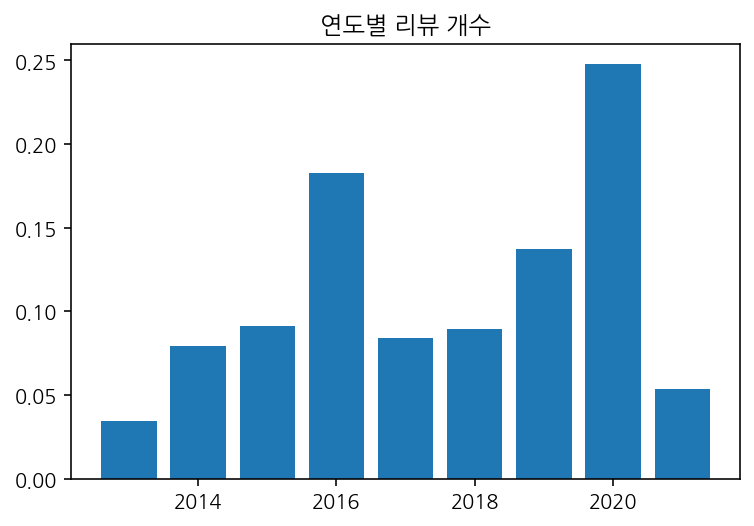

In [ ]:
#연도별 전체 리뷰 개수 그래프

#연도별 리뷰 개수
element_count = {}

for item in data["date"].dt.year:
    element_count.setdefault(item,0)
    element_count[item] += 1
    
review_count = pd.DataFrame.from_dict(element_count, orient = 'index',columns=["review_count"])
review_count['percentage'] = (review_count['review_count'] / review_count['review_count'].sum()) * 100

print(review_count)

#그래프
x=element_count
keys = x.keys()
vals = x.values()
plt.bar(keys, np.divide(list(vals), sum(vals)))
plt.title("연도별 리뷰 개수")

- AppStore 리뷰 322건과 GooglePlay 리뷰 1023건을 합친 총 1345건의 리뷰 데이터(2013.08-2021.06)

In [ ]:
# Dinamic Topic Modeling

def by_year(input_year):
  ## 연도별 데이터
  df_year = data[data['date'].dt.year==input_year]
  df_year=df_year.reset_index(drop=True)


  ## 맞춤법 검사
  data_list = df_year['comment'].values.tolist()
  clean=[]
  for i in range(len(data_list)):
    try:
      result = spell_checker.check(df_year['comment'][i]).checked 
      clean.append(result)
    except Exception as e:
      continue
  df_year['clean'] = clean
  ## '주차장' 단어 삭제
  df_year['clean']=df_year['clean'].str.replace('주차장', ' ') 
  # df_year['clean']=df_year['clean'].str.replace('사용', ' ')  
  # df_year['clean']=df_year['clean'].str.replace('어플', ' ')  


  ## 키워드 (phrase가 제일 잘 나옴)
  data_list2 = df_year['clean'].values.tolist()
  data_phrases=[]
# data_morphs=[]
# data_nouns=[]
  for i in range(len(data_list2)):   # phrases
    a=okt.phrases(data_list2[i])
    data_phrases.append(a)
# for i in range(len(data_list2)):   # #morphs
#   b=okt.morphs(data_list2[i])
#   data_morphs.append(b)
# for i in range(len(data_list2)):   # #nouns
#   c=okt.nouns(data_list2[i])
#   data_nouns.append(c)

  df_year['phrases'] = data_phrases
# df_21['morphs'] = data_morphs
# df_21['nouns'] = data_nouns


  ## gensim, LDA
  review_phrases=df_year['phrases'].tolist()

  review_bigram = gensim.models.Phrases(review_phrases)
  review_trigram = gensim.models.Phrases(review_bigram[review_phrases])
  review_bigram_model = gensim.models.phrases.Phraser(review_bigram)
  review_trigram_model = gensim.models.phrases.Phraser(review_trigram)

  review_bigram_document = [review_bigram_model[phrases] for phrases in review_phrases]
  review_id2word = corpora.Dictionary(review_bigram_document)
  review_corpus = [review_id2word.doc2bow(doc) for doc in review_bigram_document]

  review_coherence_score=[]
  for i in range(2,10):
    model = gensim.models.ldamodel.LdaModel(corpus=review_corpus, id2word=review_id2word, num_topics=i, random_state=42)
    coherence_model = CoherenceModel(model, texts=review_bigram_document, dictionary=review_id2word, coherence='c_v')
    coherence_lda = coherence_model.get_coherence()
    # print('n=',i,'\nCoherence Score: ', coherence_lda)
    review_coherence_score.append(coherence_lda)

  ##토픽수& 정합점수 그래프
  k=[]
  for i in range(2,10):
      k.append(i)

  x=np.array(k)
  y=np.array(review_coherence_score)
  plt.title('Topic Coherence')
  plt.plot(x,y)
  plt.xlim(2,10)
  plt.xlabel('Number Of Topic (2-10)')
  plt.ylabel('Coherence Score')
  plt.show()
  print('\n\n')

  ##num_topics
  li_m=[]
  li_cv=[]
  for m,cv in zip(x,y):
    # print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
    li_m.append(m)
    li_cv.append(cv)
  tmp=np.max(li_cv)
  index = li_cv.index(tmp)
  num_topics=li_m[index]

  ##topics
  review_model = gensim.models.ldamodel.LdaModel(corpus=review_corpus, id2word=review_id2word, num_topics=num_topics, random_state=42)
  review_model.print_topics()

  ##시각화(Intertopic distance map, 다차원 척도법)
  prepared_data = gensimvis.prepare(review_model, review_corpus, review_id2word)

  return pyLDAvis.display(prepared_data) 

#### 1) 2021년 리뷰데이터

##### ▶ 토픽모델링

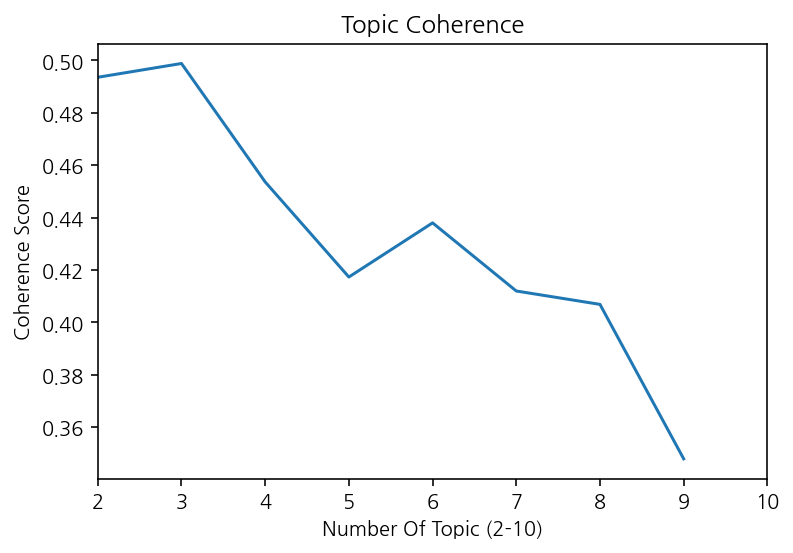

In [ ]:
by_year(2021)

<토픽모델링의 해석>
- coherence model을 이용하여 최적의 토픽갯수 확인
- 왼쪽 맵 : 원이 가까울수록 비슷한 주제의 토픽, 멀수록 다른 주제의 토픽이다.
- 오른쪽 맵 : 토픽x에 대해 가장 관련성 높은 30개 단어
- Overall term frequency : 전체 단어에서의 빈도
- Estimated term frequency within the selected topic : 해당 토픽 안에서의 단어 빈도

< 2021년 리뷰데이터 토픽모델링 결과 >

- 최적의 토픽갯수: 3개
- 그래프 왼쪽에서 1부터 3까지의 토픽 확인 가능
- λ값 0.5로 설정하여 토픽의 구성단어 확인함
- 구성단어로 유추하여 토픽 설정
- 각 토픽 단어 확인
  - Topic[1] : 주차, 결제, 업데이트, 수정, 공영 등
  - Topic[2] : 주차, 이용, 시간, 정보, 다른, 서비스 등
  - Topic[3] : 주차, 사용, 센터, 공유, 통해, 다시 등

- 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - Topic[1] : 주차 결제 및 업데이트 수정 사항에 관한 주제(36.2%)
  - Topic[2] : 주차 이용 시간 및 정보에 관한 주제(32.2%)
  - Topic[3] : 고객센터 및 공유주차장에 관한 주제(31.5%)

결론
- 2021년 리뷰를 토픽모델링 한 결과 리뷰를 크게 3가지로 나눌 수 있으며, 이는 **결제 및 업데이트 수정 사항, 이용 시간에 대한 정보, 고객센터 및 공유주차장**에 관련한 것임을 확인할 수 있다.

#### 2) 2020년 리뷰데이터

##### ▶ 토픽모델링

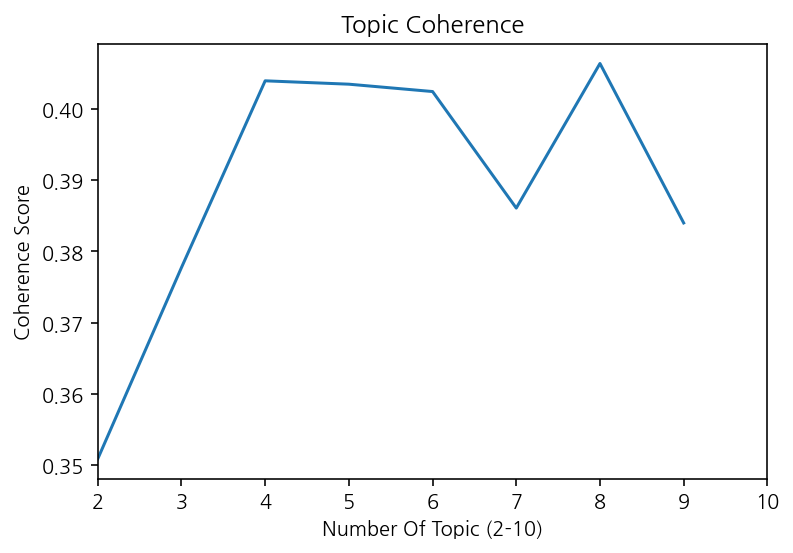

In [ ]:
by_year(2020)

< 2020년 리뷰데이터 토픽모델링 결과 >

- 최적의 토픽갯수: 8개

- 각 토픽 단어 확인
  - Topic[1] : 사용, 어플, 주차, 서울, 공유, 이용, 어디, 구매 등
  - Topic[2] : 정보, 주차, 이용, 요금, 사용, 어플, 결제, 확인 ,전화, 검색, 고객센터, 환불 등
  - Topic[3] : 주차, 이용, 공유, 어플, 다른, 모두, 결제, 하나, 정보, 사용 등
  - Topic[4] : 정말, 주차, 사용, 미리, 업데이트, 정보, 구매, 결제, 주차권, 실행 등
  - ...

- 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - Topic[1] : 주차 어플 사용 및 공유주차장 이용에 관한 주제, 서울에 관한 주제(17.2%)
  - Topic[2] : 주차 정보, 이용 요금 및 결제에 관한 주제, 고객센터 환불에 관한 주제(16%)
  - Topic[3],[5]-[8] : 공유주차장 이용, 결제 및 제휴에 관한 주제 (44.9%)
  - Topic[4] : 정보 업데이트 및 주차권에 관한 주제, 미리&사전 예약,구매에 관한 주제(11.9%)

결론 
- 2020년 리뷰를 토픽모델링 한 결과 리뷰를 크게 4가지로 나눌 수 있으며, 이는 **공유주차장과 서울지역 앱 사용, 주차정보 및 이용요금과 고객센터환불, 공유주차장 이용 및 결제, 정보 업데이트 및 주차권과 사전예약**에 관한 것임을 확인할수 있다.

##### ▶ 20-21년 단어 빈도, 시각화



In [ ]:
#전체 데이터 단어 순위
pos_data = pd.DataFrame(okt.pos(df['comment'].values.tolist()[0])).rename(columns = {0:'형태소',1:'품사'})
pos_data

,형태소,품사
0,최고,Noun
1,조앙,Noun


In [ ]:
#전체 데이터 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(df['comment'])):
    dfn = pd.DataFrame(okt.pos(df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})
print(df_Pos.shape)

#품사별 개수
pd.DataFrame(df_Pos['품사'].value_counts())

(7887, 2)


,품사
Noun,3539
Josa,1203
Verb,1148
Adjective,875
Punctuation,397
Suffix,147
Adverb,132
Modifier,129
Number,90
VerbPrefix,61


시각화1 - 형용사

In [ ]:
#형용사 빈도수
cond1 = (df_Pos['품사'] == 'Adjective')
df_N = df_Pos.loc[cond1]
print(df_N.shape)
pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()


(875, 2)


,형태소,빈도수
0,좋아요,56
1,있습니다,30
2,입니다,26
3,좋습니다,15
4,좋은,14
5,좋네요,12
6,편리하고,11
7,유용하게,11
8,저렴하게,10
9,저렴한,10


형용사 빈도


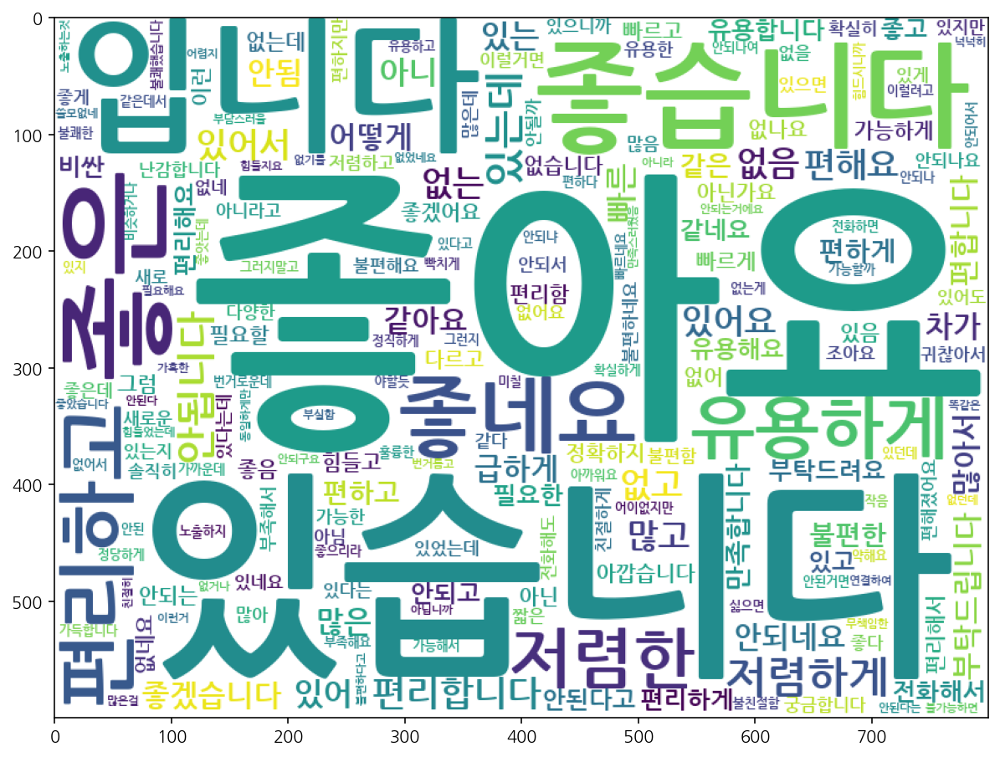

In [ ]:
#wordcloud 시각화
font_path = '/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf'
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('형용사 빈도')
plt.show()

시각화2 - 명사 빈도

In [ ]:
# 명사 빈도수
cond2 = (df_Pos['품사'] == 'Noun')
df_N = df_Pos.loc[cond2]
print(df_N.shape)
pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()

(3539, 2)


,형태소,빈도수
0,주차장,183
1,주차,157
2,결제,77
3,어플,63
4,앱,62
5,사용,61
6,이용,56
7,때,46
8,정보,46
9,모두,37


명사 빈도


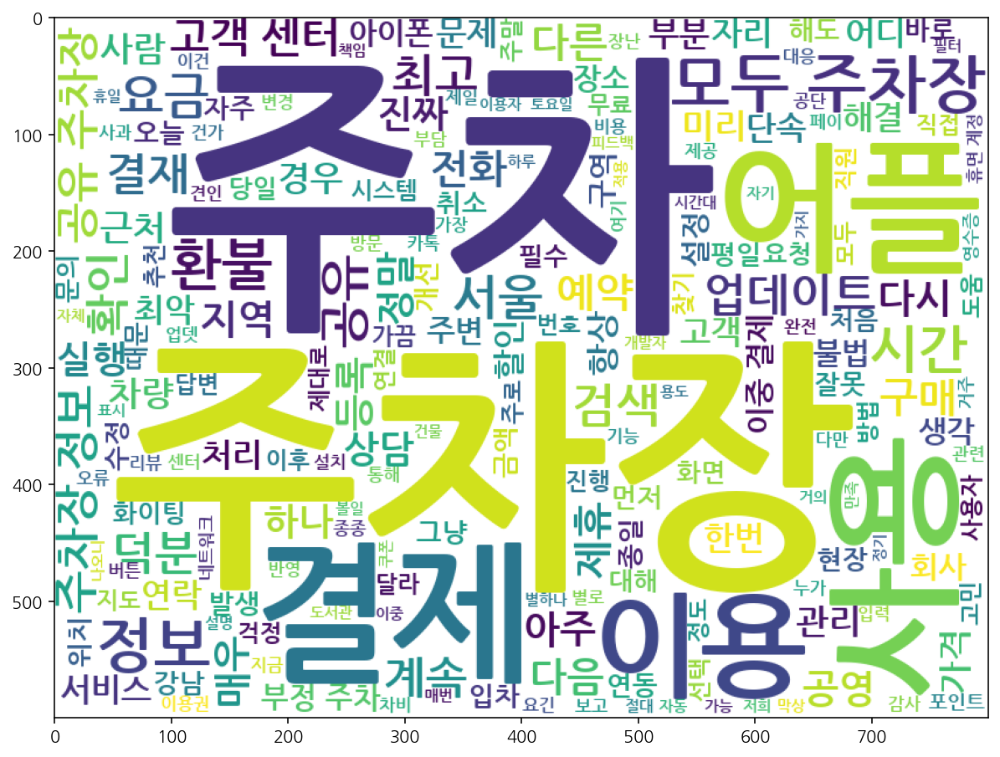

In [ ]:
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('명사 빈도')
plt.show()

#### 3) 2016년 리뷰데이터

#####▶ 토픽모델링

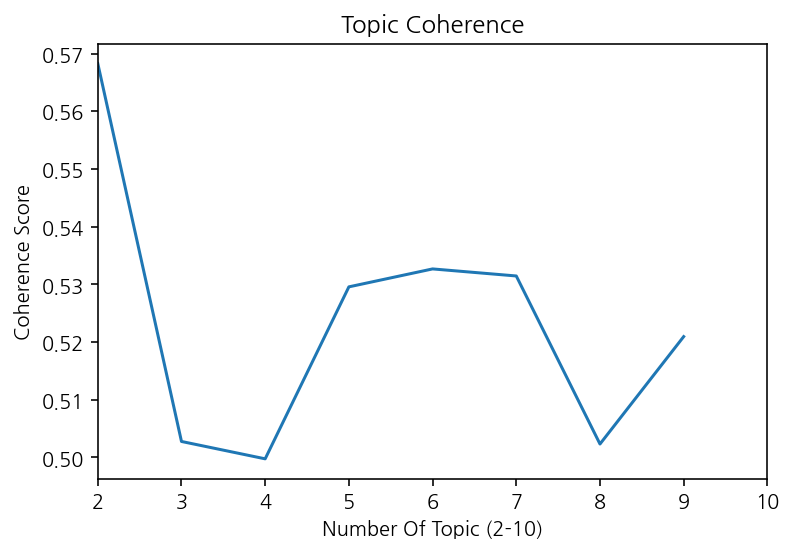

In [ ]:
by_year(2016)

< 2016년 리뷰데이터 토픽모델링 결과 >

- 최적의 토픽갯수: 2개

- 각 토픽 단어 확인
  - Topic[1] : 주차, 업데이트, 삭제, 사용, 어플 등
  - Topic[2] : 주차, 어플, 정말, 정보, 최고 등


- 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - Topic[1] : 업데이트 및 삭제에 대한 리뷰 (54.1%)
  - Topic[2] : 주차 정보 및 만족에 대한 리뷰 (45.9%)

결론
- 2016년 리뷰를 토픽모델링 한 결과 토픽을 크게 2가지로 나눌 수 있으며, 이는 **업데이트 및 삭제**, **주차정보 및 만족사항**에 관련한 것임을 확인할 수 있다.

#####▶ TF-IDF 단어 빈도

In [ ]:
# 2016년 리뷰(시리즈)
concat_df['date']=pd.to_datetime(concat_df["date"])
year_2016_review = concat_df[concat_df['date'].dt.year == 2016 ]['comment']

# 2016년 리뷰(데이터프레임)
year_2016_df = concat_df[concat_df['date'].dt.year == 2016]

#리뷰 개수
print('2016년 리뷰: ',len(year_2016_review),'개')

2016년 리뷰:  247 개


In [ ]:
# 정규식으로 한글, 빈공간, 숫자가 아닌것은 ""로 대체 => 한글, 빈공간, 숫자만 남김
year_2016_review = year_2016_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
def get_word_2016(sentence):
    nouns = okt.nouns(sentence)
    return [noun for noun in nouns if len(noun) > 1]

# 점수 낮은 리뷰 최근 10개
year_2016_review[:10]

300                                                 주차장 찾기 쏠쏠 쾌감을 한번 느끼면 계속 사용하게됍니다
157    정말 유용한 어플 아이폰 용량부족에도 자리를 굳건히 지키는 어플입니다 유용하게 잘 쓰고 있습니다 간혹 정보가 다른 경우가 있지만 쓸만해요
613                                 컨텐츠는 정말 좋아요 수고많으십니다 다만 자잘한 오류 작업 좀 신경써주시면 더 좋을듯
279                                                                 굿굿 아이고 편리합니다 굿굿
278                                                          업데이트 무한반복 업데이트 무한반복 오류
195                                                    매번 잘 쓰고있습니다 굳굳 업데이트 많이많이해주세요
609               업데이트 안하시나봐요 마트가 없어진지 몇달이됬고 30분에 600원받는 공용주차장이 무료라고하고 이러면 어찌 믿고쓸까요
235                                                             최고조넘 제일 좋은 주차장어플임니다
227                                              친절 친절 한 정보제공에 감사드려요 친절한 정보제공 감사합니다
269                                                     실행불가 업데이트후 실행시 업데이트하라고 무한반복
Name: comment, dtype: object

In [ ]:
# TF-IDF
high_tfvector = TfidfVectorizer(tokenizer=get_word_2016,max_features=300)
high_tdf_tf = high_tfvector.fit_transform(year_2016_review)
high_tf_words = high_tfvector.get_feature_names()

count_mat = high_tdf_tf.sum(axis=0)
count = np.squeeze(np.asarray(count_mat))
high_rating_word_count_tf = list(zip(high_tf_words, count))
high_rating_word_count_tf = sorted(high_rating_word_count_tf, key=lambda t:t[1], reverse=True)

print("<TF-IDF>\n")
high_rating_word_count_tf[:15]

<TF-IDF>



[('삭제', 20.25621690684409),
 ('주차', 14.717264167898348),
 ('주차장', 11.96292341243159),
 ('어플', 11.230255657496262),
 ('최고', 9.201789330669646),
 ('정보', 8.201152524032716),
 ('정말', 8.097868862794678),
 ('업데이트', 7.321443194328717),
 ('사용', 7.321222478499685),
 ('목록', 7.139160993398781),
 ('구매', 6.3563068280964785),
 ('아주', 4.431625189126769),
 ('알림', 4.402150495884252),
 ('도움', 4.304763457374258),
 ('무료', 3.6769242910875306)]

In [ ]:
year_df = pd.DataFrame(high_rating_word_count_tf, columns=['단어','TF-IDF 중요도'])
year_df.head(10)

,단어,TF-IDF 중요도
0,삭제,20.256217
1,주차,14.717264
2,주차장,11.962923
3,어플,11.230256
4,최고,9.201789
5,정보,8.201153
6,정말,8.097869
7,업데이트,7.321443
8,사용,7.321222
9,목록,7.139161


In [ ]:
# 한글 깨짐 현상 개선
from matplotlib import rc
plt.rcParams['font.family'] = 'NanumGothic'
print(plt.rcParams['font.family'])

['NanumGothic']


Text(0.5, 1.0, '2016 리뷰 TF-IDF 중요도')

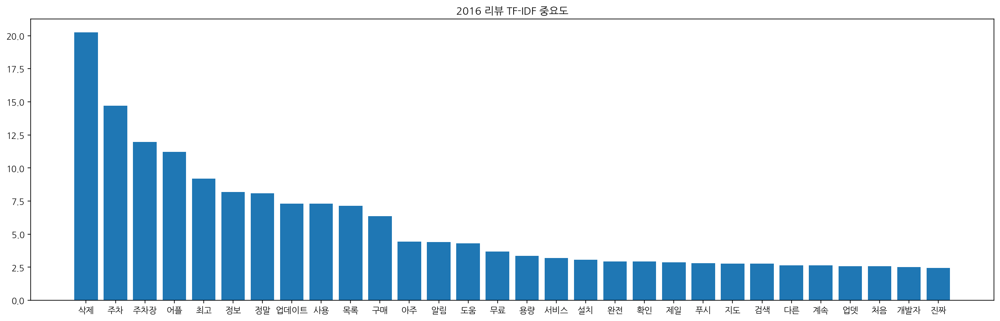

In [ ]:
# TF-IDF 중요도
plt.figure(figsize=(20,6))
plt.bar(year_df['단어'][:30],year_df['TF-IDF 중요도'][:30])
plt.title('2016 리뷰 TF-IDF 중요도')

#####▶ 시각화

높은 빈도수 단어

In [ ]:
year_2016_document = year_2016_review.values

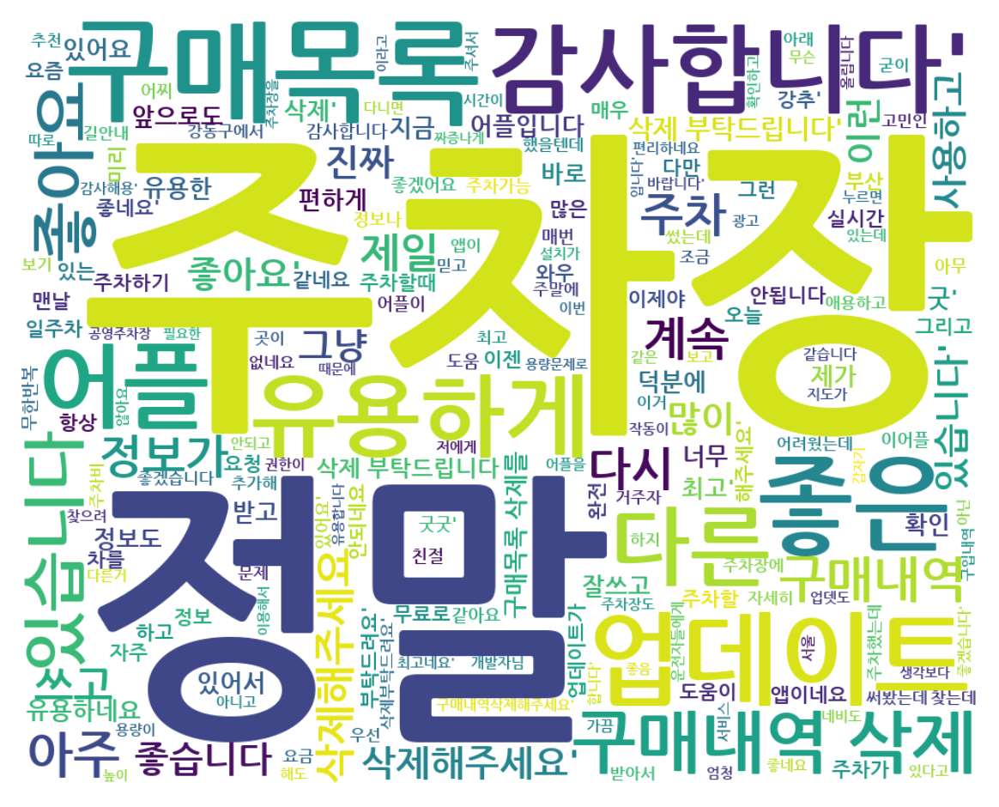

In [ ]:
font_path = '/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf'
wc = WordCloud(width = 1000, height = 800, background_color="white", font_path=font_path).generate(np.array2string(year_2016_document))
plt.figure(figsize=(6, 5), dpi=120)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

형용사 빈도

형용사 빈도수 (404, 2)
      형태소  빈도수
0  부탁드립니다   16
1     좋아요   16
2     입니다   16
3      좋은   15
4    있습니다   12
5    유용하게    9
6     좋네요    8
7   부탁드려요    7
8     있어요    7
9    좋습니다    6


<2016년 리뷰 형용사 빈도 시각화>


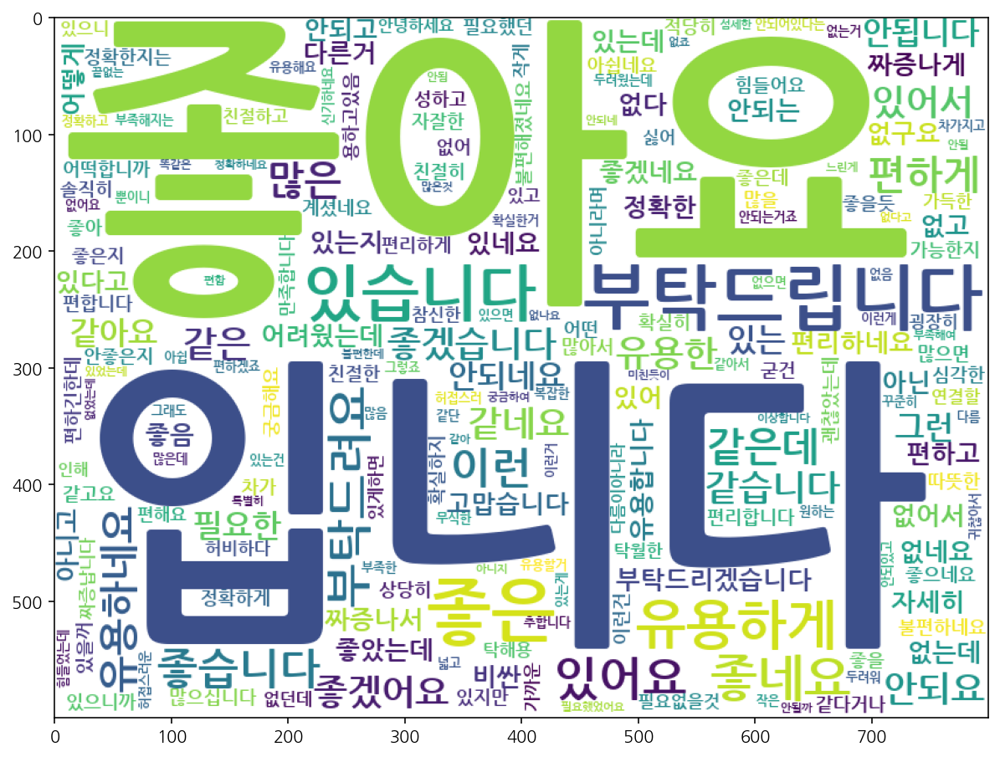

In [ ]:
# 5점 별점 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(year_2016_df['comment'])):
    dfn = pd.DataFrame(okt.pos(year_2016_df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})

# 형용사 빈도수
cond1 = (df_Pos['품사'] == 'Adjective')
df_N = df_Pos.loc[cond1]
print("형용사 빈도수", df_N.shape)
a=pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()
print(a)

# wordcloud 시각화 2 (형용사 단어)
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('\n\n<2016년 리뷰 형용사 빈도 시각화>')
plt.show()

명사 빈도

명사 빈도수 (1687, 2)
    형태소  빈도수
0    주차   60
1    삭제   59
2   주차장   52
3    어플   35
4     앱   29
5    정보   27
6     역   27
7    목록   23
8    구매   22
9  업데이트   21


<2016년 리뷰 명사 빈도 시각화>


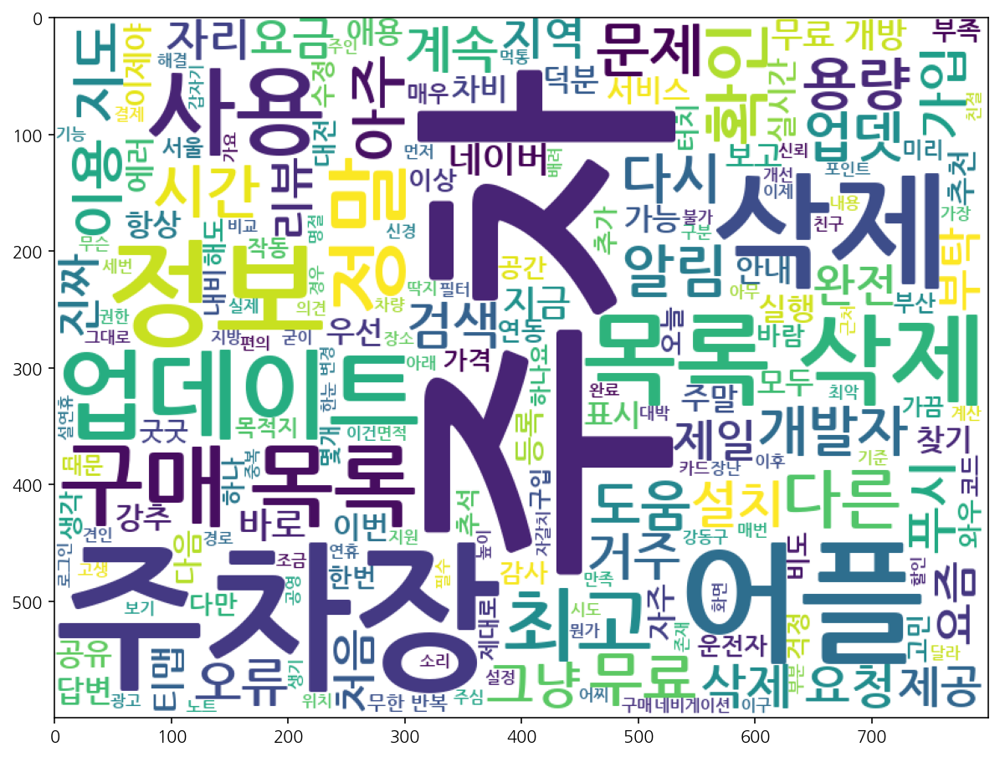

In [ ]:
# 5점 별점 형태소 개수
df_Pos = pd.DataFrame()
for i in range(0, len(year_2016_df['comment'])):
    dfn = pd.DataFrame(okt.pos(year_2016_df['comment'].values.tolist()[i]))
    df_Pos = pd.concat([df_Pos, dfn])
    
df_Pos = df_Pos.rename(columns = {0:'형태소', 1:'품사'})

# 형용사 빈도수
cond2 = (df_Pos['품사'] == 'Noun')
df_N = df_Pos.loc[cond2]
print("명사 빈도수", df_N.shape)
a=pd.DataFrame(df_N.value_counts('형태소')).rename(columns = {0:'빈도수'}).head(10).reset_index()
print(a)

# wordcloud 시각화 2 (명사) 단어)
wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=600, font_path=font_path).generate(' '.join(df_N['형태소']))
plt.figure(figsize=([10,10]))
plt.imshow(wc)
print('\n\n<2016년 리뷰 명사 빈도 시각화>')
plt.show()

#####▶ 유사도로 만족 리뷰 확인

In [ ]:
df_year_list = year_2016_df['comment'].tolist()

In [ ]:
nn = NearestNeighbors(n_neighbors=10, algorithm='kd_tree')
nn.fit(high_tdf_tf)

text = '삭제'
test1 = high_tfvector.transform([text])

pd.options.display.max_colwidth = 150

# result
print("Test 문장 : " ,text)
print("------------------------------------")
for idx, row in enumerate(nn.kneighbors(test1.todense())[1][0]):
    print("{0}번째로 가장 유사한 문장 : \n {1}".format(idx+1, df_year_list[row]))
    print('\n')


Test 문장 :  삭제
------------------------------------
1번째로 가장 유사한 문장 : 
 구매내역 삭제 부탁드립니다 구매내역 삭제 부탁드립니다


2번째로 가장 유사한 문장 : 
 구매내역삭제 안되네요 구매내역삭제해주세요


3번째로 가장 유사한 문장 : 
 구매내역삭제부탁드립니다 구매내역삭제부탁드립니다


4번째로 가장 유사한 문장 : 
 구매내역 삭제 부탁드립니다 구매내역 삭제 부탁드립니다


5번째로 가장 유사한 문장 : 
 구매내역 삭제해주세요 구매내역 삭제해주세요


6번째로 가장 유사한 문장 : 
 구매내역 삭제해주세요 구매내역 삭제해주세요


7번째로 가장 유사한 문장 : 
 삭제 구매내역삭제해주세요


8번째로 가장 유사한 문장 : 
 구매내역 삭제해주세요 구매내역 삭제해주세요


9번째로 가장 유사한 문장 : 
 구매내역 구매내역 삭제 부탁드립니다


10번째로 가장 유사한 문장 : 
 구매목록 삭제해주세요 삭제부탁드려요




In [ ]:
nn = NearestNeighbors(n_neighbors=10, algorithm='kd_tree')
nn.fit(high_tdf_tf)

text = '업데이트'
test1 = high_tfvector.transform([text])

pd.options.display.max_colwidth = 150

# result
print("Test 문장 : " ,text)
print("------------------------------------")
for idx, row in enumerate(nn.kneighbors(test1.todense())[1][0]):
    print("{0}번째로 가장 유사한 문장 : \n {1}".format(idx+1, df_year_list[row]))
    print('\n')


Test 문장 :  업데이트
------------------------------------
1번째로 가장 유사한 문장 : 
 업데이트 712 쓰고있습니다


2번째로 가장 유사한 문장 : 
 업데이트가 이상합니다 제대로 안되는 듯


3번째로 가장 유사한 문장 : 
 매번 잘 쓰고있습니다 굳굳 업데이트 많이많이해주세요


4번째로 가장 유사한 문장 : 
 업데이트 완료 안되고 멈춰있음 업데이트가 완료되지않고 멈춰있습니다 보기 싫어 지우려고 해도 지워지지도 않아요 진짜 짜증납니다 다시 업데이트를 내놓고 해결해주세요


5번째로 가장 유사한 문장 : 
 강제업데이트는아니지


6번째로 가장 유사한 문장 : 
 좋아요 좋네요


7번째로 가장 유사한 문장 : 
 굿


8번째로 가장 유사한 문장 : 
 잘이용하고있음


9번째로 가장 유사한 문장 : 
 잘 쓰겠습니다~


10번째로 가장 유사한 문장 : 
 참좋아요 좋아요




#####▶ App Store 2016년 리뷰 수 증가에 대한 해석

2016년 월 별 리뷰 수
    review_count  percentage
12            13    5.263158
11            14    5.668016
10            14    5.668016
9             27   10.931174
8             17    6.882591
7             12    4.858300
6             24    9.716599
5             19    7.692308
4             20    8.097166
3             16    6.477733
2             59   23.886640
1             12    4.858300


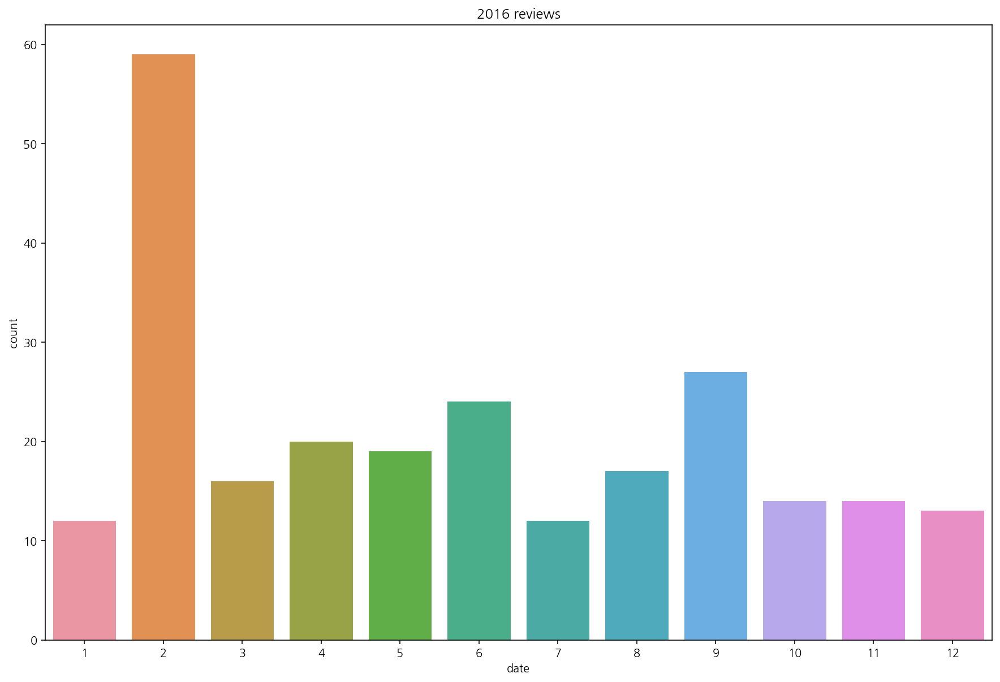

In [ ]:
# 별점 분포 확인
# print(df['ratings'].value_counts(normalize=True))
year_2016_df= concat_df[concat_df['date'].dt.year == 2016]
plt.figure(figsize=(15,10))
sns.countplot(year_2016_df['date'].dt.month);
plt.title("2016 reviews");

#2016년 월 별 리뷰 수
print("2016년 월 별 리뷰 수")
element_count = {}
for item in year_2016_df["date"].dt.month:
    element_count.setdefault(item,0)
    element_count[item] += 1
review_count = pd.DataFrame.from_dict(element_count, orient = 'index',columns=["review_count"])
review_count['percentage'] = (review_count['review_count'] / review_count['review_count'].sum()) * 100
print(review_count)

- 그래프 상 앱스토어의 2016년 리뷰의 수가 전,후 년도에 비해 약 2배 많았는데 토픽과 단어 빈도를 살펴본 결과 '최고, 좋아요'와 같은 만족 리뷰가 많았다. 리뷰를 통해 리뷰 수가 증가한 원인은 직관적으로 알 수는 없었지만, 이용자 증가와 이벤트 및 홍보 효과 등과 같은 외부요인의 이유로 추측해본다.
- 특이사항으로 다른 년도와 비교했을 때 '구매내역 삭제부탁, 업데이트 문제'관련 리뷰가 많았다.
- 아래 그래프를 통해 특히 2월에 리뷰 수가 급증한 것을 확인하였다.  
- 블로그와 페이스북 글 확인 결과 16년 2월 명절 무료주차장 개방 정보제공과 이벤트가 있음을 확인했다. 명절연휴, 무료주차장 정보, 이벤트 홍보가 이용자 리뷰에 영향을 준 것으로 보인다.

#### 4) 동적토픽모델링(시간에 따른 토픽 출현빈도 분석)

######▶ 자연어처리

In [ ]:
#년/월 데이터 사용
data2=data.sort_values(by='date')
data2=data2.reset_index()
data2['date2']=data2['date'].dt.strftime("%Y-%m")

## 맞춤법 검사
data_list = data2['comment'].values.tolist()
clean=[]
for i in range(len(data_list)):
  try:
    result = spell_checker.check(data2['comment'][i]).checked 
    clean.append(result)
  except Exception as e:
    continue
data2['comment'] = clean

In [ ]:
review_comment = data2.get('comment')
# review_date = data2.get('date')
review_date = data2.get('date2')

#불용어처리
stop_words = "주차장 어플 정보 사용 이용 결제 모두 주차 정말 업데이트"
stop_words = stop_words.split(' ')

#단어 추출
review_nouns = []
nouns = []
for comment in review_comment:
    for noun in okt.phrases(comment):
        if noun not in stop_words:
            nouns.append(noun)
    review_nouns.append(nouns)

review_nouns_date={}
for i in range(len(data2)):
    if review_date[i] in review_nouns_date:
        review_nouns_date[review_date[i]].append(review_nouns[i])
    else:
        review_nouns_date[review_date[i]]=[]
        review_nouns_date[review_date[i]].append(review_nouns[i])

# 날짜별 단어 추출
review_nouns_date = sorted(review_nouns_date.items())
review_nouns_date[0]

('2013-08',
 [['이거',
   '꼭 다운로드',
   '다운로드',
   '다운로드',
   '실행하자마자',
   '실행하자마자 오류',
   '실행하',
   '자마자',
   '오류',
   '로딩',
   '그냥',
   '그냥 지도',
   '기반',
   '주차장 정보',
   '주차장 정보 제공',
   '지도',
   '제공',
   '우연',
   '기회',
   '설치',
   '서울시내',
   '매우',
   '매우 유용할 것',
   '지방',
   '이동',
   '많은 비즈니스맨',
   '실질적 도움',
   '어플 감사',
   '비즈니스맨',
   '도움',
   '감사',
   '유용할 것',
   '지금',
   '지금 설치',
   '복잡한 서울시내',
   '꼭 필요한 앱',
   '설치',
   '서울시내',
   '유용한 엡같아',
   '아주',
   '엡같아',
   '실행',
   '모두의 주차장',
   '모두의 주차장 애플리케이션',
   '모두의 주차장 애플리케이션                         프로세스',
   '모두의 주차장 애플리케이션                         프로세스 이',
   '모두의 주차장 애플리케이션                         프로세스 이 예상치',
   '중지',
   '다시',
   '다시 시도',
   '라며',
   '신고',
   '신고 버튼',
   '스플래시',
   '스플래시 이미지',
   '다운',
   '애플리케이션',
   '프로세스',
   '예상치',
   '시도',
   '버튼',
   '이미지',
   '조금',
   '디자인',
   '다른',
   '다른 데',
   '이쪽',
   '이쪽 사는 사람들',
   '사람들',
   '주차공간',
   '도움',
   '그냥',
   '그냥 요금',
   '그냥 요금 정보',
   '요일제',
   '요일제 할인',
   '요일제 할인 등',
   '요일제 

In [ ]:
#날짜별단어개수
review_nouns_dates=[]
review_date_length=[]
for i in range(len(review_nouns_date)):
    review_nouns_dates.append(review_nouns_date[i][1])
    review_date_length.append(len(review_nouns_date[i][1]))

review_date_length[0:20]

[11, 5, 2, 2, 26, 9, 3, 4, 3, 8, 4, 12, 17, 18, 5, 14, 10, 13, 12, 7]

In [ ]:
#날짜와 리뷰 합치기
review_merged_dates=[]
for posts in review_nouns_dates:
    for post in posts:
        review_merged_dates=review_merged_dates+[post]

review_merged_dates[0]

['이거',
 '꼭 다운로드',
 '다운로드',
 '다운로드',
 '실행하자마자',
 '실행하자마자 오류',
 '실행하',
 '자마자',
 '오류',
 '로딩',
 '그냥',
 '그냥 지도',
 '기반',
 '주차장 정보',
 '주차장 정보 제공',
 '지도',
 '제공',
 '우연',
 '기회',
 '설치',
 '서울시내',
 '매우',
 '매우 유용할 것',
 '지방',
 '이동',
 '많은 비즈니스맨',
 '실질적 도움',
 '어플 감사',
 '비즈니스맨',
 '도움',
 '감사',
 '유용할 것',
 '지금',
 '지금 설치',
 '복잡한 서울시내',
 '꼭 필요한 앱',
 '설치',
 '서울시내',
 '유용한 엡같아',
 '아주',
 '엡같아',
 '실행',
 '모두의 주차장',
 '모두의 주차장 애플리케이션',
 '모두의 주차장 애플리케이션                         프로세스',
 '모두의 주차장 애플리케이션                         프로세스 이',
 '모두의 주차장 애플리케이션                         프로세스 이 예상치',
 '중지',
 '다시',
 '다시 시도',
 '라며',
 '신고',
 '신고 버튼',
 '스플래시',
 '스플래시 이미지',
 '다운',
 '애플리케이션',
 '프로세스',
 '예상치',
 '시도',
 '버튼',
 '이미지',
 '조금',
 '디자인',
 '다른',
 '다른 데',
 '이쪽',
 '이쪽 사는 사람들',
 '사람들',
 '주차공간',
 '도움',
 '그냥',
 '그냥 요금',
 '그냥 요금 정보',
 '요일제',
 '요일제 할인',
 '요일제 할인 등',
 '요일제 할인 등의 할인정보',
 '일절',
 '일절 없다는 게',
 '요금',
 '할인',
 '월 주차',
 '표시',
 '표시되면 더',
 '표시되면 더 좋을 듯',
 '별로',
 '강남',
 '시간당',
 '시간당 2000',
 '시간당 2000 원하는 주차장',
 '2000',
 '진짜',
 '진짜 도

In [ ]:
def docLDA(nouns):
    bigram = gensim.models.Phrases(nouns)
    trigram = gensim.models.Phrases(bigram[nouns])
    bigram_mod = gensim.models.phrases.Phraser(bigram)
    trigram_mod = gensim.models.phrases.Phraser(trigram)

    bigram_document = [bigram_mod[doc] for doc in nouns]
    id2word = corpora.Dictionary(bigram_document)

    corpus = [id2word.doc2bow(doc) for doc in bigram_document]
    model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=6)
    
    return model, corpus, id2word

#LDA
review_model, review_corpus, review_id2word = docLDA(review_nouns)
review_model.print_topics()

[(0,
  '0.007*"다른" + 0.007*"공유" + 0.006*"요금" + 0.006*"확인" + 0.006*"시간" + 0.006*"최고" + 0.006*"무료" + 0.006*"모두의 주차장" + 0.005*"서울" + 0.005*"삭제"'),
 (1,
  '0.006*"공유" + 0.006*"모두의 주차장" + 0.006*"최고" + 0.005*"다른" + 0.005*"무료" + 0.005*"시간" + 0.004*"삭제" + 0.004*"검색" + 0.004*"요금" + 0.004*"확인"'),
 (2,
  '0.006*"다른" + 0.006*"시간" + 0.005*"공유" + 0.005*"검색" + 0.005*"삭제" + 0.005*"구매" + 0.005*"최고" + 0.005*"무료" + 0.004*"확인" + 0.004*"서울"'),
 (3,
  '0.006*"다른" + 0.006*"모두의 주차장" + 0.006*"삭제" + 0.006*"최고" + 0.005*"공유" + 0.005*"시간" + 0.005*"무료" + 0.005*"요금" + 0.005*"서울" + 0.005*"확인"'),
 (4,
  '0.007*"시간" + 0.007*"공유" + 0.006*"다른" + 0.006*"서울" + 0.005*"최고" + 0.005*"확인" + 0.005*"요금" + 0.005*"계속" + 0.004*"삭제" + 0.004*"다시"'),
 (5,
  '0.008*"공유" + 0.007*"요금" + 0.006*"다른" + 0.006*"확인" + 0.006*"최고" + 0.005*"삭제" + 0.005*"시간" + 0.005*"서울" + 0.004*"모두의 주차장" + 0.004*"아주"')]

In [ ]:
#토픽
def getTopics(model):
    topics = []
    for topic in model.print_topics():
        i=1
        model_words=[]
        topic_words=str(topic).split('"')
        for words in topic_words:
            if i%2==0:
                model_words.append(words)
            i+=1
        topics.append(model_words)
    return topics
    
review_topics = getTopics(review_model)
review_topics

[['다른', '공유', '요금', '확인', '시간', '최고', '무료', '모두의 주차장', '서울', '삭제'],
 ['공유', '모두의 주차장', '최고', '다른', '무료', '시간', '삭제', '검색', '요금', '확인'],
 ['다른', '시간', '공유', '검색', '삭제', '구매', '최고', '무료', '확인', '서울'],
 ['다른', '모두의 주차장', '삭제', '최고', '공유', '시간', '무료', '요금', '서울', '확인'],
 ['시간', '공유', '다른', '서울', '최고', '확인', '요금', '계속', '삭제', '다시'],
 ['공유', '요금', '다른', '확인', '최고', '삭제', '시간', '서울', '모두의 주차장', '아주']]

In [ ]:
review_topic_size=[]
index=0
for post_len in review_date_length:
    topic_size=[]
    doc=[]
    for i in range(post_len):
        doc+=review_merged_dates[index]
        index+=1
    for model in review_topics:
        count=0
        for noun in doc:
            if noun in model:
                count+=1
        topic_size.append(count)
    review_topic_size.append(topic_size)

review_topic_size[0:10]

review_topic_array=np.array(review_topic_size)
review_topic_array

array([[ 5368,  5280,  5115,  5368,  5071,  5280],
       [ 2440,  2400,  2325,  2440,  2305,  2400],
       [  976,   960,   930,   976,   922,   960],
       [  976,   960,   930,   976,   922,   960],
       [12688, 12480, 12090, 12688, 11986, 12480],
       [ 4392,  4320,  4185,  4392,  4149,  4320],
       [ 1464,  1440,  1395,  1464,  1383,  1440],
       [ 1952,  1920,  1860,  1952,  1844,  1920],
       [ 1464,  1440,  1395,  1464,  1383,  1440],
       [ 3904,  3840,  3720,  3904,  3688,  3840],
       [ 1952,  1920,  1860,  1952,  1844,  1920],
       [ 5856,  5760,  5580,  5856,  5532,  5760],
       [ 8296,  8160,  7905,  8296,  7837,  8160],
       [ 8784,  8640,  8370,  8784,  8298,  8640],
       [ 2440,  2400,  2325,  2440,  2305,  2400],
       [ 6832,  6720,  6510,  6832,  6454,  6720],
       [ 4880,  4800,  4650,  4880,  4610,  4800],
       [ 6344,  6240,  6045,  6344,  5993,  6240],
       [ 5856,  5760,  5580,  5856,  5532,  5760],
       [ 3416,  3360,  3255,  3

######▶ 시각화

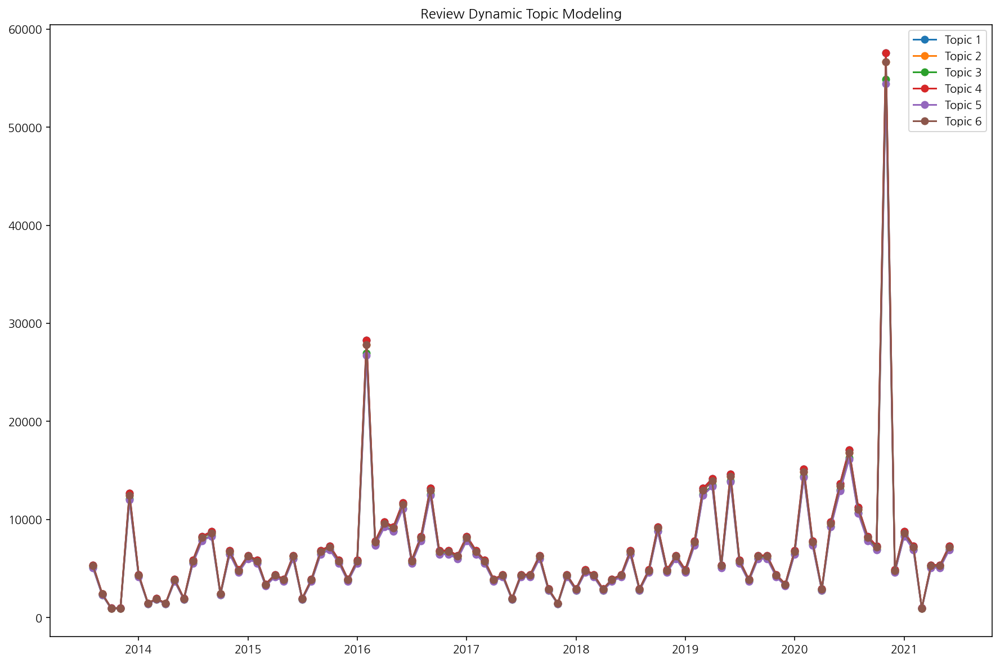

In [ ]:
import datetime as dt
#그래프
review_x=[]
review_y=[]

review_topic_1=review_topic_array[:,0]
review_topic_2=review_topic_array[:,1]
review_topic_3=review_topic_array[:,2]
review_topic_4=review_topic_array[:,3]
review_topic_5=review_topic_array[:,4]
review_topic_6=review_topic_array[:,5]

review_unique_date=sorted(list(set(review_date)))
review_plt_data=[]
for date in review_unique_date:
    times= dt.datetime.strptime(str(date),'%Y-%m')
    review_x.append(times)

plt.rcParams["figure.figsize"]=(15,10)
plt.title("Review Dynamic Topic Modeling")
plt.plot(review_x, review_topic_1,'o-', label="Topic 1")
plt.plot(review_x, review_topic_2,'o-', label="Topic 2")
plt.plot(review_x, review_topic_3,'o-', label="Topic 3")
plt.plot(review_x, review_topic_4,'o-', label="Topic 4")
plt.plot(review_x, review_topic_5,'o-', label="Topic 5")
plt.plot(review_x, review_topic_6,'o-', label="Topic 6")
plt.legend()
plt.show()

In [ ]:
review_topics

[['다른', '공유', '요금', '확인', '시간', '최고', '무료', '모두의 주차장', '서울', '삭제'],
 ['공유', '모두의 주차장', '최고', '다른', '무료', '시간', '삭제', '검색', '요금', '확인'],
 ['다른', '시간', '공유', '검색', '삭제', '구매', '최고', '무료', '확인', '서울'],
 ['다른', '모두의 주차장', '삭제', '최고', '공유', '시간', '무료', '요금', '서울', '확인'],
 ['시간', '공유', '다른', '서울', '최고', '확인', '요금', '계속', '삭제', '다시'],
 ['공유', '요금', '다른', '확인', '최고', '삭제', '시간', '서울', '모두의 주차장', '아주']]

#####▶ 결론

- 동적 토픽모델을 통해 각 토픽들이 시기적으로 어떻게 다른지 분석해 볼 수 있다. 하지만 토픽 주제가 비슷해서 토픽별 유의미한 결과는 얻지 못하였다. 
- 동적토픽모델은 한 주제에서 얻는 문서가 아닌 서로 다른 주제를 포함하는 문서(예.시기 별 주요 기사 토픽 등)에 사용하면 좋을 것 같다.
- 토픽개수는 데이터의 개수와 관계가 있는 것으로 보인다.

#2.기타 주차 앱

# 리뷰 분석 전 주차장앱별 기능 파악

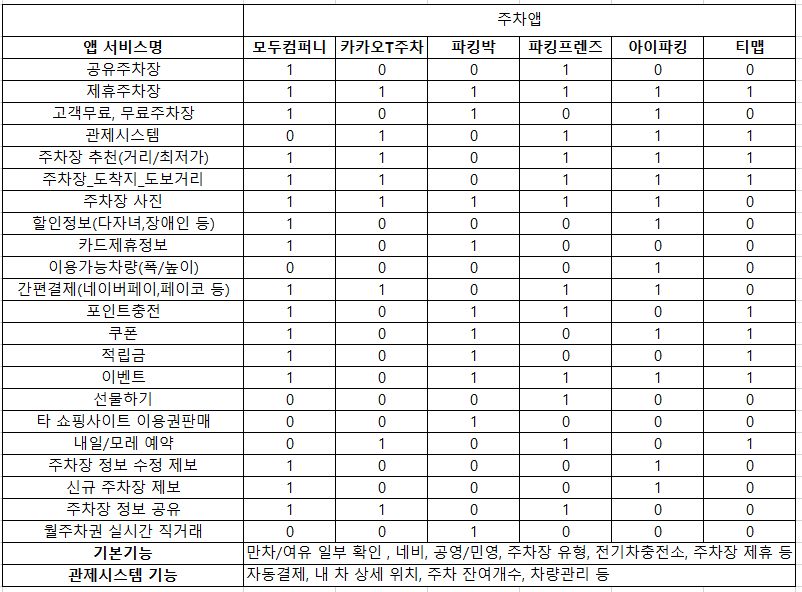



- 가장 다양한 형태의 주차 서비스를 제공하는 앱은 모두의주차장으로, 제휴나 공영, 무료주차장 뿐만아니라 공유주차장 서비스까지 제공하고 있다.  
- 공유주차장과 IoT기능을 결합해 차량유무를 실시간으로 감지하고 cctv를 설치해 휴대폰으로 집 앞 공유주차장을 확인 할 수 있다.
- 관제시스템을 갖춘 직영주차장 서비스를 제공하는 앱은 카카오T주차, 파킹프렌즈, 아이파킹, 티맵이다.   관제시스템이 적용되는 주차장에서는 출차시 자동결제가 가능하며, 차량의 상세위치, 주차 잔여대수 확인이 가능하여 고객의 편의를 증진시킬 수 있을 것으로 판단된다.  
- 주차장 관련 정보는 모두의주차장과 카카오T주차, 파킹프렌즈 모두 상세한 정보를 제공하고 있으나, 주차장을 이용할 수 있는 차종이나 폭, 높이 등에 관한 정보는 아이파킹이 유일하게 제공한다.   
- 할인(감면) 제도나 카드제휴와 같은 정보는 모두의주차장에서만 상세하게 제공되고 있다.  
- 카카오T주차를 제외한 모든 주차앱에서 앱내에서 이벤트를 안내하고 있었으며, 자사의 쿠폰을 발급하여 고객에게 추가적으로 할인혜택을 제공하는 것으로 확인된다.  
- 모두의주차장, 파킹박, 티맵은 포인트를 충전하여 주차비 결제를 용이하게 할 수 있으며, 충전시 적립금을 지급하여 충전을 유도한다.  
- 기존주차장에 대한 정보의 수정이나, 신규 주차장 제보의 기능을 가진 앱은 모두의주차장과 아이파킹이다. 해당기능을 통해 최신 정보를 다수 확보하여 더 나은 서비스를 제공할 수 있을 것으로 보인다. 아이파킹의 경우에는 정보 수정이나 제보시에 할인쿠폰을 제공한다는 혜택정보를 확인할 수 있었지만 모두의주차장에서는 별도의 안내를 찾아볼 수 없었다. 해당 고객들에게 인센티브를 주어 정보 제보를 적극적으로 장려하면 좋을 것 같다.  
- 파킹프렌즈에서는 주차권 선물하기 기능을 제공하고, 파킹박에서는 티몬 등 사이트에서 주차 이용권을 할인 판매 하고 있다. 
- 월 주차권 직거래 서비스는 파킹박에서 유일하게 제공하는 기능으로 이용자들끼리 월 주차권을 사고 팔 수 있다. 


- 전반적으로 보았을 때 선물하기, 주차권판매, 직거래 등의 일부앱만이 제공하는 특수한 기능을 제외하면 모두의주차장이 타앱에 비해 가장 많은 기능을 보유하고 있었다.

* 참고: 21년 1월자 뉴스기사에 따르면 운전자가 가장 많이 알고 있는 주차장앱은 카카오T주차(35%, 중복응답)와 Tmap주차(28.5%), 아이파킹(20.3%)과 모두의 주차장(19.6%), AJ파크(10.3%) 순이었다. 
 카카오T 주차는 카카오모빌리티의 모기업인 카카오의 인프라를 활용할 수 있어, 사실상 올인원 플랫폼을 통해 주차장 검색과 결제·이동까지 처리할 수 있다는 큰 장점을 가진 앱이다. 하지만 주차서비스가 카카오T에 속해있는 서비스이다보니 플레이스토어나 앱스토어에서 카카오T주차만의 리뷰데이터는 극소수에 불과해 이번 분석에 사용을 하지 못하였다는 한계점이 있다.



## Ⅰ. 아이파킹

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving iparking_review.csv to iparking_review.csv


In [ ]:
df = pd.read_csv('iparking_review.csv')
df

,name,ratings,date,comment
0,Angela Lee,1,2021-06-27,아이디도 오류땜에 못찾는다네요
1,minzzi _,1,2021-06-25,다운 받자마자 열려고하니 아예 그냥 꺼지는데요. 사용할수있게 해주셔야 써보고 리뷰를...
2,J.H. K,1,2021-06-23,"지난 3월인가? 개인정보, 위치 정보때문에 출차정보 기능 삭제되었네요. 혹시 개인정..."
3,2루미,1,2021-06-22,가입 알뜰폰은 가입조차 안됨 이라고 쓰려고 최근 리뷰 쭉 내려보는데 과거랑 최근 다...
4,던지자 자이로볼,1,2021-06-20,알뜰폰 회원가입이 안됨 알뜰폰 선택하는데서 드롭다운바가 안사라져서 폰번호 입력이 안...
...,...,...,...,...
608,KW JANG,1,2020-01-16,파킹패스해도 안되는 곳도 많고 감면조건 등록후에 저공해차량 할인되는곳에서 파킹패스로...
609,짜짜자짱,1,2020-01-13,감면조건 등록했는데 적용도 안됨ㅋㅋ 감면 조건 되는 차량임에도 불구하고
610,이미혜,3,2020-01-11,친구가 넘 좋다해서 다운받았어요. 근데 가입하고 카드랑 차량정보 등록한 후에 일일주...
611,밥묵자,2,2020-01-09,아니 추천인 아이디가 없으면 회원가입이 안되는게ㅋㅋㅋㅋㅋ어이가없네요... 없으니깐 ...


###1) 만족 리뷰 (평점 5점)

#### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] == 5]['comment']

In [ ]:
all_review[:3]

61    번창을 기원하고요 감면등록에서 어르신(65세) 이상 가능하시면 50%로 등록하게 부...
73      아이파킹 운영하는 업체가 대전에 여럿 있어서 편함. 자동결제도 되다 보니 또한 편함.
77    주차걱정이 사라졌어요ㅠ  ‍ 아이파킹이 진짜 물건이네요ㅠㅠㅠ 아이파킹덕분에 늘 했던...
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

61     번창을 기원하고요 감면등록에서 어르신65세 이상 가능하시면 50로 등록하게 부탁합니...
73         아이파킹 운영하는 업체가 대전에 여럿 있어서 편함 자동결제도 되다 보니 또한 편함
77     주차걱정이 사라졌어요   아이파킹이 진짜 물건이네요 아이파킹덕분에 늘 했던 주차걱정...
78     주차비 아끼기    아이파킹 어플 설치하고 사용한 후로 주차비에 쓰는 비용이 감소했...
79     주차장앱 처음써봄   지인이 아이파킹 추천해줘서 주차장 앱은 처음 사용해봤는데 진짜...
                             ...                        
600                      번거롭게 네비 안깔아도되고 티맵으로 바로 연결되서 편해요
601                          발렛되는 주차앱은 처음이에요 세상 많이 좋아졌네요
602                               주차 위치 찾기 넘 편리하네요 강추합니다
603                                    할인이 표시되어있어서 너무좋어요
605    주차장 이용이 정말 편리합니다 주변 주차장 최저가 비교 검색도 가능하고 예약 출차 ...
Name: comment, Length: 463, dtype: object

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['번창을 기원하고요 감면등록에서 어르신65세 이상 가능하시면 50로 등록하게 부탁합니다요 그런 곳이 있군요 노인에겐 많은 혜택입니다요 감사합니다 두번째 부탁합니다  주차권 간편 구매 주차권도 이제 모바일로 간편하게 관리소 방문없이 주차권 할인권을 간편하게 구매하세요  등록 할 때 나이 등록을 하면 되지 않을까요  번창을 기원하고요 감면등록에서 어르신65세 이상 가능하시면 50로 등록하게 부탁합니다요 그런 곳이 있군요 노인에겐 많은 혜택입니다요 감사합니다',
 '아이파킹 운영하는 업체가 대전에 여럿 있어서 편함 자동결제도 되다 보니 또한 편함',
 '주차걱정이 사라졌어요 \u2009 아이파킹이 진짜 물건이네요 아이파킹덕분에 늘 했던 주차걱정이 사라졌어요 진짜 정말 너무 감사드려요 주차때문에 스트레스 받은적이 한두번이 아니었거든요 이렇게 좋은건 줄 알았으면 진작에 앱 다운받아서 사용했었을텐데 지금부터라도 열심히 사용할거에요 주차는 늘 아이파킹과 함께할겁니다\u2003\u2000\u2007\u2009\u2001',
 '주차비 아끼기\u2008\u2002\u2000 아이파킹 어플 설치하고 사용한 후로 주차비에 쓰는 비용이 감소했어요 예전에는 그냥 돈 다 내고 주차했었는데 아이파킹을 알고난 후로부턴 그럴필요가 없으니까 주차비 아끼는게 가능하더라고요 이제라도 이 서비스를 알게되서 정말 감사할뿐입니다\u2007\u2005\u2001',
 '주차장앱 처음써봄\u2001\u200a 지인이 아이파킹 추천해줘서 주차장 앱은 처음 사용해봤는데 진짜 편하고 좋네요   이렇게 좋은 줄 알았으면 진작에 사용할 걸 그랬어요 주차와 관련된 정보 모든 것은 앱에서 볼 수 있는게 신세계였습니다 앞으로 자주 이용할 것 같아요',
 '고민하지말고 아이파킹\u2007 주차앱은 진짜 고민하지말고 아이파킹 사용하세요 제가 다른 주차서비스 앱도 사용해봤는데 아이파킹이 최고더라고요 왜 업계1위인지 알게되었습니다 사용하시면 알게될거에요 주차관련된 서비스는 다 제공해줘서 사용자로서 편하게 주차할 수 있습니다

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱 아이 파킹"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어제거/ 어플 이름 관련 단어 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은',
 '이',
 '것',
 '등',
 '더',
 '를',
 '좀',
 '즉',
 '인',
 '때',
 '거',
 '주차장',
 '주차',
 '어플',
 '앱',
 '아이',
 '파킹']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['번창',
  '기원',
  '등록',
  '어르신',
  '세',
  '이상',
  '가능하다',
  '로',
  '등록',
  '부탁',
  '그렇다',
  '곳',
  '있다',
  '노인',
  '많다',
  '혜택',
  '이다',
  '두번째',
  '부탁',
  '간편',
  '구매',
  '이제',
  '모바일',
  '간편하다',
  '관리소',
  '방문',
  '할인',
  '간편하다',
  '구매',
  '등록',
  '나이',
  '등록',
  '번창',
  '기원',
  '등록',
  '어르신',
  '세',
  '이상',
  '가능하다',
  '로',
  '등록',
  '부탁',
  '그렇다',
  '곳',
  '있다',
  '노인',
  '많다',
  '혜택',
  '이다'],
 ['운영', '업체', '대전', '여럿', '있다', '편하다', '자동', '결제', '또한', '편하다'],
 ['걱정',
  '진짜',
  '물건',
  '요',
  '덕분',
  '늘',
  '걱정',
  '진짜',
  '정말',
  '감사',
  '때문',
  '스트레스',
  '적',
  '번',
  '아니다',
  '좋다',
  '건',
  '줄',
  '진작',
  '다운',
  '사용',
  '지금',
  '사용',
  '늘'],
 ['차비',
  '설치',
  '사용',
  '후',
  '차비',
  '비용',
  '감소',
  '예전',
  '그냥',
  '돈',
  '알',
  '고난',
  '후로',
  '그렇다',
  '필요',
  '없다',
  '차비',
  '가능하다',
  '이제',
  '서비스',
  '알',
  '정말',
  '뿐이다'],
 ['처음',
  '봄',
  '지인',
  '추천',
  '처음',
  '사용',
  '진짜',
  '편하다',
  '좋다',
  '좋다',
  '줄',
  '진작',
  '사용',
  '걸',
  '그렇다',
  '관련',
  '정보',
  '모든',
  '볼',
  '수',
 

In [ ]:
dictionary = corpora.Dictionary(texts) 

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'가능하다': 0, '간편': 1, '간편하다': 2, '곳': 3, '관리소': 4, '구매': 5, '그렇다': 6, '기원': 7, '나이': 8, '노인': 9, '두번째': 10, '등록': 11, '로': 12, '많다': 13, '모바일': 14, '방문': 15, '번창': 16, '부탁': 17, '세': 18, '어르신': 19, '이다': 20, '이상': 21, '이제': 22, '있다': 23, '할인': 24, '혜택': 25, '결제': 26, '대전': 27, '또한': 28, '업체': 29, '여럿': 30, '운영': 31, '자동': 32, '편하다': 33, '감사': 34, '걱정': 35, '건': 36, '늘': 37, '다운': 38, '덕분': 39, '때문': 40, '물건': 41, '번': 42, '사용': 43, '스트레스': 44, '아니다': 45, '요': 46, '적': 47, '정말': 48, '좋다': 49, '줄': 50, '지금': 51, '진작': 52, '진짜': 53, '감소': 54, '고난': 55, '그냥': 56, '돈': 57, '비용': 58, '뿐이다': 59, '서비스': 60, '설치': 61, '알': 62, '없다': 63, '예전': 64, '차비': 65, '필요': 66, '후': 67, '후로': 68, '같다': 69, '걸': 70, '관련': 71, '모든': 72, '볼': 73, '봄': 74, '수': 75, '신세계': 76, '앞': 77, '이용': 78, '자주': 79, '정보': 80, '지인': 81, '처음': 82, '추천': 83, '고민': 84, '다른': 85, '덥다': 86, '로서': 87, '사용자': 88, '업계': 89, '왜': 90, '위인': 91, '제': 92, '제공': 93, '최고': 94, '리뷰': 95, '상황': 96, '시간제': 97, '원하다': 98, '일제': 99, '저': 100,

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 2),
  (1, 1),
  (2, 2),
  (3, 2),
  (4, 1),
  (5, 2),
  (6, 2),
  (7, 2),
  (8, 1),
  (9, 2),
  (10, 1),
  (11, 6),
  (12, 2),
  (13, 2),
  (14, 1),
  (15, 1),
  (16, 2),
  (17, 3),
  (18, 2),
  (19, 2),
  (20, 2),
  (21, 2),
  (22, 1),
  (23, 2),
  (24, 1),
  (25, 2)],
 [(23, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 2)],
 [(34, 1),
  (35, 2),
  (36, 1),
  (37, 2),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 2),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 2)],
 [(0, 1),
  (6, 1),
  (22, 1),
  (43, 1),
  (48, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 2),
  (63, 1),
  (64, 1),
  (65, 3),
  (66, 1),
  (67, 1),
  (68, 1)],
 [(6, 1),
  (23, 1),
  (33, 1),
  (43, 2),
  (49, 2),
  (50, 1),
  (52, 1),
  (53, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1

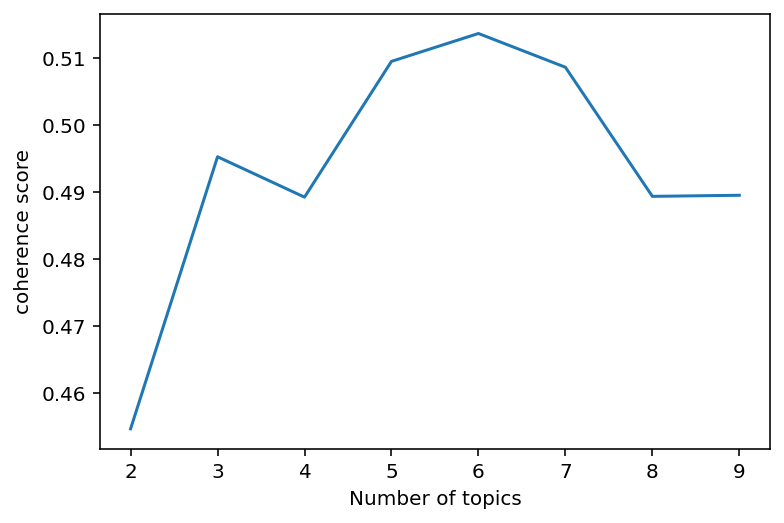

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=3, id2word = dictionary, random_state=100)

In [ ]:
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 3개  
 - 그래프 왼쪽에서 1부터 3까지의 토픽 확인 가능  
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 구성단어로 유추하여 토픽 설정  


 - 상위 5개 단어 확인
  - [1] : 있다, 좋다, 수, 사용, 이용
  - [2] : 있다, 좋다, 사용, 수, 서울
  - [3] : 있다, 많다, 사용, 이용, 수


 - 람다값 0.5일때 전반적으로 상위 단어가 비슷하여 0.3으로 낮추어 토픽 주제 도출
  - [1] : 차량 등록 시 자동 결제(파킹패스) 편의성 관련 만족 리뷰
  - [2] : 서울에서의 이용 편의성 및 저렴한 가격 관련 만족 리뷰
  - [3] : 고객센터 서비스 및 이벤트/할인 관련 만족 리뷰


### 2) 불만족 리뷰 (평점 2점 이하)

#### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] <= 2]['comment']

In [ ]:
all_review[:3]

0                                     아이디도 오류땜에 못찾는다네요
1    다운 받자마자 열려고하니 아예 그냥 꺼지는데요. 사용할수있게 해주셔야 써보고 리뷰를...
2    지난 3월인가? 개인정보, 위치 정보때문에 출차정보 기능 삭제되었네요. 혹시 개인정...
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

0                                       아이디도 오류땜에 못찾는다네요
1      다운 받자마자 열려고하니 아예 그냥 꺼지는데요 사용할수있게 해주셔야 써보고 리뷰를 ...
2      지난 3월인가 개인정보 위치 정보때문에 출차정보 기능 삭제되었네요 혹시 개인정보 유...
3      가입 알뜰폰은 가입조차 안됨 이라고 쓰려고 최근 리뷰 쭉 내려보는데 과거랑 최근 다...
4        알뜰폰 회원가입이 안됨 알뜰폰 선택하는데서 드롭다운바가 안사라져서 폰번호 입력이 안됨
                             ...                        
607                이런 걸 앱이라고 제발 능력 없으면 스타트업 하지 맙시다 부탁입니다
608    파킹패스해도 안되는 곳도 많고 감면조건 등록후에 저공해차량 할인되는곳에서 파킹패스로...
609                감면조건 등록했는데 적용도 안됨 감면 조건 되는 차량임에도 불구하고
611    아니 추천인 아이디가 없으면 회원가입이 안되는게어이가없네요 없으니깐 그냥 확인해서 ...
612    리뷰처음 차량등록 타이핑입력하면 조회안됨 사진찍어 등록하고 결제하려면 차량등록하시오...
Name: comment, Length: 132, dtype: object

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['아이디도 오류땜에 못찾는다네요',
 '다운 받자마자 열려고하니 아예 그냥 꺼지는데요 사용할수있게 해주셔야 써보고 리뷰를 남기죠 어플이 안열려요',
 '지난 3월인가 개인정보 위치 정보때문에 출차정보 기능 삭제되었네요 혹시 개인정보 유출된거 맞아요',
 '가입 알뜰폰은 가입조차 안됨 이라고 쓰려고 최근 리뷰 쭉 내려보는데 과거랑 최근 다 이소리밖에 없음',
 '알뜰폰 회원가입이 안됨 알뜰폰 선택하는데서 드롭다운바가 안사라져서 폰번호 입력이 안됨',
 '인터페이스보니 곧 망할듯 아이파킹 주차장 우후죽순 생겨나던데 아이파킹 앱 해서 정보만 다빼가고 ',
 '가입은 되게 해놓으셔야하는거 아닌가요 알뜰폰이라서 휴대폰 간편가입 못하길래',
 '자꾸 튕겨요 지우고 다운받아도 튕겨서  주차장 이용을 못하고있어요',
 '기존 차량을 중고차로 팔고 잊고있었는데 어제 주차결제가 되어서 앱 다시깔고 보니 기존차량 그대로 등록되어있네 앱 삭제시 꼭 정보삭제 하세요 돈만 날렸네요',
 '진짜 최악입니다 자동결제 설정한적 없는데 돈이 막 빠져나가네요']

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱"  
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은', '이', '것', '등', '더', '를', '좀', '즉', '인', '때', '거', '주차장', '주차', '어플', '앱']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['아이디', '오류', '땜'],
 ['다운', '려고', '아예', '그냥', '사용', '보고', '리뷰'],
 ['지난',
  '개인정보',
  '위치',
  '정보',
  '때문',
  '차',
  '정보',
  '기능',
  '삭제',
  '혹시',
  '개인정보',
  '유출',
  '된거'],
 ['가입', '알뜰폰', '가입', '안되다', '최근', '리뷰', '쭉', '과거', '최근', '이소리', '없다'],
 ['알뜰폰', '회원', '가입', '안되다', '알뜰폰', '선택', '드롭다운바', '폰', '번호', '입력', '안되다'],
 ['인터페이스', '곧', '망하다', '아이', '파킹', '우후죽순', '아이', '파킹', '정보'],
 ['가입', '야하다', '아니다', '알뜰폰', '휴대폰', '간편', '가입'],
 ['자꾸', '튕겨', '다운', '튕겨', '이용'],
 ['기존',
  '차량',
  '중고차',
  '팔고',
  '어제',
  '결제',
  '다시',
  '기존',
  '차량',
  '그대로',
  '등록',
  '삭제',
  '시',
  '꼭',
  '정보',
  '삭제',
  '돈'],
 ['진짜', '최악', '이다', '자동', '결제', '설정', '한적', '없다', '돈', '막']]

In [ ]:
dictionary = corpora.Dictionary(texts)   

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'땜': 0, '아이디': 1, '오류': 2, '그냥': 3, '다운': 4, '려고': 5, '리뷰': 6, '보고': 7, '사용': 8, '아예': 9, '개인정보': 10, '기능': 11, '된거': 12, '때문': 13, '삭제': 14, '위치': 15, '유출': 16, '정보': 17, '지난': 18, '차': 19, '혹시': 20, '가입': 21, '과거': 22, '안되다': 23, '알뜰폰': 24, '없다': 25, '이소리': 26, '쭉': 27, '최근': 28, '드롭다운바': 29, '번호': 30, '선택': 31, '입력': 32, '폰': 33, '회원': 34, '곧': 35, '망하다': 36, '아이': 37, '우후죽순': 38, '인터페이스': 39, '파킹': 40, '간편': 41, '아니다': 42, '야하다': 43, '휴대폰': 44, '이용': 45, '자꾸': 46, '튕겨': 47, '결제': 48, '그대로': 49, '기존': 50, '꼭': 51, '다시': 52, '돈': 53, '등록': 54, '시': 55, '어제': 56, '중고차': 57, '차량': 58, '팔고': 59, '막': 60, '설정': 61, '이다': 62, '자동': 63, '진짜': 64, '최악': 65, '한적': 66, '거지같다': 67, '공부': 68, '나쁘다': 69, '놈': 70, '누가': 71, '다짜고짜': 72, '대가리': 73, '문': 74, '어쩌': 75, '이렇다': 76, '있다': 77, '하든': 78, '할인': 79, '금액': 80, '어렵다': 81, '정상': 82, '개발자': 83, '누': 84, '많다': 85, '매끄럽다': 86, '뭐': 87, '진행': 88, '짜증나다': 89, '관련': 90, '다른': 91, '대해': 92, '데': 93, '동의': 94, '무책임하다': 95, '문의': 96, '얘기': 97, '요금': 9

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 1), (1, 1), (2, 1)],
 [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)],
 [(10, 2),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 2),
  (18, 1),
  (19, 1),
  (20, 1)],
 [(6, 1),
  (21, 2),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 2)],
 [(21, 1),
  (23, 2),
  (24, 2),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1)],
 [(17, 1), (35, 1), (36, 1), (37, 2), (38, 1), (39, 1), (40, 2)],
 [(21, 2), (24, 1), (41, 1), (42, 1), (43, 1), (44, 1)],
 [(4, 1), (45, 1), (46, 1), (47, 2)],
 [(14, 2),
  (17, 1),
  (48, 1),
  (49, 1),
  (50, 2),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 2),
  (59, 1)],
 [(25, 1),
  (48, 1),
  (53, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1)],
 [(48, 1),
  (63, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1)],


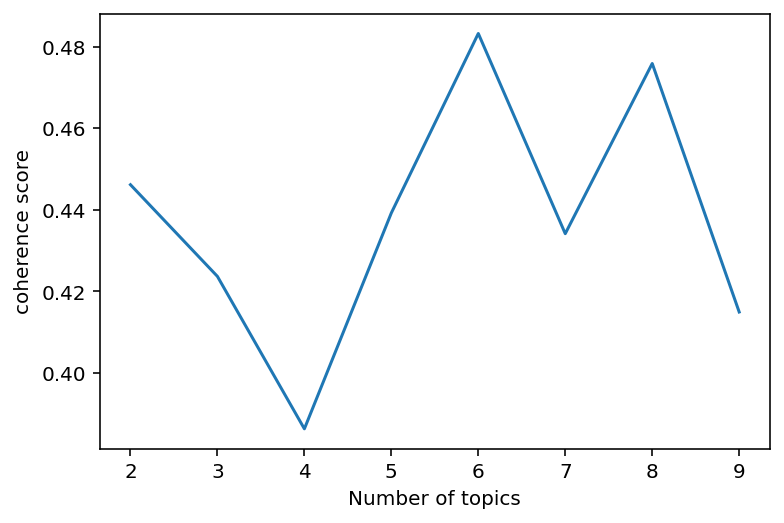

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=4, id2word = dictionary, random_state=100)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working



<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 4개  
 - 그래프 왼쪽에서 1부터 4까지의 토픽 확인 가능  
 - 4개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 세 부분으로 나뉨 [1,3] ,[2], [4]
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 구성단어로 유추하여 토픽 설정  

 
 - 상위 5개 단어 확인
  - [1] : 등록, 차량, 결제, 안되다, 파킹
  - [2] : 안되다, 결제, 있다, 구매, 정보
  - [3] : 안되다, 없다, 등록, 있다, 정기권
  - [4] : 안되다, 결제, 탈퇴, 있다, 오류


 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,3] : 차량 등록 오류 관련 불만족 리뷰
  - [2] : 구매 및 결제 오류 관련 불만족 리뷰
  - [4] : 앱 실행 오류 관련 불만족 리뷰

###3) 결론
- 만족 리뷰를 토픽모델링 한 결과 만족 원인은 크게 네가지로, 자동결제의 편의성, 서울지역에서 사용할 시의 편의성 및 경제성, 고객센터 서비스의 친절한 응대, 이벤트나 할인정보와 관련된 것임을 확인할 수 있다. 
- 불만족 리뷰를 토픽모델링 한 결과 불만족 원인을 크게 세가지로 나눌 수 있으며, 이는 차량 등록 오류, 구매 및 결제 오류, 앱 실행 오류에 관련한 것임을 확인할 수 있다.

##Ⅱ. 티맵 주차

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
df = pd.read_csv('tmap_review.csv')
df

###1) 만족 리뷰 (평점 5점)

#### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] == 5]['comment']

In [ ]:
all_review[:3]

0    월정기권 쓰는데 입출차마다 자꾸 미리 결제하라는 팝업이 떠서 깜짝깜짝 놀랍니다 수정...
5                                                감사합이다
7                 로 결제시 결제가 안됩니다 우선 너무 편하게 잘 사용하고 있습니다
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

0      월정기권 쓰는데 입출차마다 자꾸 미리 결제하라는 팝업이 떠서 깜짝깜짝 놀랍니다 수정...
5                                                  감사합이다
7                   로 결제시 결제가 안됩니다 우선 너무 편하게 잘 사용하고 있습니다
9                                                    편리함
16                                  티맵주차 너무 좋아요 너무 편리합니다
18     너무 편해요 자주가는 업체 미팅 갈때마다 너무 잘써요  좀 더 힘내서 여기저기서 사...
19                                  좋아요오오 편하게 이용하고 있습니다 
20     앱오류인지 자동결제가 되지 않아 신용카드로 요금을 결제했는데 계속 결제창이 떠 사용...
21                                                편하고좋아요
22     회사 근처에서 주차상품 구매하여 잘사용하고 있어요 덕분에 주차요금 걱정 없이 차타고...
26                                                  최태이1
27     좋은 서비스 저렴하고 편리하게 이용하고 있어서 너무 좋습니다 특히 1일권 사용이 많...
28                                                 아주좋아요
32                                도시슬로건 이름좀넣어주새요 어디가 어딘지
33                               잘 이용하고 있습니다 티멤버쉽 할인도 되고
34           티멤버쉽 할인되서 잘쓰고있어용 주차장은 점점 많아지겠지용 잘쓰고 있다 이거에용
35                                                알아서 척척
36                             

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['월정기권 쓰는데 입출차마다 자꾸 미리 결제하라는 팝업이 떠서 깜짝깜짝 놀랍니다 수정좀 해주세요',
 '감사합이다',
 '  로 결제시 결제가 안됩니다 우선 너무 편하게 잘 사용하고 있습니다',
 '편리함',
 '티맵주차 너무 좋아요 너무 편리합니다',
 '너무 편해요 자주가는 업체 미팅 갈때마다 너무 잘써요  좀 더 힘내서 여기저기서 사용하게 해주세용 ',
 '좋아요오오 편하게 이용하고 있습니다 ',
 '앱오류인지 자동결제가 되지 않아 신용카드로 요금을 결제했는데 계속 결제창이 떠 사용할 수가 없습니다 결제창을 닫으면 앱도 닫혀 온라인 상담도 불가능합니다 조치 좀 해주세요',
 '편하고좋아요',
 '회사 근처에서 주차상품 구매하여 잘사용하고 있어요 덕분에 주차요금 걱정 없이 차타고 다녀요 ']

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱 티맵"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어제거/ 어플 이름 관련 단어 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은',
 '이',
 '것',
 '등',
 '더',
 '를',
 '좀',
 '즉',
 '인',
 '때',
 '거',
 '주차장',
 '주차',
 '어플',
 '앱',
 '티맵']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['월', '정기권', '입출', '차마', '자꾸', '미리', '결제', '팝업', '수정'],
 ['로', '결제', '시', '결제', '안되다', '우선', '편하다', '사용', '있다'],
 ['편리하다'],
 ['좋다', '편리하다'],
 ['편하다', '자주', '업체', '미팅', '여기저기', '사용'],
 ['좋다', '오오', '편하다', '이용', '있다'],
 ['오류',
  '자동',
  '결제',
  '신용카드',
  '요금',
  '결제',
  '계속',
  '결제',
  '창',
  '사용',
  '수가',
  '없다',
  '결제',
  '창',
  '온라인',
  '상담',
  '불가능하다',
  '조치'],
 ['편하다', '좋다'],
 ['회사', '근처', '상품', '구매', '사용', '있다', '덕분', '요금', '걱정', '차', '타고'],
 ['최태']]

In [ ]:
dictionary = corpora.Dictionary(texts) 

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'결제': 0, '미리': 1, '수정': 2, '월': 3, '입출': 4, '자꾸': 5, '정기권': 6, '차마': 7, '팝업': 8, '로': 9, '사용': 10, '시': 11, '안되다': 12, '우선': 13, '있다': 14, '편하다': 15, '편리하다': 16, '좋다': 17, '미팅': 18, '업체': 19, '여기저기': 20, '자주': 21, '오오': 22, '이용': 23, '계속': 24, '불가능하다': 25, '상담': 26, '수가': 27, '신용카드': 28, '없다': 29, '오류': 30, '온라인': 31, '요금': 32, '자동': 33, '조치': 34, '창': 35, '걱정': 36, '구매': 37, '근처': 38, '덕분': 39, '상품': 40, '차': 41, '타고': 42, '회사': 43, '최태': 44, '경우': 45, '다만': 46, '도움': 47, '등록': 48, '만족': 49, '많다': 50, '부득이': 51, '부탁드리다': 52, '서비스': 53, '임시': 54, '저렴하다': 55, '지원': 56, '차량': 57, '아주': 58, '도시': 59, '새': 60, '슬로건': 61, '어디': 62, '어디가': 63, '이름': 64, '멤버': 65, '티': 66, '할인': 67, '용': 68, '점점': 69, '척척': 70, '결재': 71, '차비': 72, '다드': 73, '스텐': 74, '굳다': 75, '어렵다': 76, '요': 77, '같다': 78, '유용하다': 79, '깔끔하다': 80, '주변': 81, '지역': 82, '직접': 83, '표시': 84, '쿠폰': 85, '공영': 86, '공해': 87, '관련': 88, '신세계': 89, '이다': 90, '가기': 91, '강조': 92, '길': 93, '란': 94, '민': 95, '비': 96, '설정': 97, '스쿨존': 98, '시스

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1)],
 [(0, 2), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1)],
 [(16, 1)],
 [(16, 1), (17, 1)],
 [(10, 1), (15, 1), (18, 1), (19, 1), (20, 1), (21, 1)],
 [(14, 1), (15, 1), (17, 1), (22, 1), (23, 1)],
 [(0, 4),
  (10, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 2)],
 [(15, 1), (17, 1)],
 [(10, 1),
  (14, 1),
  (32, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1)],
 [(44, 1)],
 [(10, 2),
  (14, 3),
  (16, 1),
  (17, 2),
  (23, 2),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 2),
  (55, 1),
  (56, 1),
  (57, 2)],
 [(17, 1), (58, 1)],
 [(59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1)],
 [(14, 1), (23, 1), (65, 1), (66, 1), (67, 1)],
 [(14, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1)],
 [(70, 1)],
 [(15, 1), 

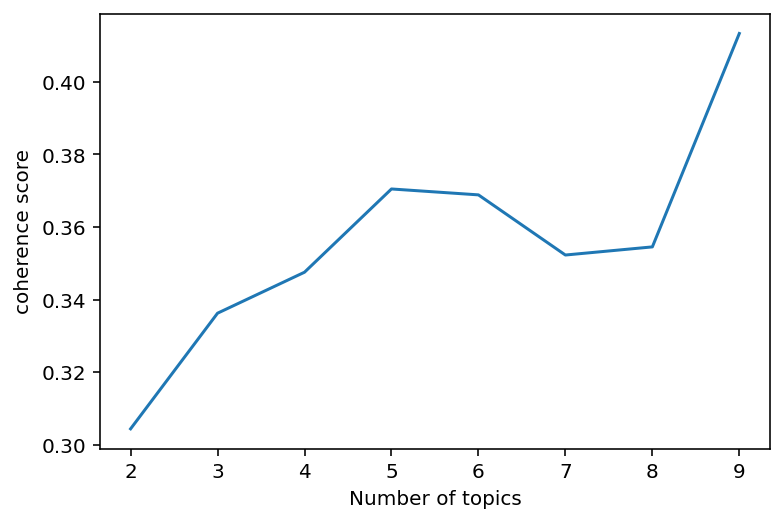

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=6, id2word = dictionary, random_state=100)

In [ ]:
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 6개  
 - 그래프 왼쪽에서 1부터 6까지의 토픽 확인 가능  
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 6개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 세 부분으로 나뉨 [1], [2,4,5,6], [3]
 - 내용 확인 결과 1번 토픽도 2,4,5,6과 유의미한 차이가 보이지 않아 두 부분으로 다시 나눔 [1,2,4,5,6], [3]
 - 만족 리뷰의 갯수가 36개로 아주 적은 수준


 - 상위 5개 단어 확인
  - [1] : 편하다, 사용, 좋다, 스쿨존, 같다
  - [2] : 편리하다, 차량, 결재, 좋다, 있다
  - [3] : 결제, 티, 멤버, 할인, 창
  - [4] : 좋다, 편하다, 있다, 사용, 이용
  - [5] : 좋다, 있다, 편하다, 편리하다, 이용
  - [6] : 좋다, 있다, 사용, 편리하다, 이용
  

 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,2,4,5,6] : 사용 및 결제의 편리, 편의성 관련 만족 리뷰
  - [3] : 결제시 티멤버십 할인 관련 만족 리뷰


###2) 불만족 리뷰 (평점 2점 이하)

##### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] <= 2]['comment']

In [ ]:
all_review[:3]

1                                                   무쓸
2    현대신용카드 결제에러 그리고 대책없음 원래 자동계산 되는 카드가 해지되서 미납요금 ...
3    중복 요금청구되는 쓰레기같은 티맵주차입니다. 사전정산을 입구에서만하라뇨? 10분후나...
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

1                                                     무쓸
2      현대신용카드 결제에러 그리고 대책없음 원래 자동계산 되는 카드가 해지되서 미납요금 ...
3      중복 요금청구되는 쓰레기같은 티맵주차입니다 사전정산을 입구에서만하라뇨 10분후나 2...
6      이게 멉니까 파인애비뉴 주차권 결제하고 출차시 결제하는데 결제창 먹통 결국 9000...
8      이거 처리좀 해주세요 저는 카카오 주차 어플을 이용해서 결제하고 출차를 했는데 티맵...
                             ...                        
107                                    환불요청 잘못 받았습니다환불요청
109             고객센터도 갖추어져있지 않음 식당에서 주차권 받아나왔는데 결제됨 어이없음
110    로그인이 오래 걸리는 앱 로그인 아이디 4자 이상 넣으면 키보드가 내려가서 다시 클...
111    앱을 이용하고 싶어도 이용 가능한 곳이 없네요 그리고 리뷰를 작성했었는데 왜 지워져...
112                              역시 아직은 고객에대한 서비스는 엉망이네요
Name: comment, Length: 65, dtype: object

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['무쓸',
 '현대신용카드 결제에러 그리고 대책없음 원래 자동계산 되는 카드가 해지되서 미납요금 발생했는데 그래서 새로운 카드 정보 등록함',
 '중복 요금청구되는 쓰레기같은 티맵주차입니다 사전정산을 입구에서만하라뇨 10분후나 24시간이나 동일한 요금인 주차장이 사전결제하니까 출차할때 또 요금 청구하네요 이용안합니다',
 '이게 멉니까 파인애비뉴 주차권 결제하고 출차시 결제하는데 결제창 먹통 결국 90000원 내고 출차연락할데도 없고 이게 무슨 운영방침인지 정말 이런식으로 하면 안되는거 아닌가요 대책없이 이런운영이 맞나요',
 '이거 처리좀 해주세요 저는 카카오 주차 어플을 이용해서 결제하고 출차를 했는데 티맵주차 어플에서 저한테 과금이 되었습니다 티맵 어플 들어가면 미납금액부터 결제하라고 뜨네요 저는 분명 카카오 어플로 주차금액 결제하고 출차를 했습니다 이렇게 되면 이중과금 아닌가요 이거 처리좀 빨리 해주세요',
 '결제방법을 도저히 모르겠습니다',
 '정말 사용하면 안되는 어플 입니다 오프라인으로 받은 주차권 처리가 안됩니다 출차하면서 가게에서 받은 주차권을 사용을 하려고 하는데 자동으로 결제 된것 처럼 차단기가 올라 가면서 오프라아 결제 장치에서 결제창이 안뜹니다 그러면서 어플 상에는 주차중으로 뜨면서 비용을 올라가고 있습니다 그래서 우선 어플로 결제를 하였습니다 참고로 자동 결제 기능도 안쓰고 결제 방식도 등록하지 않았습니다 관련해서 온라인 상담으로 상황을 물어 보면 로그가없다 확인이 안된다면서 기계가 하는 말만 합니다 고객 관리 직원이 없는것 같습니다 그리고 결제 후에도 한시간 마다 계속 주차 중이라는 알람이 떠서 알람 기능 자체를 껐습니다 돈벌고 싶어서 강제 거래를 만드는 어플입니다',
 '카드결재가 계속 에러떠요 200원 미정산 되어서 결재를 하려고 해도 계속 에러뜨고',
 '미납이라고 떠서 미납이라고 떠서 결제 할려고 카드번호만 수십번 쳐도 안되고 고객센터 눌러서 온라인 상담받으라고도 되어있길래 들어갈려니 계속 미납창이 나와서 뭘 누를수가 없네

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱 티맵"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어제거/ 어플 이름 관련 단어 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은',
 '이',
 '것',
 '등',
 '더',
 '를',
 '좀',
 '즉',
 '인',
 '때',
 '거',
 '주차장',
 '주차',
 '어플',
 '앱',
 '티맵']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['무'],
 ['현대',
  '신용카드',
  '결제',
  '에러',
  '대책',
  '없다',
  '원래',
  '자동',
  '계산',
  '카드',
  '해지',
  '미납',
  '요금',
  '발생',
  '새롭다',
  '카드',
  '정보',
  '등록',
  '함'],
 ['중복',
  '요금',
  '청구',
  '쓰레기',
  '같다',
  '이다',
  '정산',
  '입구',
  '하라',
  '뇨',
  '동일하다',
  '요금',
  '결제',
  '차',
  '또',
  '요금',
  '청구',
  '이용'],
 ['멉',
  '애비뉴',
  '결제',
  '결제',
  '결제',
  '창',
  '먹통',
  '차',
  '연락',
  '없다',
  '무슨',
  '운영',
  '방침',
  '정말',
  '식',
  '안되다',
  '아니다',
  '대책',
  '운영'],
 ['처리',
  '저',
  '카카오',
  '이용',
  '결제',
  '차',
  '저',
  '과금',
  '미납',
  '금액',
  '결제',
  '저',
  '분명',
  '카카오',
  '금액',
  '결제',
  '차',
  '이중',
  '과금',
  '아니다',
  '처리'],
 ['결제', '방법', '도저히'],
 ['정말',
  '사용',
  '안되다',
  '이다',
  '오프라인',
  '처리',
  '안되다',
  '가게',
  '사용',
  '자동',
  '결제',
  '처럼',
  '차단기',
  '가면',
  '오프라',
  '결제',
  '장치',
  '결제',
  '창',
  '그렇다',
  '상',
  '비용',
  '있다',
  '우선',
  '결제',
  '참고',
  '자동',
  '결제',
  '기능',
  '결제',
  '방식',
  '등록',
  '관련',
  '온라인',
  '상담',
  '상황',
  '물어',
  '로그',
  '없다',
  '확인',
  '안되다',
  '기계',
  '말',
 

In [ ]:
dictionary = corpora.Dictionary(texts)  

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'무': 0, '결제': 1, '계산': 2, '대책': 3, '등록': 4, '미납': 5, '발생': 6, '새롭다': 7, '신용카드': 8, '없다': 9, '에러': 10, '요금': 11, '원래': 12, '자동': 13, '정보': 14, '카드': 15, '함': 16, '해지': 17, '현대': 18, '같다': 19, '뇨': 20, '동일하다': 21, '또': 22, '쓰레기': 23, '이다': 24, '이용': 25, '입구': 26, '정산': 27, '중복': 28, '차': 29, '청구': 30, '하라': 31, '먹통': 32, '멉': 33, '무슨': 34, '방침': 35, '식': 36, '아니다': 37, '안되다': 38, '애비뉴': 39, '연락': 40, '운영': 41, '정말': 42, '창': 43, '과금': 44, '금액': 45, '분명': 46, '이중': 47, '저': 48, '처리': 49, '카카오': 50, '도저히': 51, '방법': 52, '가게': 53, '가면': 54, '강제': 55, '거래': 56, '계속': 57, '고객': 58, '관련': 59, '관리': 60, '그렇다': 61, '기계': 62, '기능': 63, '돈': 64, '로그': 65, '마다': 66, '말': 67, '물어': 68, '방식': 69, '비용': 70, '사용': 71, '상': 72, '상담': 73, '상황': 74, '시간': 75, '알람': 76, '오프라': 77, '오프라인': 78, '온라인': 79, '우선': 80, '있다': 81, '자체': 82, '장치': 83, '중이': 84, '직원': 85, '차단기': 86, '참고': 87, '처럼': 88, '확인': 89, '후': 90, '결재': 91, '미정': 92, '산': 93, '해도': 94, '다시': 95, '뭘': 96, '번': 97, '번호': 98, '센터': 99, '심지어': 1

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 1)],
 [(1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 2),
  (16, 1),
  (17, 1),
  (18, 1)],
 [(1, 1),
  (11, 3),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 2),
  (31, 1)],
 [(1, 3),
  (3, 1),
  (9, 1),
  (29, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 2),
  (42, 1),
  (43, 1)],
 [(1, 3),
  (5, 1),
  (25, 1),
  (29, 2),
  (37, 1),
  (44, 2),
  (45, 2),
  (46, 1),
  (47, 1),
  (48, 3),
  (49, 2),
  (50, 2)],
 [(1, 1), (51, 1), (52, 1)],
 [(1, 7),
  (4, 1),
  (9, 2),
  (13, 2),
  (19, 1),
  (24, 2),
  (38, 3),
  (42, 1),
  (43, 1),
  (49, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 2),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70,

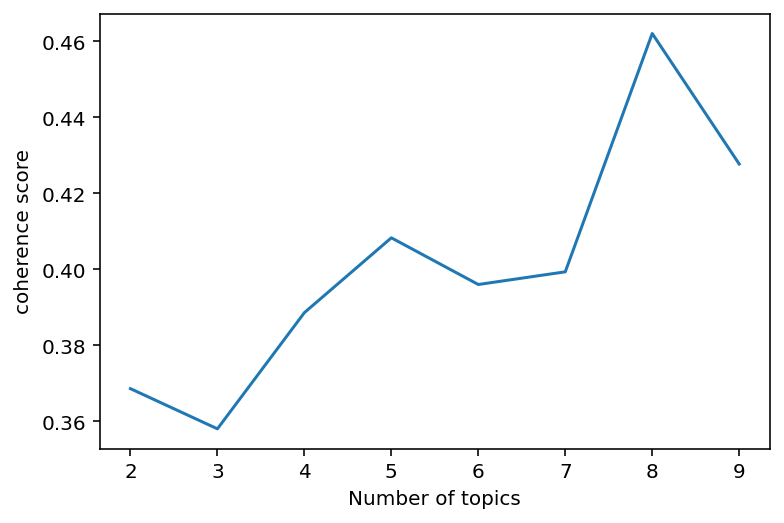

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=5, id2word = dictionary, random_state=100)

In [ ]:
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 5개  
 - 그래프 왼쪽에서 1부터 5까지의 토픽 확인 가능  
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 5개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 세 부분으로 나뉨 [1,4,5], [2], [3]


 - 상위 5개 단어 확인
  - [1] : 없다, 결제, 있다, 안되다, 계속
  - [2] : 안되다, 결제, 로그인, 없다, 요금
  - [3] : 구매, 있다, 환불, 할인, 차비
  - [4] : 결제, 별로, 다시, 차량, 정액
  - [5] : 안되다, 아니다, 저, 카카오, 과금 


 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,4,5] : 앱의 여러가지 오류 관련 불만족 리뷰
  - [2] : 결제 관련 불만족 리뷰
  - [3] : 구매 후 환불 요청 관련 불만족 리뷰

###3) 결론
- 만족 리뷰를 토픽모델링 한 결과 만족 원인은 크게 두 가지로, 사용 및 결제의 편리성과 티멤버십 할인과 관련된 것임을 확인할 수 있다.
- 불만족 리뷰를 토픽모델링 한 결과 불만족 원인은 크게 세 가지로, 앱의 오류, 결제 문제, 구매 후 환불과 관련된 것임을 확인할 수 있다.

##Ⅲ. 파킹프렌즈

In [ ]:
df = pd.read_csv('parkingfriends_review.csv')
df

### 1) 만족 리뷰 (평점 5점)

#### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] == 5]['comment']

In [ ]:
all_review[:3]

10           부정주차 단속 안하는 듯 예약시간 30분 넘어서까지 다른 차가 주차해놨었음
28                                         장기 주차 할수있나요
45    주차 장에 대한 고민을 들어주어서 넘 좋아요. 좀 더 많은 면수를 확보하면 좋겠습니다.
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

10             부정주차 단속 안하는 듯 예약시간 30분 넘어서까지 다른 차가 주차해놨었음
28                                           장기 주차 할수있나요
45        주차 장에 대한 고민을 들어주어서 넘 좋아요 좀 더 많은 면수를 확보하면 좋겠습니다
53     다른 주차앱보다 화면이 어지럽지 않아서 좋았어요 다만 제가 사용할 수 있는 주차장이...
55              거주자 우선 주차구역을 공유주차면으로 하고싶은데 어디서 신청을 해야하나요
56                                    관리하시는분도 친절하구 앱도조아요
65                       파킹프렌즈를 만나고 주차가 쉬어졌어요 강추합니다 0네이버
66            가격도 저렴한곳이 많네요 만족합니다 좋은 주차문화 선두해주세요 1052네이버
67           파킹프렌즈 좋네요 주차가 항상 신경쓰이는데 덕분에 쉬어졌어요 감사합니다 화이팅
68     파킹프렌즈로 주차걱정 한던 제가 달라졌어요 운전시 주차가 항상 문제였는데 파킹프렌즈...
69                             파킹프렌즈로 주차가 쉬워지고 좋네요 감사합니다
70     파킹프렌즈 덕분에 주차걱정 한시름 놓았답니다 너무 유용한 어플 주차고민 하시는 분들...
71                                파킹프렌즈로 주차고민해결되네요 최고입니다
73     할인차량 설정 가능한가요 공영 주차장이나 공항엔 저공해 차량은 할인이 들어가자나요 ...
74     주차장 검색이 좋네요 외출할때마다 미리 찾아보고 가긴 하는데 유용한 앱이 나와서 너...
83                                                   좋아요
84           겁나 편해요 시내에 차 가지고 나가기 부담 스러웠는데 이 앱 쓰고 편해 졌어요
85     주차비 절약하고 좋아요 예전부터 파킹프렌즈 

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['부정주차 단속 안하는 듯 예약시간 30분 넘어서까지 다른 차가 주차해놨었음',
 '장기 주차 할수있나요',
 '주차 장에 대한 고민을 들어주어서 넘 좋아요 좀 더 많은 면수를 확보하면 좋겠습니다',
 '다른 주차앱보다 화면이 어지럽지 않아서 좋았어요 다만 제가 사용할 수 있는 주차장이 있는 지역이 더 많이 생겼으면 좋겠습니다 ',
 '거주자 우선 주차구역을 공유주차면으로 하고싶은데 어디서 신청을 해야하나요',
 '관리하시는분도 친절하구 앱도조아요',
 '파킹프렌즈를 만나고 주차가 쉬어졌어요 강추합니다 0네이버',
 '가격도 저렴한곳이 많네요 만족합니다 좋은 주차문화 선두해주세요 1052네이버',
 '파킹프렌즈 좋네요 주차가 항상 신경쓰이는데 덕분에 쉬어졌어요 감사합니다 화이팅',
 '파킹프렌즈로 주차걱정 한던 제가 달라졌어요 운전시 주차가 항상 문제였는데 파킹프렌즈를 만나고 바뀌게 되었네요 너무 유용한 어플 주차고민 하시는 분들은 꼭 설치하세요 새로운 주차문화를 선두하는 파킹프렌즈를 응원합니다']

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱 파킹 프렌즈"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어제거/ 어플 이름 관련 단어 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은',
 '이',
 '것',
 '등',
 '더',
 '를',
 '좀',
 '즉',
 '인',
 '때',
 '거',
 '주차장',
 '주차',
 '어플',
 '앱',
 '파킹',
 '프렌즈']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['부정', '단속', '듯', '예약', '시간', '다른', '차갑다'],
 ['장기'],
 ['장', '대한', '고민', '좋다', '많다', '면수', '확보', '좋다'],
 ['다른', '화면', '어지럽다', '좋다', '다만', '제', '사용', '수', '있다', '있다', '지역', '좋다'],
 ['거주', '우선', '구역', '유주', '신청'],
 ['관리', '분도', '친절하다', '좋다'],
 ['강', '추하다', '네이버'],
 ['가격', '저렴하다', '곳', '많다', '만족하다', '좋다', '문화', '선두', '네이버'],
 ['좋다', '항상', '신경', '덕분', '화이팅'],
 ['걱정',
  '던',
  '제',
  '운',
  '전시',
  '항상',
  '문제',
  '유용하다',
  '고민',
  '분',
  '꼭',
  '설치',
  '새롭다',
  '문화',
  '선두',
  '응원']]

In [ ]:
dictionary = corpora.Dictionary(texts)   

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'다른': 0, '단속': 1, '듯': 2, '부정': 3, '시간': 4, '예약': 5, '차갑다': 6, '장기': 7, '고민': 8, '대한': 9, '많다': 10, '면수': 11, '장': 12, '좋다': 13, '확보': 14, '다만': 15, '사용': 16, '수': 17, '어지럽다': 18, '있다': 19, '제': 20, '지역': 21, '화면': 22, '거주': 23, '구역': 24, '신청': 25, '우선': 26, '유주': 27, '관리': 28, '분도': 29, '친절하다': 30, '강': 31, '네이버': 32, '추하다': 33, '가격': 34, '곳': 35, '만족하다': 36, '문화': 37, '선두': 38, '저렴하다': 39, '덕분': 40, '신경': 41, '항상': 42, '화이팅': 43, '걱정': 44, '꼭': 45, '던': 46, '문제': 47, '분': 48, '새롭다': 49, '설치': 50, '운': 51, '유용하다': 52, '응원': 53, '전시': 54, '쉽다': 55, '한시름': 56, '이다': 57, '최고': 58, '해결': 59, '가능하다': 60, '공영': 61, '공항': 62, '공해': 63, '설정': 64, '차량': 65, '할인': 66, '검색': 67, '미리': 68, '외출': 69, '가지': 70, '부담': 71, '스럽다': 72, '시내': 73, '차': 74, '편하다': 75, '같다': 76, '고': 77, '기능': 78, '리뉴': 79, '모레': 80, '비도': 81, '실시간': 82, '예전': 83, '유저': 84, '이벤트': 85, '이용': 86, '자주': 87, '절약': 88, '정말': 89, '차비': 90, '최곤거': 91, '편리하다': 92, '편이': 93, '확인': 94, '흥': 95, '막': 96, '어디가': 97, '걸': 98, '고맙다': 9

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1)],
 [(7, 1)],
 [(8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 2), (14, 1)],
 [(0, 1),
  (13, 2),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 2),
  (20, 1),
  (21, 1),
  (22, 1)],
 [(23, 1), (24, 1), (25, 1), (26, 1), (27, 1)],
 [(13, 1), (28, 1), (29, 1), (30, 1)],
 [(31, 1), (32, 1), (33, 1)],
 [(10, 1),
  (13, 1),
  (32, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1)],
 [(13, 1), (40, 1), (41, 1), (42, 1), (43, 1)],
 [(8, 1),
  (20, 1),
  (37, 1),
  (38, 1),
  (42, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1)],
 [(13, 1), (55, 1)],
 [(8, 1),
  (13, 1),
  (40, 1),
  (44, 1),
  (45, 1),
  (48, 1),
  (50, 1),
  (52, 1),
  (56, 1)],
 [(8, 1), (57, 1), (58, 1), (59, 1)],
 [(60, 2), (61, 1), (62, 1), (63, 1), (64, 2), (65, 2), (66, 2)],
 [(13, 2), (52, 1), (67, 1), (68, 1), (69, 1)],
 [(13, 1)],
 [(70, 1), (71, 1), (72, 1), (7

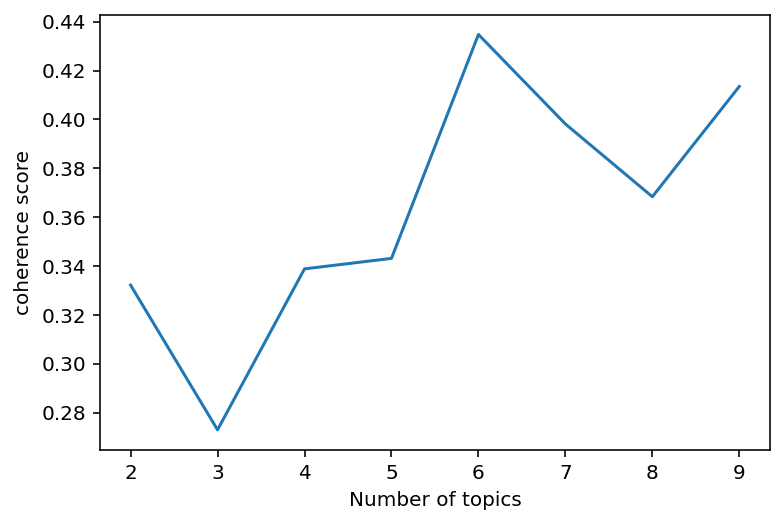

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=6, id2word = dictionary, random_state=100)

In [ ]:
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 6개  
 - 그래프 왼쪽에서 1부터 6까지의 토픽 확인 가능  
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 6개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 세 부분으로 나뉨 [1,2,4,6], [5], [3]


 - 상위 5개 단어 확인
  - [1] : 좋다, 많다, 이용, 예약, 있다 
  - [2] : 좋다, 있다, 이다, 유용하다, 예약 
  - [4] : 좋다, 있다, 수, 편리하다, 서울 
  - [6] : 이다, 쉽다, 찾기, 최강, 애용 
  - [5] : 편하다, 가능하다, 할인, 설정, 차량 
  - [3] : 사용, 같다, 고맙다, 부분, 포인트



 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,2,4,6] : 예약기능의 유용성 및 서울지역 편리성, 사용 용이성
  - [5] : 할인 설정 용이성
  - [3] : 포인트 관련 고객 응대 관련

  (* [5]의 경우는 단어 빈도 횟수가 너무 낮아 일반화하기에는 무리가 있을것으로 판단하여 결론에서 제외)

###2) 불만족 리뷰 (평점 2점 이하)

#### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] <= 2]['comment']

In [ ]:
all_review[:3]

0    공용주차장 자리 임대하시는건지는 모르겠는데 관리 좀 했으면 하네요 매번 예약하고 가...
1    개똥같은 앱!!! 별 하나도 주기 아까워!! 결제할려고 하는데 안되고! 터치도 안되...
2    가입하려할때 오류가 있습니다 가입버튼이 가상 키보드에 가려서 다음 클릭 하기가 힘들...
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

0      공용주차장 자리 임대하시는건지는 모르겠는데 관리 좀 했으면 하네요 매번 예약하고 가...
1      개똥같은 앱 별 하나도 주기 아까워 결제할려고 하는데 안되고 터치도 안되고 전화도 ...
2      가입하려할때 오류가 있습니다 가입버튼이 가상 키보드에 가려서 다음 클릭 하기가 힘들...
3                        열리지도 않는 앱은 누구 쓰라고 만든건지 시간만 버렸네요
4                                            앱이 열려야 뭘 하지
                             ...                        
121                        차종 선택 차종선택하는 부분에서 포드 차종이 없습니다
122                   하루종일 알람 받아야 하나요 이미 제 차는 주차해놓은 상태인데
124     앱을 지우던가 버튼도 제대로 안눌리고 선택사항 메일주소 공개안했더니 로그인도 안되...
128             카카오 로그인이 안돼요 카카오 로그인이 안됩니다 그래서 앱을 쓸수가없네요
130    앱을통해서 주차할수 있는건 좋은데 자꾸 멈추고 꺼지고 답답해요 이거 사용하려면 몇십...
Name: comment, Length: 80, dtype: object

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['공용주차장 자리 임대하시는건지는 모르겠는데 관리 좀 했으면 하네요 매번 예약하고 가는데도 한시간 번호도 없는 차량들 때문에 불법주정차신고하고 1시간 이상씩 기다리고 돈 내고 뭐하는건지 짜증나네요 국가유공자라 공용주차장 할인 되는데 이건 할인도 없고 돈내고 한시간씩 날려먹고 6시되면 칼퇴에 어디서 운영하는지는 몰라도 관리 좀 잘했으면 좋겠네요',
 '개똥같은 앱 별 하나도 주기 아까워 결제할려고 하는데 안되고 터치도 안되고 전화도 안되고 시간만 날렸어',
 '가입하려할때 오류가 있습니다 가입버튼이 가상 키보드에 가려서 다음 클릭 하기가 힘들고 핸드폰 인증번호 누르고 다음으로 넘어가면 정보 입력 칸이 보였다가 순식간에 사라져서 입력을 할수가 없습니다 그냥 하얀백지로 변하고 더이상 가입 진행이 불가합니다 오류 확인부탁드려요',
 '열리지도 않는 앱은 누구 쓰라고 만든건지 시간만 버렸네요',
 '앱이 열려야 뭘 하지',
 '노트20울트라 사용자로서 왠만하면 버벅거리는 앱이 없을 것이라 생각했는데 이 앱은 도대체 실제 사용하라고 만든 앱인지 의문이 들 정도로 버벅거리네요 광고나 가입에 관한 것은 멀쩡하게 작동하는데 실제 주차 예약하려면 도통 진행이 안됩니다 검색도 주차장 선택도 혹시 유선으로 인터넷 연결된 튜닝된 폰만 사용하라고 만든 앱인지요',
 '앱로딩이 안되서 사용이안됨',
 '실행이 안됨 어플 실행 자체가 안됨',
 '별루',
 '앱 먹통 한시간째 왜 이러는 거죠 빨리 예약해야하는데']

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱 파킹 프렌즈"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어제거/ 어플 이름 관련 단어 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은',
 '이',
 '것',
 '등',
 '더',
 '를',
 '좀',
 '즉',
 '인',
 '때',
 '거',
 '주차장',
 '주차',
 '어플',
 '앱',
 '파킹',
 '프렌즈']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['공용',
  '자리',
  '임대',
  '관리',
  '매번',
  '예약',
  '시간',
  '번호',
  '없다',
  '차량',
  '때문',
  '불법',
  '정차',
  '신고',
  '이상',
  '돈',
  '뭐',
  '짜증나다',
  '국가',
  '유공',
  '자라',
  '공용',
  '할인',
  '할인',
  '없다',
  '돈',
  '시간',
  '칼퇴',
  '운영',
  '관리',
  '좋다'],
 ['개똥',
  '같다',
  '별',
  '하나',
  '주기',
  '아깝다',
  '결제',
  '안되다',
  '터치',
  '안되다',
  '전화',
  '안되다',
  '시간'],
 ['가입',
  '오류',
  '있다',
  '가입',
  '버튼',
  '가상',
  '키',
  '보드',
  '다음',
  '클릭',
  '힘들다',
  '핸드폰',
  '인증',
  '번호',
  '다음',
  '정보',
  '입력',
  '칸',
  '순식간',
  '입력',
  '없다',
  '그냥',
  '하얗다',
  '백지',
  '변하다',
  '이상',
  '가입',
  '진행',
  '불가하다',
  '오류',
  '확인',
  '부탁드리다'],
 ['누구', '시간'],
 ['뭘'],
 ['노트',
  '울트라',
  '사용자',
  '로서',
  '왠만하다',
  '버벅거리',
  '없다',
  '생각',
  '도대체',
  '실제',
  '사용',
  '의문',
  '정도',
  '버벅',
  '거리',
  '광고',
  '가입',
  '관',
  '멀쩡하다',
  '작동',
  '실제',
  '예약',
  '도통',
  '진행',
  '안되다',
  '검색',
  '선택',
  '혹시',
  '유선',
  '인터넷',
  '연결',
  '튜닝된',
  '폰',
  '사용',
  '인지'],
 ['로딩', '안되다', '사용', '안되다'],
 ['실행', '안되다', '실행', '자체', '안되다'],
 

In [ ]:
dictionary = corpora.Dictionary(texts) 

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'공용': 0, '관리': 1, '국가': 2, '돈': 3, '때문': 4, '매번': 5, '뭐': 6, '번호': 7, '불법': 8, '시간': 9, '신고': 10, '없다': 11, '예약': 12, '운영': 13, '유공': 14, '이상': 15, '임대': 16, '자라': 17, '자리': 18, '정차': 19, '좋다': 20, '짜증나다': 21, '차량': 22, '칼퇴': 23, '할인': 24, '같다': 25, '개똥': 26, '결제': 27, '별': 28, '아깝다': 29, '안되다': 30, '전화': 31, '주기': 32, '터치': 33, '하나': 34, '가상': 35, '가입': 36, '그냥': 37, '다음': 38, '백지': 39, '버튼': 40, '변하다': 41, '보드': 42, '부탁드리다': 43, '불가하다': 44, '순식간': 45, '오류': 46, '인증': 47, '입력': 48, '있다': 49, '정보': 50, '진행': 51, '칸': 52, '클릭': 53, '키': 54, '하얗다': 55, '핸드폰': 56, '확인': 57, '힘들다': 58, '누구': 59, '뭘': 60, '거리': 61, '검색': 62, '관': 63, '광고': 64, '노트': 65, '도대체': 66, '도통': 67, '로서': 68, '멀쩡하다': 69, '버벅': 70, '버벅거리': 71, '사용': 72, '사용자': 73, '생각': 74, '선택': 75, '실제': 76, '연결': 77, '왠만하다': 78, '울트라': 79, '유선': 80, '의문': 81, '인지': 82, '인터넷': 83, '작동': 84, '정도': 85, '튜닝된': 86, '폰': 87, '혹시': 88, '로딩': 89, '실행': 90, '자체': 91, '별루': 92, '먹통': 93, '왜': 94, '도': 95, '움': 96, '경쟁': 97, '사': 98, '소리': 

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 2),
  (1, 2),
  (2, 1),
  (3, 2),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 2),
  (10, 1),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 2)],
 [(9, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 3),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1)],
 [(7, 1),
  (11, 1),
  (15, 1),
  (35, 1),
  (36, 3),
  (37, 1),
  (38, 2),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 2),
  (47, 1),
  (48, 2),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1)],
 [(9, 1), (59, 1)],
 [(60, 1)],
 [(11, 1),
  (12, 1),
  (30, 1),
  (36, 1),
  (51, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 2),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 2),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1)

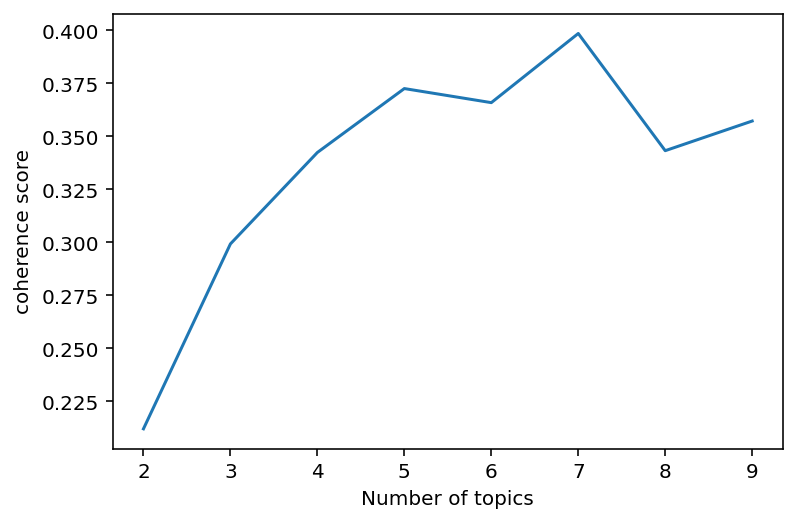

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=7, id2word = dictionary, random_state=100)

In [ ]:
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 7개  
 - 그래프 왼쪽에서 1부터 7까지의 토픽 확인 가능  
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 7개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 네 부분으로 나뉨 [1,4,3,5], [2], [6], [7]


 - 상위 5개 단어 확인
  - [1] : 없다, 안되다, 가입, 선택, 입력, 번호 (회원가입시 오류)
  - [4] : 안되다, 가입, 없다, 실행, 로그인 (앱 실행 및 로그인시 오류)
  - [3] : 시간, 이용, 위치, 이다, 번호, 회원 (이용 관련)
  - [5] : 시간, 안되다, 가능하다, 오류, 환불 (환불 및 로그인 오류)
  - [2] : 시간, 있다, 아니다, 리뷰, 사용 (서비스 사용시 문제점)
  - [6] : 탈퇴, 카카오, 하루, 종일, 계정 (탈퇴관련)
  - [7] : 메일, 느리다, 같다, 인터페이스, 정보 (메일 주소 입력 관련)



 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,3,4,5] : 앱 회원가입 및 실행시 오류 관련 불만족 리뷰
  - [2] : 서비스 사용시 문제점 관련 불만족 리뷰
  - [6] : 탈퇴 관련 불만족 리뷰
  - [7] : 메일주소 입력 오류 관련 불만족 리뷰

### 3) 결론
- 만족 리뷰를 토픽모델링 한 결과 만족 원인은 크게 네 가지로, 예약기능의 유용성, 서울지역 사용의 편리성, 사용의 용이성, 고객 응대와 관련된 것임을 확인할 수 있다.
- 불만족 리뷰를 토픽모델링 한 결과 불만족 원인은 크게 세 가지로, 회원가입부터 로그인 후 실행까지 발생하는 앱의 자잘한 오류(메일주소 입력 오류 포함), 서비스 사용시 문제점, 회원 탈퇴문의와 관련된 것임을 확인할 수 있다.

## Ⅳ. 파킹박

In [ ]:
df = pd.read_csv('parkingpark_review.csv')
df

###1) 만족 리뷰 (평점 5점)

#### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] == 5]['comment']

In [ ]:
all_review[:3]

0                             환불 오늘 새벽에 강남역쪽 월주차 결제했는데
1       전에 업데이트하고 앱이 켜지지 않았는데 이번 업데이트 후에는 정상적으로 잘 되네요.
2    부산에서 사용중 입니다 부산에도 할인주차장. 부산사학연금 월주차 저렴 편하게 이용하...
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

0                               환불 오늘 새벽에 강남역쪽 월주차 결제했는데
1          전에 업데이트하고 앱이 켜지지 않았는데 이번 업데이트 후에는 정상적으로 잘 되네요
2      부산에서 사용중 입니다 부산에도 할인주차장 부산사학연금 월주차 저렴 편하게 이용하고...
3                                 주차장 찾고 이용할때 최고네요 편리합니다
5                   직관적인  마음에 드네요 제휴할인 주차장도 많습니나 2천원 적립금
                             ...                        
284    평소에 주차장 찾기 힘들었는데 파킹박이 정말유용합니다 앞으로도 계속 좋은 주차서비스...
286                               파킹박 주차 편의최고 빠르게 예약할수있고
287                                     유용해요 아주 잘 쓰고 있어요
288            편리하게 잘이용하고있습니다 평소이용하는 주차장 할인 결제하여 잘이용중입니다
290                            합리적인 주차 주차비 걱정 덜하게 되니 좋네요
Name: comment, Length: 238, dtype: object

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['환불 오늘 새벽에 강남역쪽 월주차 결제했는데',
 '전에 업데이트하고 앱이 켜지지 않았는데 이번 업데이트 후에는 정상적으로 잘 되네요',
 '부산에서 사용중 입니다 부산에도 할인주차장 부산사학연금 월주차 저렴 편하게 이용하고 있네요 ',
 '주차장 찾고 이용할때 최고네요 편리합니다',
 '직관적인  마음에 드네요 제휴할인 주차장도 많습니나 2천원 적립금',
 '주차장 정보가 많고 할인 혜택이 크네요 추천합니다 건대입구역 주말에는 56천원 수준으로 이용 가능합니다',
 '좋습니다 더 많은 주차장 정보가 있으면 좋을 것 같습니다',
 '주차장 요금할인 편리하게 된다 굿',
 '강남역 주차 저렴하게 했습니다',
 '애용하고있습니다 업데이트 이후 이화여대주차장 연박 시에 00시00분 입력해야하나 062359 까지밖에 입력이 안됩니다 확인부탁드려요']

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱 파킹박"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어제거/ 어플 이름 관련 단어 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은',
 '이',
 '것',
 '등',
 '더',
 '를',
 '좀',
 '즉',
 '인',
 '때',
 '거',
 '주차장',
 '주차',
 '어플',
 '앱',
 '파킹박']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['환불', '오늘', '새벽', '강남역', '쪽', '월', '결제'],
 ['전', '업데이트', '이번', '업데이트', '후', '정상'],
 ['부산',
  '사용',
  '이다',
  '부산',
  '할인',
  '부산',
  '사학',
  '연금',
  '월',
  '저렴',
  '편하다',
  '이용',
  '있다'],
 ['이용', '최고', '편리하다'],
 ['직관', '마음', '드네', '제휴', '할인', '많다', '습', '니나', '적립금'],
 ['정보', '많다', '할인', '혜택', '추천', '건대', '입', '구역', '주말', '수준', '이용', '가능하다'],
 ['좋다', '많다', '정보', '있다', '좋다', '같다'],
 ['요금', '할인', '편리하다', '굿'],
 ['강남역', '저렴하다'],
 ['애용', '업데이트', '이후', '이화여대', '박', '시', '입력', '입력', '안되다', '확인', '부탁드리다']]

In [ ]:
dictionary = corpora.Dictionary(texts)   

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'강남역': 0, '결제': 1, '새벽': 2, '오늘': 3, '월': 4, '쪽': 5, '환불': 6, '업데이트': 7, '이번': 8, '전': 9, '정상': 10, '후': 11, '부산': 12, '사용': 13, '사학': 14, '연금': 15, '이다': 16, '이용': 17, '있다': 18, '저렴': 19, '편하다': 20, '할인': 21, '최고': 22, '편리하다': 23, '니나': 24, '드네': 25, '마음': 26, '많다': 27, '습': 28, '적립금': 29, '제휴': 30, '직관': 31, '가능하다': 32, '건대': 33, '구역': 34, '수준': 35, '입': 36, '정보': 37, '주말': 38, '추천': 39, '혜택': 40, '같다': 41, '좋다': 42, '굿': 43, '요금': 44, '저렴하다': 45, '박': 46, '부탁드리다': 47, '시': 48, '안되다': 49, '애용': 50, '이화여대': 51, '이후': 52, '입력': 53, '확인': 54, '가격': 55, '괜찮다': 56, '다른': 57, '제일': 58, '강': 59, '비용': 60, '솔직하다': 61, '엄청나다': 62, '없다': 63, '추하다': 64, '구': 65, '요즘': 66, '자리': 67, '힘드다': 68, '개': 69, '광고': 70, '별': 71, '상위': 72, '일단': 73, '차로': 74, '하나': 75, '걸': 76, '알': 77, '왜': 78, '이제야': 79, '생활': 80, '속': 81, '유용하다': 82, '종로': 83, '교통체증': 84, '서울': 85, '시스템': 86, '예약': 87, '강남': 88, '근처': 89, '리기': 90, '빌딩': 91, '쉽다': 92, '심야': 93, '착하다': 94, '찾기': 95, '추가': 96, '야간': 97, '종일': 98, '파킹박앱

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1)],
 [(7, 2), (8, 1), (9, 1), (10, 1), (11, 1)],
 [(4, 1),
  (12, 3),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1)],
 [(17, 1), (22, 1), (23, 1)],
 [(21, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1)],
 [(17, 1),
  (21, 1),
  (27, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1)],
 [(18, 1), (27, 1), (37, 1), (41, 1), (42, 2)],
 [(21, 1), (23, 1), (43, 1), (44, 1)],
 [(0, 1), (45, 1)],
 [(7, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 2),
  (54, 1)],
 [(42, 1)],
 [(13, 1),
  (27, 1),
  (30, 1),
  (42, 1),
  (45, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1)],
 [(21, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1)],
 [(23, 1), (41, 1), (65, 1), (66, 1), (67, 1), (68, 1)],
 [(1, 1),
  (4, 1),
  (63, 1),
  (69, 1),
  (70, 1),
  (71, 

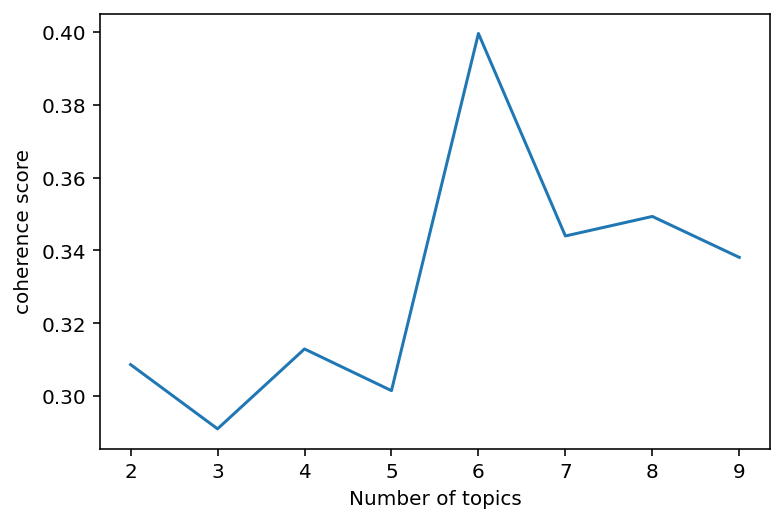

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=6, id2word = dictionary, random_state=100)

In [ ]:
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working



<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 6개  
 - 그래프 왼쪽에서 1부터 6까지의 토픽 확인 가능  
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 6개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 세 부분으로 나뉨 [1,2,4,5], [3], [6]


 - 상위 5개 단어 확인
 - [1] : 좋다, 편하다, 사용, 이용, 있다
 - [2] : 있다. 좋다, 저렴하다, 이용, 곳
 - [4] : 좋다, 이용, 편하다, 있다, 이다
 - [5] : 유용하다, 좋다, 있다, 저렴하다, 자주
 - [3] : 편리하다, 있다, 예약, 이용, 미리
 - [6] : 편하다, 편리하다, 추천, 업데이트, 입력


 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,2,4,5] : 유용성, 저렴함
  - [3] : 예약기능의 편리성
  - [6] : 사용상 편의성


###2) 불만족 리뷰 (평점 2점 이하)

#### ▶ 토픽모델링

In [ ]:
all_review = df[df['ratings'] <= 2]['comment']

In [ ]:
all_review[:3]

4                          화면이 먹통이예요 계속 다운로드중 이라고만 뜹니다
7    회원가입시 핸드폰 인증을 하는데 왜 pass 로만 인증해야 하나요? 그럴려면 pas...
8    2분 빨리 입차 하였다고 2중 부과시킴. 주차권 사용 불가 및 현장결제 . 환불 불...
Name: comment, dtype: object

In [ ]:
all_review = all_review.apply(lambda x:re.sub('[^가-힣\s\d]',"",x))
all_review

4                            화면이 먹통이예요 계속 다운로드중 이라고만 뜹니다
7      회원가입시 핸드폰 인증을 하는데 왜  로만 인증해야 하나요 그럴려면 에 유료가입 해...
8      2분 빨리 입차 하였다고 2중 부과시킴 주차권 사용 불가 및 현장결제  환불 불가 ...
10                  가 너무 조잡해요 너무 복잡하고 간결하지 않아서 잘 손이 안가네요
11     앱 시스템 정말 바보 같아요 십년 전 개인 개발자가 취미 삼아 만든 것 같은 퀄리티...
15     별 하나도 아까워요 제가 리뷰 많이 남기는 편도 아니고 컴플레인을 하는 사람도 아니...
16             제휴주차장이라 해놓고 클릭하면 전부 이용이 불가능하대 그럴거면 왜표시해놧냐
19                            회원가입이 안됨 시도만 10번 넘게 시간만 날림
25                                결제 오류 계속 떠서 포기 시간만 날렸네
26     앱이 정말 사용자가 사용하기 힘드네요 아니 사용못합니다 회원결재 정보 등록하고 쿠폰...
28                                        달라는 권한이 왜 이따구냐
29     충전금 환불요구요 광림교회사회봉사관 앱할인가 일 8000원이라 해서 충전하고 이용하...
31                     사기임 해당주차장에서는 파킹박과 무관하다며 원래대로 다받음 
32               안드로이드에서는 로그인이 되는데 아이폰에서는 왜 안되죠 왜 안되는건가요
35     지하철 공영주차장 확인 하려고 다운받았는데 너무업데이트가 안되있고 배곧 공영주차장이...
40     회원가입 어떻게 하나요 회원가입하다 중복닉넴이라고 하더니 아예 가입이 안되네요 어떻...
44                  가 정말 그지같음 개발하신분은 한번이라도 사용해보셨는지 모르겠네요
47                             

In [ ]:
all_review = all_review.to_list()

In [ ]:
all_review[:10]

['화면이 먹통이예요 계속 다운로드중 이라고만 뜹니다',
 '회원가입시 핸드폰 인증을 하는데 왜  로만 인증해야 하나요 그럴려면 에 유료가입 해야하는데 그걸 유도하는 건가요',
 '2분 빨리 입차 하였다고 2중 부과시킴 주차권 사용 불가 및 현장결제  환불 불가 절대 비추입니다',
 ' 가 너무 조잡해요 너무 복잡하고 간결하지 않아서 잘 손이 안가네요',
 '앱 시스템 정말 바보 같아요 십년 전 개인 개발자가 취미 삼아 만든 것 같은 퀄리티 업데이트 좀 하세요',
 '별 하나도 아까워요 제가 리뷰 많이 남기는 편도 아니고 컴플레인을 하는 사람도 아니고 심지어 옷이 작아도 환불 교환하는 사람도 아닌데요',
 '제휴주차장이라 해놓고 클릭하면 전부 이용이 불가능하대 그럴거면 왜표시해놧냐',
 '회원가입이 안됨 시도만 10번 넘게 시간만 날림',
 '결제 오류 계속 떠서 포기 시간만 날렸네',
 '앱이 정말 사용자가 사용하기 힘드네요 아니 사용못합니다 회원결재 정보 등록하고 쿠폰있나해서 쿠폰등록 눌러보고 없어서 뒤로 가려는데 아무리 찾아도 뒤로 가기가 없어요 버튼 하나 만들어주심이']

In [ ]:
review_stop_words = "은 이 것 등 더 를 좀 즉 인 때 거 주차장 주차 어플 앱 파킹박"  # 주차장, 주차, 어플, 앱 처럼 너무 많이 나오는 단어제거/ 어플 이름 관련 단어 제거
review_stop_words = review_stop_words.split(' ')
review_stop_words

['은',
 '이',
 '것',
 '등',
 '더',
 '를',
 '좀',
 '즉',
 '인',
 '때',
 '거',
 '주차장',
 '주차',
 '어플',
 '앱',
 '파킹박']

In [ ]:
tagger = Okt()

In [ ]:
# 명사, 형용사만
texts = []

for review in all_review:
    okt_pos = tagger.pos(review, norm=True, stem=True)
    okt_filtering = [x for x, y in okt_pos if y in ['Noun', 'Adjective']]
    stopped_tokens = [i for i in okt_filtering if not i in review_stop_words]
    if len(stopped_tokens) > 0:
      texts.append(stopped_tokens)
  
texts[:10]

[['화면', '먹통', '계속', '다운로드'],
 ['회원',
  '입시',
  '핸드폰',
  '인증',
  '왜',
  '로만',
  '인증',
  '하나요',
  '그렇다',
  '유료',
  '가입',
  '유도',
  '건가'],
 ['입차', '중', '부과', '시킴', '사용', '불가', '및', '현장', '결제', '환불', '불가', '절대', '이다'],
 ['조잡하다', '복잡하다', '간결하다', '손'],
 ['시스템', '정말', '바보', '같다', '십년', '전', '개인', '개발자', '취미', '같다', '퀄리티', '업데이트'],
 ['별',
  '하나',
  '아깝다',
  '제',
  '리뷰',
  '편도',
  '아니다',
  '컴',
  '플레인',
  '사람',
  '아니다',
  '심지어',
  '옷',
  '작다',
  '환불',
  '교환',
  '사람',
  '아니다'],
 ['제휴', '클릭', '전부', '이용', '불가능하다', '그렇다', '왜표시해놧'],
 ['회원', '가입', '안되다', '시도', '번', '시간', '날림'],
 ['결제', '오류', '계속', '포기', '시간'],
 ['정말',
  '사용자',
  '사용',
  '힘드다',
  '아니다',
  '사용',
  '회원',
  '결재',
  '정보',
  '등록',
  '쿠폰',
  '있다',
  '쿠폰',
  '등록',
  '보고',
  '없다',
  '뒤',
  '뒤',
  '가기',
  '없다',
  '버튼',
  '하나',
  '주심']]

In [ ]:
dictionary = corpora.Dictionary(texts)

In [ ]:
dictionary.save("dic")
dictionary=corpora.Dictionary.load("dic")

In [ ]:
print(dictionary.token2id)

{'계속': 0, '다운로드': 1, '먹통': 2, '화면': 3, '가입': 4, '건가': 5, '그렇다': 6, '로만': 7, '왜': 8, '유도': 9, '유료': 10, '인증': 11, '입시': 12, '하나요': 13, '핸드폰': 14, '회원': 15, '결제': 16, '및': 17, '부과': 18, '불가': 19, '사용': 20, '시킴': 21, '이다': 22, '입차': 23, '절대': 24, '중': 25, '현장': 26, '환불': 27, '간결하다': 28, '복잡하다': 29, '손': 30, '조잡하다': 31, '같다': 32, '개발자': 33, '개인': 34, '바보': 35, '시스템': 36, '십년': 37, '업데이트': 38, '전': 39, '정말': 40, '취미': 41, '퀄리티': 42, '교환': 43, '리뷰': 44, '별': 45, '사람': 46, '심지어': 47, '아깝다': 48, '아니다': 49, '옷': 50, '작다': 51, '제': 52, '컴': 53, '편도': 54, '플레인': 55, '하나': 56, '불가능하다': 57, '왜표시해놧': 58, '이용': 59, '전부': 60, '제휴': 61, '클릭': 62, '날림': 63, '번': 64, '시간': 65, '시도': 66, '안되다': 67, '오류': 68, '포기': 69, '가기': 70, '결재': 71, '뒤': 72, '등록': 73, '버튼': 74, '보고': 75, '사용자': 76, '없다': 77, '있다': 78, '정보': 79, '주심': 80, '쿠폰': 81, '힘드다': 82, '구': 83, '권한': 84, '달라': 85, '이따': 86, '관': 87, '광림': 88, '교회': 89, '구매': 90, '금': 91, '봉사': 92, '불가라': 93, '사회': 94, '요구': 95, '일': 96, '충전': 97, '할인': 98, '무관'

In [ ]:
corpus = [dictionary.doc2bow(text) for text in texts] 
corpus

[[(0, 1), (1, 1), (2, 1), (3, 1)],
 [(4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1)],
 [(16, 1),
  (17, 1),
  (18, 1),
  (19, 2),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1)],
 [(28, 1), (29, 1), (30, 1), (31, 1)],
 [(32, 2),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1)],
 [(27, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 2),
  (47, 1),
  (48, 1),
  (49, 3),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1)],
 [(6, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1)],
 [(4, 1), (15, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1)],
 [(0, 1), (16, 1), (65, 1), (68, 1), (69, 1)],
 [(15, 1),
  (20, 2),
  (40, 1),
  (49, 1),
  (56, 1),
  (70, 1),
  (71, 1),
  (72, 2),
  (73, 2),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 2),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 2),
  (82, 1)],
 [

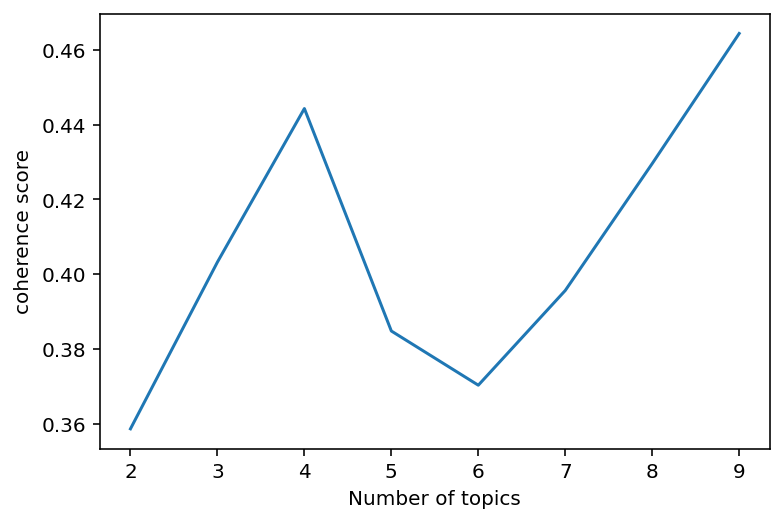

In [ ]:
coherence_values = []
for i in range(2,10):
    ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=i, id2word = dictionary, random_state=100)
    coherence_model_lda = CoherenceModel(model=ldamodel, texts=texts, dictionary=dictionary,topn=10)
    coherence_lda = coherence_model_lda.get_coherence()
    coherence_values.append(coherence_lda)

x = range(2,10)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("coherence score")
plt.show()


In [ ]:
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=4, id2word = dictionary, random_state=100)

In [ ]:
prepared_data = gensimvis.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(prepared_data)

<리뷰데이터에 대한 토픽모델링 결과>
 - coherence model 이용하여 확인한 최적의 토픽갯수: 4개  
 - 그래프 왼쪽에서 1부터 4 토픽 확인 가능  
 - λ값 0.5로 설정하여 토픽의 구성단어 확인함
 - 4개로 나뉘지만 가까이 있거나 겹치는 토픽을 하나로 보면 크게 세 부분으로 나뉨 [1,4], [2], [3]


 - 상위 5개 단어 확인
  - [1] : 오류, 가입, 안되다, 아니다, 환불
  - [4] : 이용, 아니다, 결제, 왜, 후
  - [2] : 안되다, 없다, 뒤, 회원, 사용
  - [3] : 동의, 이용, 없다, 약관, 업데이트


 - 토픽에 포함된 단어들을 종합적으로 확인하여, 이를 토대로 토픽 주제설정
  - [1,4] : 결제관련 오류
  - [2] : 앱 이용 불편사항
  - [3] : 회원가입 관련 오류


###3)  결론
- 만족 리뷰를 토픽모델링 한 결과 만족 원인은 크게 세 가지로, 유용성 및 저렴한 주차비, 예약기능의 편리성, 사용상 편의성과 관련된 것임을 확인할 수 있다.
- 불만족 리뷰를 토픽모델링 한 결과 불만족 원인은 크게 세 가지로, 결제관련 오류의 발생, 앱 이용시 불편사항, 회원가입 오류와 관련된 것임을 확인할 수 있다.

#▪ 앱별 토픽모델링 결과 비교 분석

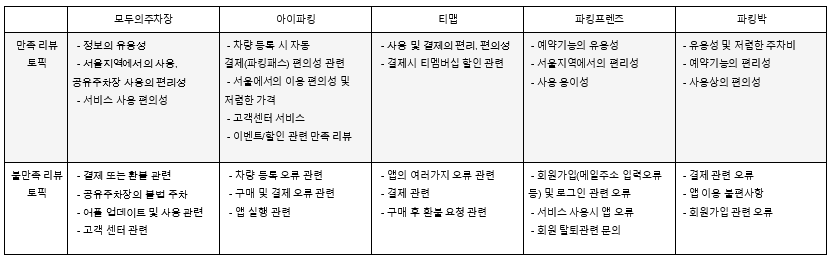

앱별로 만족리뷰와 불만족리뷰를 나누어 토픽모델링을 실시한 결과를 통해 이용회원이 체감하는 앱의 장점과 단점을 개략적으로 유추해 보았다.

<만족 리뷰 토픽>
  - 주차장앱을 이용하는 회원들은 대체적으로 서울지역에서 앱 사용시에 편리함을 느끼며, 앱을 통해 유용한 정보를 얻고 주차장을 쉽게 이용할 수 있다는 점에서 큰 만족을 느끼고 있는 것으로 보인다. 

    - 다른 앱과 두드러지는 만족 리뷰 토픽
        - 모두의주차장의 경우 앱을 통해 일반 주차장 뿐만 아니라 공유 주차장의 등록과 사용이 활발하게 이루어지고 있었다. 회원들이 공유주차장 사용에 편리함을 느끼고 있는 것으로 보인다.
        - 아이파킹의 경우에는 관제시스템을 갖춘 주차장을 확보하고 있어 차량과 결제정보 등록시 자동결제가 가능하다. 회원들이 자동결제 기능에 편리함을 느끼고 있는 것으로 보인다.
        - 티맵주차의 경우에는 주차 결제시 티멤버십할인이 적용된다. 티멤버십의 다양한 할인 기능에 회원들이 만족을 느끼는 것으로 예상된다.


  <불만족 리뷰 토픽>
- 주차장앱을 이용하는 회원들은 공통적으로 결제 또는 환불에 관련한 불만 사항과 앱 사용시 발생하는 오류로 인한 불만 리뷰가 많은것으로 보인다.

    - 다른 앱과 두드러지는 불만족 리뷰 토픽
        - 모두의주차장은 핵심 서비스중 하나로 공유주차장(개인의 주차공간을 타인과 공유하여 수익을 창출할 수 있는 서비스)서비스를 운영하고 있는데, 공유된 주차장에 불법주차가 되어있어 불편을 겪고 있는 회원들이 불편을 겪고 있는 것으로 보인다.
        - 아이파킹은 차량등록 단계에서 오류가 발생하여 자동결제 기능을 이용하고자 하는 회원들이 불편을 겪고 있는 것으로 예상된다.
        - 파킹프렌즈와 파킹박의 경우 회원가입에서부터 오류가 발생하여 해당 서비스를 이용해보기도 전에 불만족 리뷰가 발생함을 유추해볼 수 있다. 특히나 파킹프렌즈에서는 가입 뿐만아니라 회원탈퇴관련 토픽도 함께 확인되었다. 가입 및 탈퇴의 기본적인 기능에 개선이 필요할 것으로 판단된다. 

#▪ 서비스 개선을 위한 제안


#### 고객 불만 중 가장 많은 것을 차지 했던 부분이 정보 오류와 불법주차, 또 이로인해 발생하는 환불 불만이었다.  
####특히 21년 전체 리뷰 중 1점 불만족의 비율이 가장 컸는데, 문제에 대한 개선이 필요한 것으로 보인다.

- 정보 오류 문제 해결 위해 적극적인 제보장려

: 정보가 신속하고 정확하게 업데이트 되기 위해서는 많은 사람들의 적극적인 제보가 필요하다. '모두의 주차장'앱의 좋은 기능 중 '주차장 정보 수정 요청'과 '새 주차장 알려주기'가 있다. 하지만 사용자 입장에서 정보오류로 문제가 발생해 금전적 또는 시간적 피해를 입었을 경우 화가나서 혹은 가벼운 문제라 귀찮아서 등의 이유로 정보 수정 제보를 하지 않을 경우가 많을 것이라 생각한다. 고객들의 적극적인 제보를 위해 정보 제공자에게 적립금 혹은 쿠폰을 제공하는 방법(현재 진행중인 내용인지는 어플 상으로 확인하지 못함), 주차장 이용 후 후기 or 리뷰작성하는 기능 추가 등의 방법을 생각해 볼 수 있었다.

- 불법주차 문제 해결 위해 공유주차 안내 사이니지 부착

: 불법주차 문제는 고질적인 사회문제로 각 지자체 등과 협의가 필요하다고 생각한다. 바로 근처 공유주차장만 검색해도 아래와 같이 불법주차가 되어 있는 것을 찾을 수 있었다.

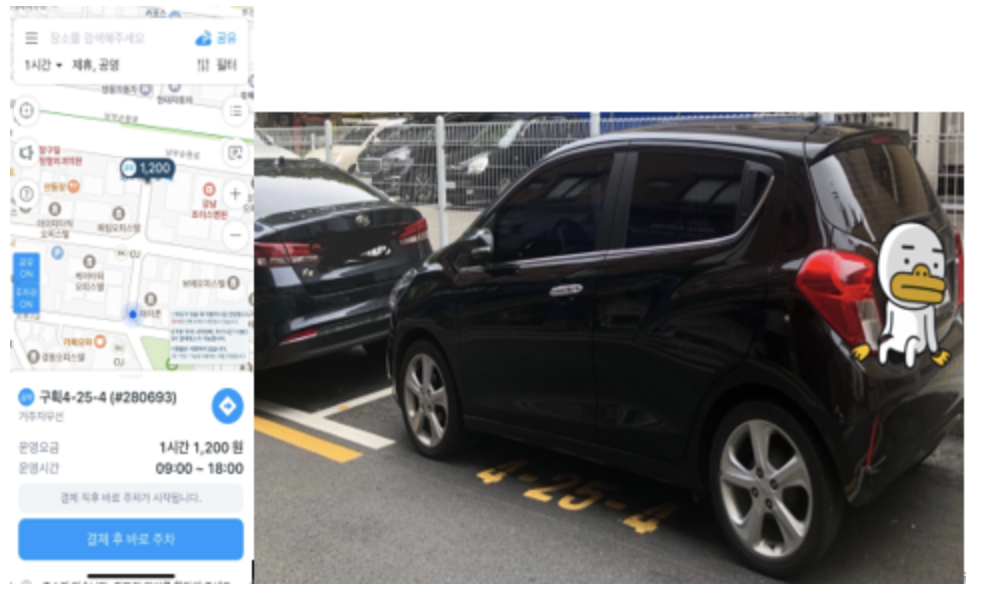

이에 대한 해결방안으로 각 시,구청 등과 협의 하에 공유주차장 등록자에게 ‘유료 공유주차 구역’, ‘불법주차금지’ 등의 안내문구 스티커 1회 무료발급하는 방법을 생각해보았다. 불법주차를 완전히 막을 수는 없겠지만 시각적으로 '유료주차'임을 강조해 불법주차를 1차적으로 막을 수 있고, 일석이조로 모두의주차장 어플 홍보도 될 수 있다고 생각한다.  
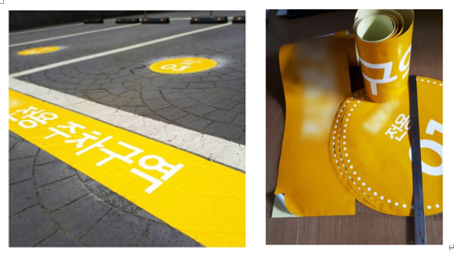

-  서비스 컨텐츠 노출 위한 지속적인 홍보의 필요   
2016년 2월 고객리뷰 수 증가의 이유로 명절 무료주차장 정보 제공, 이벤트와 같은 블로그&페이스북 홍보효과가 있었다. 현재도 블로그와 페이스북 등을 통해 정보제공과 홍보를 하고 있지만, 앞으로도 지속적인 블로그 글 작성(맛집, 시기 별 휴양 명소 소개 등), 다양한 SNS 홍보, 이벤트 제공 등이 필요하다.

- 다양한 기업과의 협업을 통한 시너지효과 창출  
한국의 대표적인 OTT서비스기업인 왓챠는 최근 여러기업과 협업을 통해 독자적인 경쟁력을 확보하고 있다. 한화이글스와 협업을 통해 독자적인 컨텐츠를 제작하기도하고,  소니와 협업해 플레이스테이션5전용 앱을 출시하기도 하며 생태계 확장을 꾀하고 있다.   
이렇듯 다양한 기업과의 협업은 좋은 시너지효과를 낼 수 있다. 현재 모두의주차장은 '타다대리'등의 기업과 협업을 맺고 있는 것을 확인하였다. 기업협업을 다양화 하는 방안으로 맛집검색 컨텐츠 회사인 '망고플레이트'와 협업하여 맛집을 추천하고 모두의주차장을 통해 주차 정보를 제공하는것은 어떨까. 서비스 홍보나 고객 유치에 긍정적인 영향을 줄 수 있을 것이라 생각한다.